<span style="font-family: Arial; font-weight:bold;font-size:2.5em;color:#00b3e5;">UnSupervised Learning Project

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:DarkBlue">Part One

**DOMAIN: Automobile** 

• CONTEXT: The data concerns city-cycle fuel consumption in miles per gallon, to be predicted in terms of 3 multivalued discrete and 5 continuous attributes

• DATA DESCRIPTION: The data concerns city-cycle fuel consumption in miles per gallon 

• Attribute Information: 
1. mpg: continuous
2. cylinders: multi-valued discrete
3. displacement: continuous
4. horsepower: continuous
5. weight: continuous
6. acceleration: continuous
7. model year: multi-valued discrete
8. origin: multi-valued discrete
9. car name: string (unique for each instance) 

• PROJECT OBJECTIVE: Goal is to cluster the data and treat them as individual datasets to train Regression models to predict ‘mpg’

In [1]:
# Importing Libreries
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from scipy import stats
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

In [2]:
os.chdir('D:\\AIML\\GL_Projects\\Unsupervised_Learning')

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> 1.Importing datasets
    
There are two datasets given
    
   1) Part1-Carname.csmv
    
   2) Part1-Car-Attributes.json

In [3]:
# Dataset 1
df1 = pd.read_csv('Part1-Carname.csv')
print(f"Shape of Dataset 1 : {df1.shape}")
print(f"Size of Data1 : {df1.size}")
df1.head()

Shape of Dataset 1 : (398, 1)
Size of Data1 : 398


,car_name
0,chevrolet chevelle malibu
1,buick skylark 320
2,plymouth satellite
3,amc rebel sst
4,ford torino


In [4]:
# data set 2 contains predictors
df2 = pd.read_json('Part1-Car-Attributes.json')
print(f"Shape of Dataset 2 : {df2.shape}")
print(f"Size of Data2 : {df2.size}")
df2.head()

Shape of Dataset 2 : (398, 8)
Size of Data2 : 3184


,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


**Above df2 data is in json and this need to export into csv file and read again as csv.**|

In [5]:
df2.to_csv (r'Part1-Car-Attributes.csv', index = None)
# open the saved csv file and merge with df1 data.
df2 = pd.read_csv('Part1-Car-Attributes.csv')
df2.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin
0,18.0,8,307.0,130,3504,12.0,70,1
1,15.0,8,350.0,165,3693,11.5,70,1
2,18.0,8,318.0,150,3436,11.0,70,1
3,16.0,8,304.0,150,3433,12.0,70,1
4,17.0,8,302.0,140,3449,10.5,70,1


In [6]:
#Combine dataset 1 and 2 
df = pd.concat([df2,df1], axis=1)
print(f"Shape of combined Dataset : {df.shape}")
print(f"Size of combined Dataset : {df.size}")
df.head()

Shape of combined Dataset : (398, 9)
Size of combined Dataset : 3582


,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


**Export final (merged ) data set into csv, excel and json files for future use.**

In [7]:
df.to_csv('Part1-automobile_final_data.csv')

In [8]:
df.to_excel('Part1-automobile_final_data.xlsx')

In [9]:
df.to_json('Part1-automobile_final_data.json')

**Import data from above steps into python**

In [10]:
def importdata(df1,df2):
    print(f"Shape of Dataset 1 : {df1.shape}")
    print(f"Size of Data1 : {df1.size}")
    print("********************")
    df2.to_csv (r'Part1-Car-Attributes.csv', index = None)
# open the saved csv file and merge with df1 data.
    df2 = pd.read_csv('Part1-Car-Attributes.csv')
    print(f"Shape of Dataset 2 : {df2.shape}")
    print(f"Size of Data2 : {df2.size}")
#Combine dataset 1 and 2 
    df = pd.concat([df2,df1], axis=1)
    print(f"Shape of combined Dataset : {df.shape}")
    print(f"Size of combined Dataset : {df.size}")
    df.to_csv('Part1-automobile_final_data.csv')
    df.to_excel('Part1-automobile_final_data.xlsx')
    df.to_json('Part1-automobile_final_data.json')
    return df

**Define what is df1 and df2 and run the above funtion**

In [11]:
os.chdir('D:\\AIML\\GL_Projects\\Unsupervised_Learning')
df1 = pd.read_csv('Part1-Carname.csv')
df2 = pd.read_json('Part1-Car-Attributes.json')
df  = importdata(df1,df2)

Shape of Dataset 1 : (398, 1)
Size of Data1 : 398
********************
Shape of Dataset 2 : (398, 8)
Size of Data2 : 3184
Shape of combined Dataset : (398, 9)
Size of combined Dataset : 3582


In [12]:
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
0,18.0,8,307.0,130,3504,12.0,70,1,chevrolet chevelle malibu
1,15.0,8,350.0,165,3693,11.5,70,1,buick skylark 320
2,18.0,8,318.0,150,3436,11.0,70,1,plymouth satellite
3,16.0,8,304.0,150,3433,12.0,70,1,amc rebel sst
4,17.0,8,302.0,140,3449,10.5,70,1,ford torino


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> 2.Data Cleansing

** Missing/incorrect value treatment**

In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 398 entries, 0 to 397
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   mpg       398 non-null    float64
 1   cyl       398 non-null    int64  
 2   disp      398 non-null    float64
 3   hp        398 non-null    object 
 4   wt        398 non-null    int64  
 5   acc       398 non-null    float64
 6   yr        398 non-null    int64  
 7   origin    398 non-null    int64  
 8   car_name  398 non-null    object 
dtypes: float64(3), int64(4), object(2)
memory usage: 28.1+ KB


**But why is horsepower an object and not a float, the values we saw above were clearly numbers**

In [14]:
df.hp.unique()

array(['130', '165', '150', '140', '198', '220', '215', '225', '190',
       '170', '160', '95', '97', '85', '88', '46', '87', '90', '113',
       '200', '210', '193', '?', '100', '105', '175', '153', '180', '110',
       '72', '86', '70', '76', '65', '69', '60', '80', '54', '208', '155',
       '112', '92', '145', '137', '158', '167', '94', '107', '230', '49',
       '75', '91', '122', '67', '83', '78', '52', '61', '93', '148',
       '129', '96', '71', '98', '115', '53', '81', '79', '120', '152',
       '102', '108', '68', '58', '149', '89', '63', '48', '66', '139',
       '103', '125', '133', '138', '135', '142', '77', '62', '132', '84',
       '64', '74', '116', '82'], dtype=object)

**We can observe '?' in the hp column**

In [15]:
df[df['hp']== "?"]

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,?,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,?,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,?,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,?,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,?,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,?,3035,20.5,82,1,amc concord dl


In [16]:
df['hp']=df['hp'].replace("?","NaN")

In [17]:
df[df['hp']== "NaN"]

,mpg,cyl,disp,hp,wt,acc,yr,origin,car_name
32,25.0,4,98.0,NaN,2046,19.0,71,1,ford pinto
126,21.0,6,200.0,NaN,2875,17.0,74,1,ford maverick
330,40.9,4,85.0,NaN,1835,17.3,80,2,renault lecar deluxe
336,23.6,4,140.0,NaN,2905,14.3,80,1,ford mustang cobra
354,34.5,4,100.0,NaN,2320,15.8,81,2,renault 18i
374,23.0,4,151.0,NaN,3035,20.5,82,1,amc concord dl


In [18]:
df.hp = df.hp.astype('float')
df.dtypes

mpg         float64
cyl           int64
disp        float64
hp          float64
wt            int64
acc         float64
yr            int64
origin        int64
car_name     object
dtype: object

**Replace NaN with mean in hp Column**


In [19]:
df['hp'].fillna(df['hp'].mean(),inplace = True)
df.hp.unique()

array([130.        , 165.        , 150.        , 140.        ,
       198.        , 220.        , 215.        , 225.        ,
       190.        , 170.        , 160.        ,  95.        ,
        97.        ,  85.        ,  88.        ,  46.        ,
        87.        ,  90.        , 113.        , 200.        ,
       210.        , 193.        , 104.46938776, 100.        ,
       105.        , 175.        , 153.        , 180.        ,
       110.        ,  72.        ,  86.        ,  70.        ,
        76.        ,  65.        ,  69.        ,  60.        ,
        80.        ,  54.        , 208.        , 155.        ,
       112.        ,  92.        , 145.        , 137.        ,
       158.        , 167.        ,  94.        , 107.        ,
       230.        ,  49.        ,  75.        ,  91.        ,
       122.        ,  67.        ,  83.        ,  78.        ,
        52.        ,  61.        ,  93.        , 148.        ,
       129.        ,  96.        ,  71.        ,  98.  

In [20]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
mpg,398.0,23.514573,7.815984,9.0,17.500,23.0,29.000,46.6
cyl,398.0,5.454774,1.701004,3.0,4.000,4.0,8.000,8.0
disp,398.0,193.425879,104.269838,68.0,104.250,148.5,262.000,455.0
hp,398.0,104.469388,38.199187,46.0,76.000,95.0,125.000,230.0
wt,398.0,2970.424623,846.841774,1613.0,2223.750,2803.5,3608.000,5140.0
acc,398.0,15.568090,2.757689,8.0,13.825,15.5,17.175,24.8
yr,398.0,76.010050,3.697627,70.0,73.000,76.0,79.000,82.0
origin,398.0,1.572864,0.802055,1.0,1.000,1.0,2.000,3.0


**We could see deviation between mean and median for 'cyl', 'disp','hp',wt' and 'origin'.**

# Perform another kind of corrections/treatment on the data.

**Car name actually contains two useful bits of information: the cars manufacturer and the model. We split that into two new columns.**

In [21]:
# split() with expand=True yields one column per list element
# we only split on the first space by setting n=1
df[["manufacturer", "model"]] = df["car_name"].str.split(" ", n=1, expand=True)
df.drop("car_name", axis=1, inplace=True)
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,manufacturer,model
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet,chevelle malibu
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick,skylark 320
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth,satellite
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc,rebel sst
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford,torino


In [22]:
print(len(df.manufacturer.unique()))
df.manufacturer.unique()

37


array(['chevrolet', 'buick', 'plymouth', 'amc', 'ford', 'pontiac',
       'dodge', 'toyota', 'datsun', 'volkswagen', 'peugeot', 'audi',
       'saab', 'bmw', 'chevy', 'hi', 'mercury', 'opel', 'fiat',
       'oldsmobile', 'chrysler', 'mazda', 'volvo', 'renault', 'toyouta',
       'maxda', 'honda', 'subaru', 'chevroelt', 'capri', 'vw',
       'mercedes-benz', 'cadillac', 'mercedes', 'vokswagen', 'triumph',
       'nissan'], dtype=object)

**There are several errors in the manufacturers names. E.g. «vokswagen», «maxda» etc. We fix these by replacing the wrong entries. We also fix some synomyms like «vw».**

In [23]:
errors = {
         "vokswagen" : "volkswagen", 
         "vw" : "volkswagen", 
         "toyouta" : "toyota", 
         "mercedes-benz" : "mercedes", 
         "chevroelt": "chevrolet",
         "chevy" : "chevrolet", 
         "maxda" : "mazda"
         }

df.manufacturer = df.manufacturer.map(errors).fillna(df.manufacturer)

In [24]:
print(len(df.manufacturer.unique()))
df.manufacturer.unique()

30


array(['chevrolet', 'buick', 'plymouth', 'amc', 'ford', 'pontiac',
       'dodge', 'toyota', 'datsun', 'volkswagen', 'peugeot', 'audi',
       'saab', 'bmw', 'hi', 'mercury', 'opel', 'fiat', 'oldsmobile',
       'chrysler', 'mazda', 'volvo', 'renault', 'honda', 'subaru',
       'capri', 'mercedes', 'cadillac', 'triumph', 'nissan'], dtype=object)

# Drop attribute/s if required using relevant functional knowledge

**Car model doesnt influence in predicting mpg**

**Offcourse car manufacturer and origin doesnt influnce but we can understand which origin or manufacturer having fuel efficient cars.**

In [25]:
#dropping/ignoring model
df = df.drop(['model'], axis=1)
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,manufacturer
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">3.Data analysis & visualisation

<span style="font-family: Arial; font-weight:bold;font-size:1.0em;color:#00b3e5;"> Univariate and Bivariate Analysis


<AxesSubplot:>

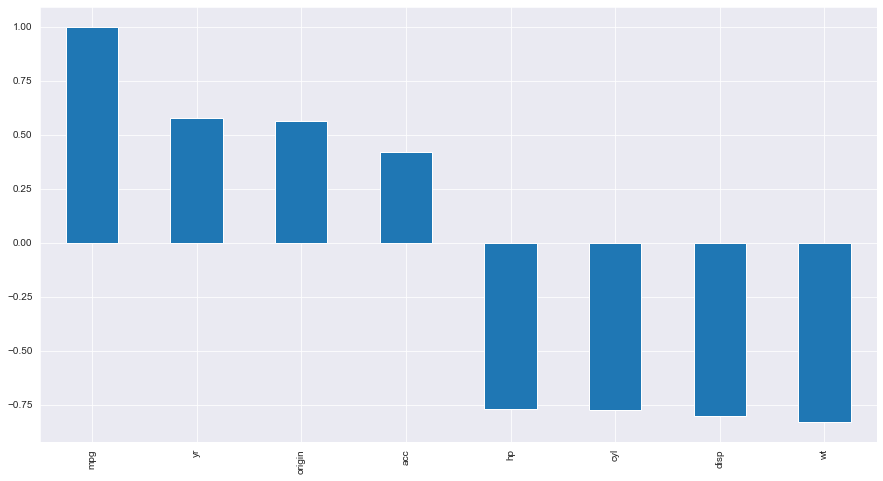

In [26]:
plt.figure(figsize=(15,8))
df.corr()['mpg'].sort_values(ascending = False).plot(kind='bar')

**hp, cyl, disp and wt are inversly proportional to mpg.**
so as weight of vehicle increases or engine with more cylinders, horse power and piston displacement increases than miles per gallon decreases. So ultimatly fuel consumption will be more.


**year, origin and acc are directly proportional to mpg**

<AxesSubplot:title={'center':'acc'}, xlabel='acc', ylabel='Density'>

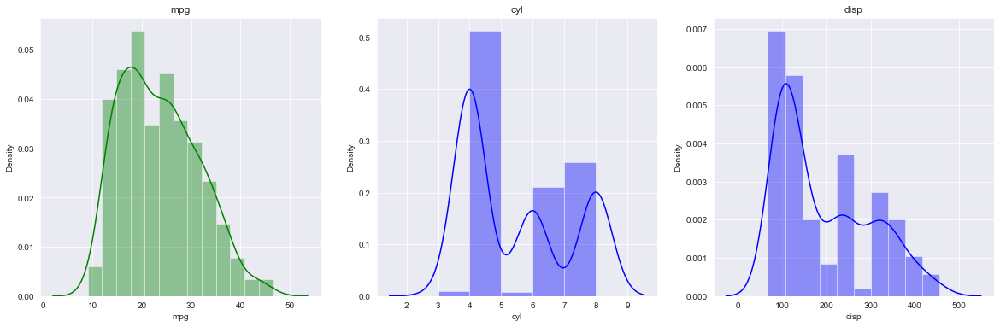

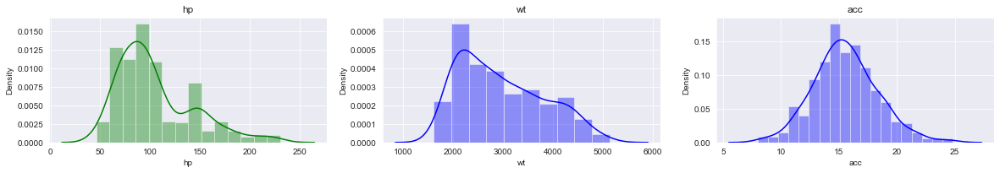

In [27]:
plt.figure(figsize=(20,6))
plt.subplot(1, 3, 1)
plt.title('mpg')
sns.distplot(df['mpg'],color='green')

# subplot 2
plt.subplot(1, 3, 2)
plt.title('cyl')
sns.distplot(df['cyl'],color='blue')

# subplot 3
plt.subplot(1, 3, 3)
plt.title('disp')
sns.distplot(df['disp'],color='blue')

plt.figure(figsize=(20,6))
plt.subplot(2, 3, 1)
plt.title('hp')
sns.distplot(df['hp'],color='green')

# subplot 2
plt.subplot(2, 3, 2)
plt.title('wt')
sns.distplot(df['wt'],color='blue')

# subplot 3
plt.subplot(2, 3, 3)
plt.title('acc')
sns.distplot(df['acc'],color='blue')



**mpg** is normally distributed with little skew and more number of vehicles  in the range 10-30 miles per gallon and very few in the range 30-40mpg.

4 **cylinder** vehicles are more and nest is 8 and 6 cylinders.

And indeed: horsepower and wt appears more skewed than the other variables. acceleration in turn almost looks normally distributed.


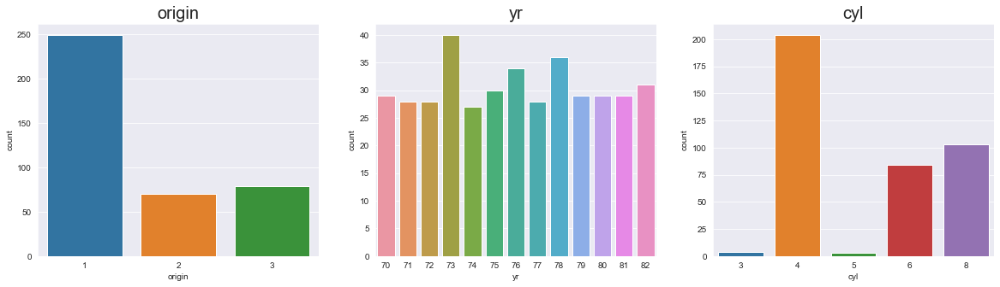

In [28]:
fig, ax = plt.subplots(1, 3)
#sns.set(font_scale=1)
fig.set_figheight(5)
fig.set_figwidth(20)
sns.countplot(x='origin',data=df, ax=ax[0])
sns.countplot(x='yr',data=df,ax=ax[1])
sns.countplot(x='cyl',data=df, ax=ax[2])
ax[0].set_title("origin",fontsize=20)
ax[1].set_title('yr',fontsize=20)
ax[2].set_title('cyl',fontsize=20)
plt.show()


**Majority of cars are from origin 1**

**398 different cars from 1970 to 1982**

**Majority of cars having 4 cylinder engine and next is 8 and 6 cylinder engine**


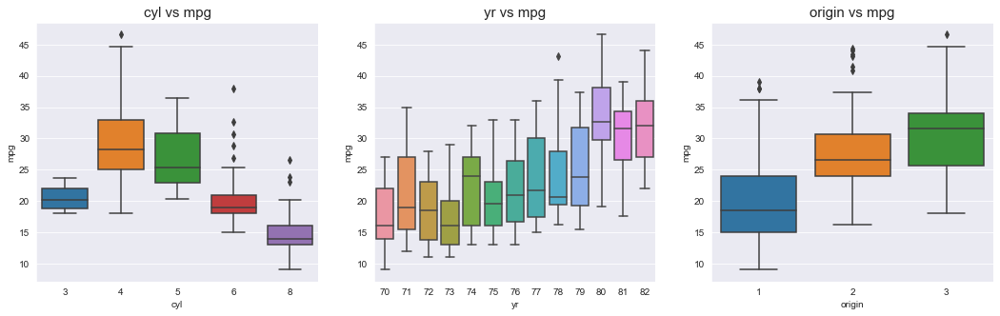

In [29]:
fig, ax = plt.subplots(1, 3)
fig.set_figheight(5)
fig.set_figwidth(18)
sns.boxplot(x='cyl', y ='mpg', data=df, ax=ax[0])
sns.boxplot(x='yr', y ='mpg', data= df, ax=ax[1])
sns.boxplot(x='origin', y='mpg',data=df, ax=ax[2])
ax[0].set_title("cyl vs mpg",fontsize=15)
ax[1].set_title('yr vs mpg',fontsize=15)
ax[2].set_title('origin vs mpg',fontsize=15)
plt.show()

**Fuel efficiency increases with increase in mpg**

The general trend for the mpg as the number of cylinders increased was down. The more cylinders you had the worse off your mpg was. The best number of cylinders to have seems like 4, 4 cylinders had the best mpg

It seems as if as the years progressed the general mpg values increased too. I am guessing with improved engineering the mpg would have been expected to improve with time.

I am not sure what the corresponding actual names for the places of origin are but it seems like cars that came from region 3 had the best mpg with region 1 having the worst of the three regions



<Figure size 1440x1440 with 0 Axes>

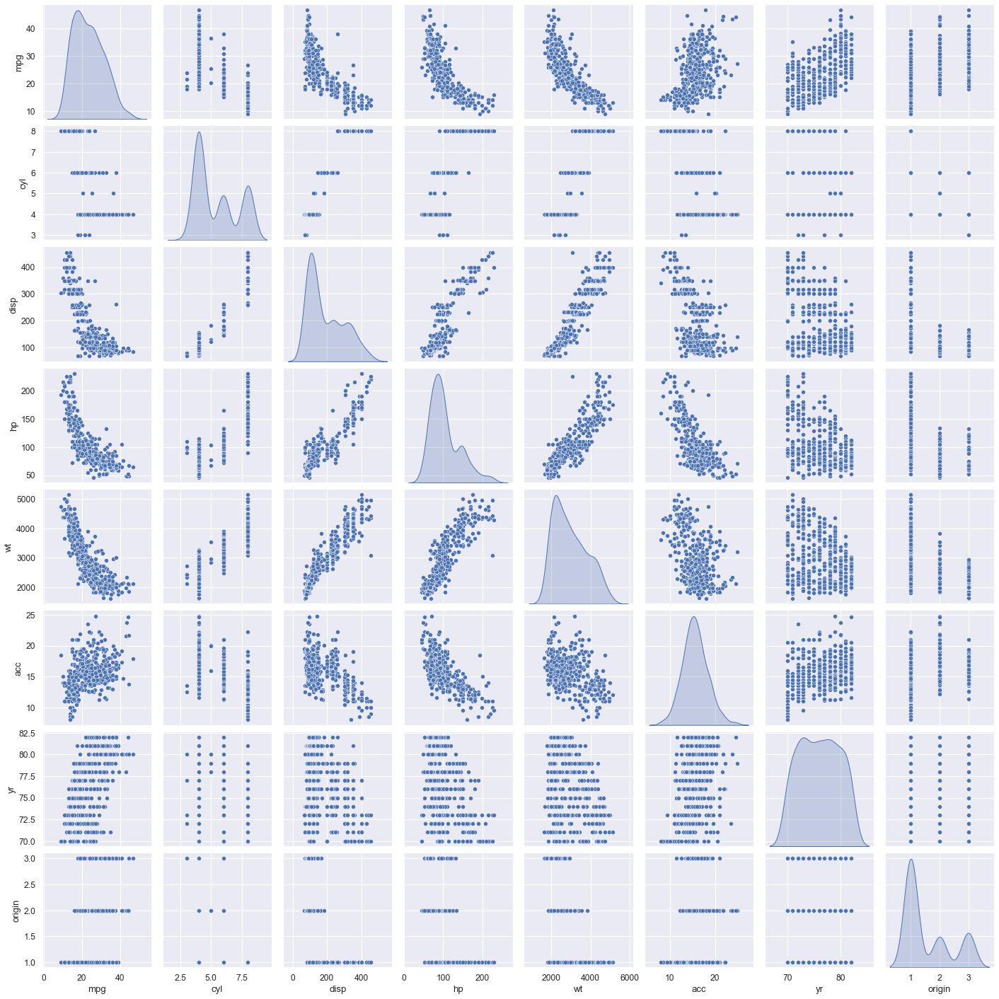

In [30]:
plt.figure(figsize=(20,20))
sns.set(font_scale=1.1)
sns.pairplot(data=df, diag_kind='kde')
plt.show();

**mpg is negatively much correlataed with wt, disp and hp.**

**disp, wt and hp are positively correlated with each other and negatively correlated with acceleration.**

**By visually, we can understand that number of clusters can be 3, but need to check elbow method for accurate value.**

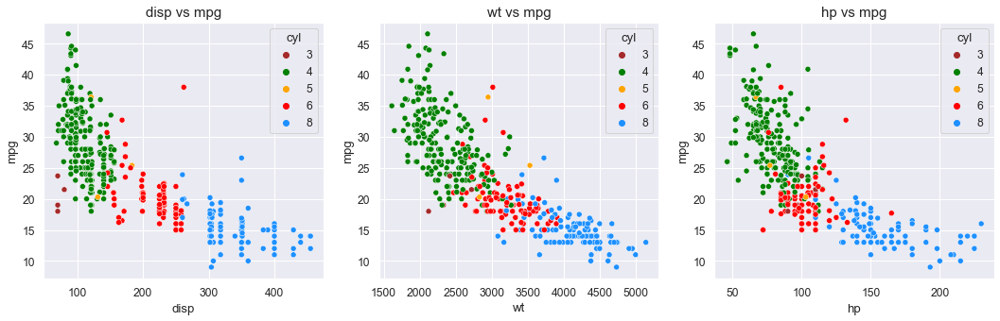

In [31]:
color_dict = dict({3:'brown',
                  4:'green',
                  5: 'orange',
                  6: 'red',
                   8: 'dodgerblue'})
fig, ax = plt.subplots(1, 3)
fig.set_figheight(5)
fig.set_figwidth(18)
sns.scatterplot(x="disp", y="mpg",data=df, hue="cyl", palette = color_dict, ax=ax[0])
sns.scatterplot(x="wt", y="mpg",data=df, hue="cyl", palette = color_dict, ax=ax[1])
sns.scatterplot(x="hp", y="mpg",data=df, hue="cyl", palette = color_dict, ax=ax[2])
ax[0].set_title("disp vs mpg",fontsize=15)
ax[1].set_title('wt vs mpg',fontsize=15)
ax[2].set_title('hp vs mpg',fontsize=15)
plt.show()


From above its proved that fuel efficiency decreases as increase in disp, wt and hp. Also 4 cylinder engine as very good fuel efficiency than others.

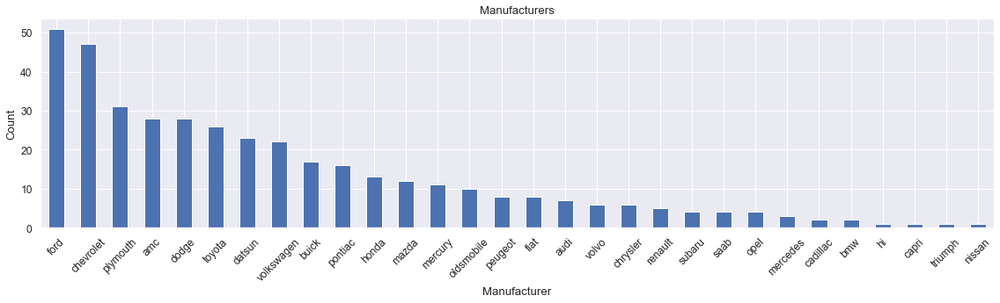

In [32]:
plt.figure(figsize=(16,5));
df.groupby("manufacturer")["manufacturer"].count().sort_values(ascending=False).plot(kind="bar")
plt.title("Manufacturers")
plt.ylabel("Count")
plt.xlabel("Manufacturer")
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

30 different manufactures produce 398 different models, a few of them are dominating like ford and chevrolet.

<AxesSubplot:xlabel='mpg', ylabel='yr'>

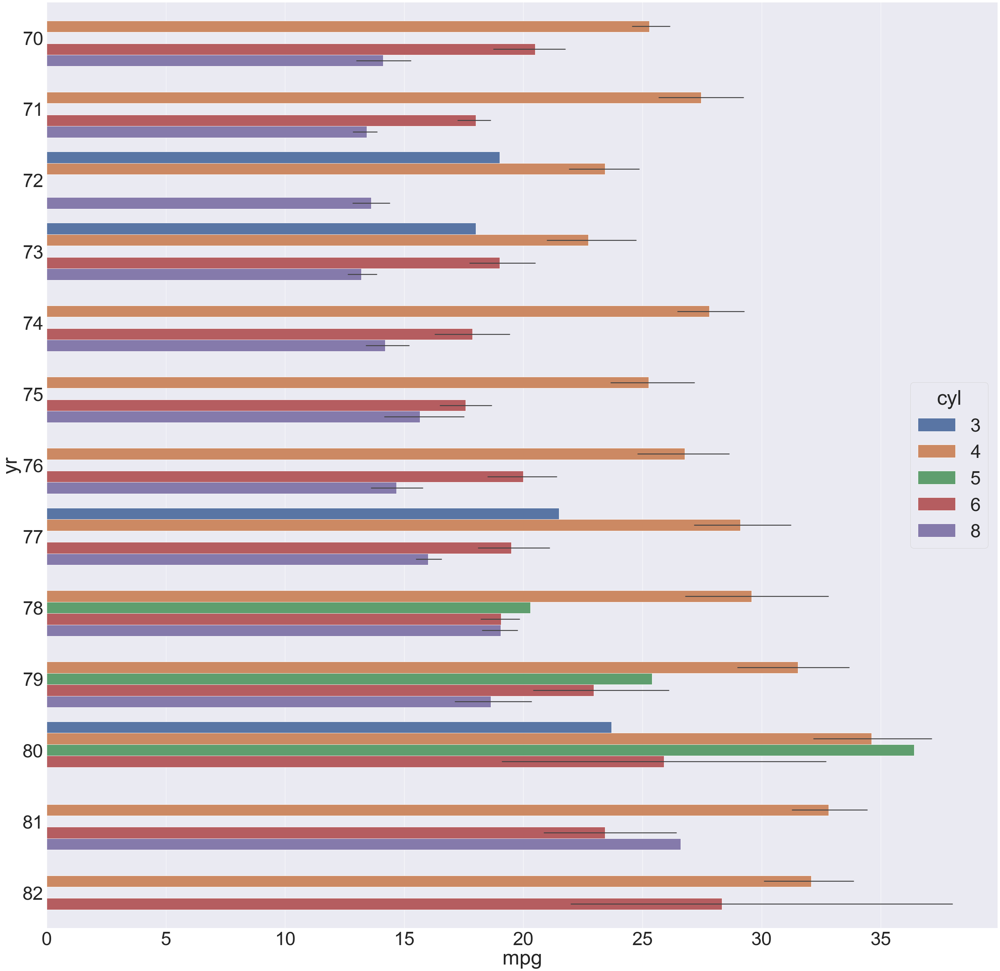

In [33]:
plt.figure(figsize=(50,50))
sns.set(font_scale=5)
fig.suptitle('Summary')
sns.barplot( x="mpg", y="yr", hue="cyl", data=df,orient="h")

**Manufacturing of models with 3 cylinders are gradually decreased and by the year 81 and 82 there are no models manufactured with 3 cylinder engine**

**Fuel efficiency of models with 3 cylinder out performed in all years but expect in the year 1980, where models with 5 cylinder engine showing best fuel efficient cars.**

**In the year 82,  companies have manufactured cars with only 4 and 6 cylinder engine.**

<AxesSubplot:xlabel='mpg', ylabel='yr'>

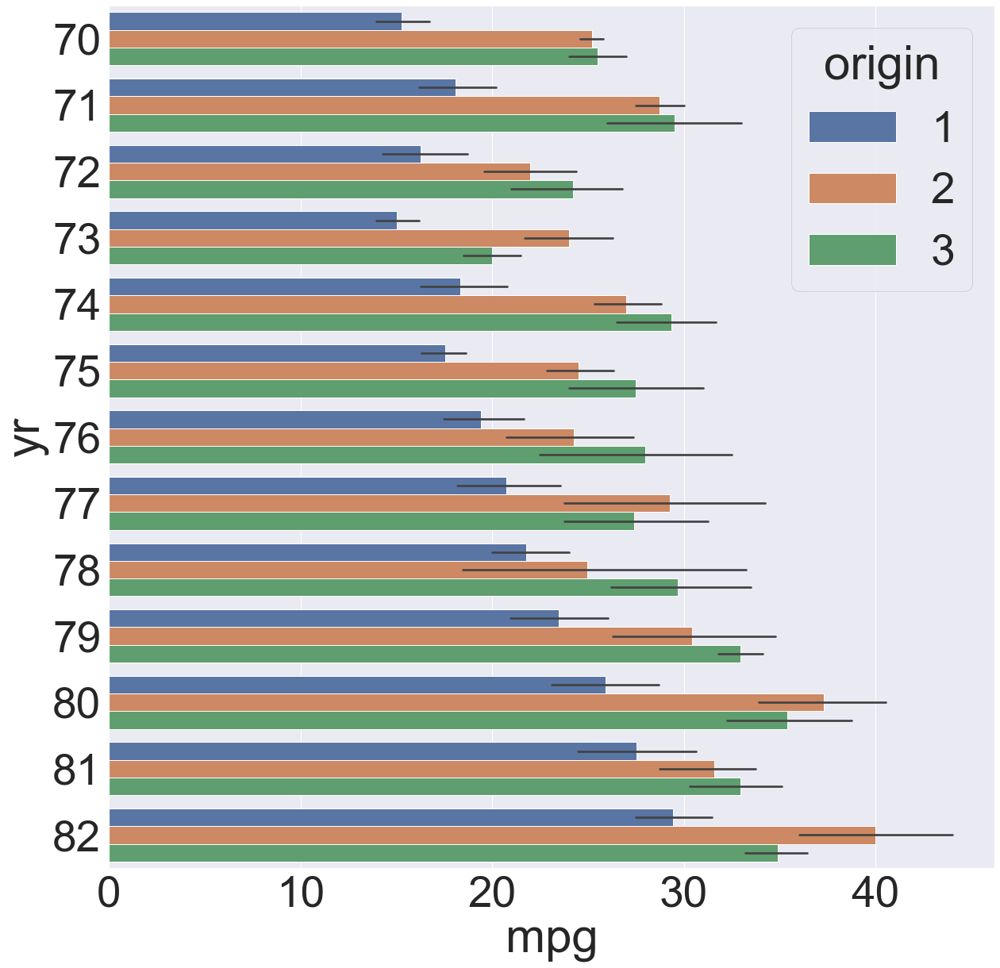

In [34]:
plt.figure(figsize=(20,20))
sns.set(font_scale=5)
fig.suptitle('Summary')
sns.barplot( x="mpg", y="yr", hue="origin", data=df,orient="h")

**There are many models manufactured from origin 1, but most fuel efficient cars are manufactures from origin 2 and 3**

<AxesSubplot:xlabel='mpg', ylabel='cyl'>

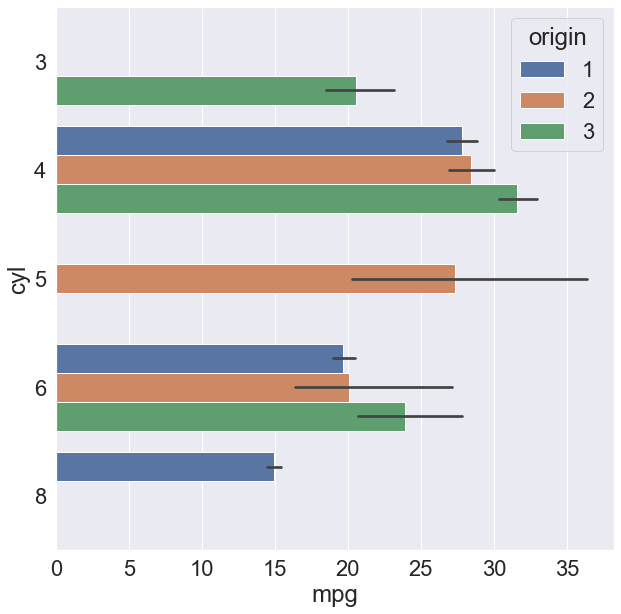

In [35]:
plt.figure(figsize=(10,10))
sns.set(font_scale=2)
fig.suptitle('Summary')
sns.barplot( x="mpg", y="cyl", hue="origin", data=df,orient="h")

**Most fuel efficient cars with 4 cylider engine are from origin 3**

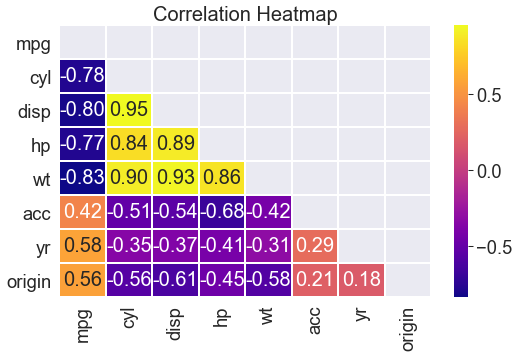

In [36]:
# Checking Correlation Heatmap
plt.figure(dpi = 60,figsize= (10,6))
mask = np.triu(np.ones_like(df.corr()))
sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
plt.title('Correlation Heatmap')
plt.show()

cyl, disp, hp and wt are high positively correlated with each other.

mpg is highly negative correlated with wt, hp, disp and cyl.

<span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#00b3e5;"> Hypothesis Testing

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue">Does models manufactured from origin 2 and 3 are more fuel efficient than from origin 1
    
**we are using One way ANOVA statistical test to check means of mpg from origin 1, 2 and 3**
    
 Explanation : The one-way analysis of variance (ANOVA) is used to determine whether there are any statistically significant differences between the means of three or more independent (unrelated) groups. 

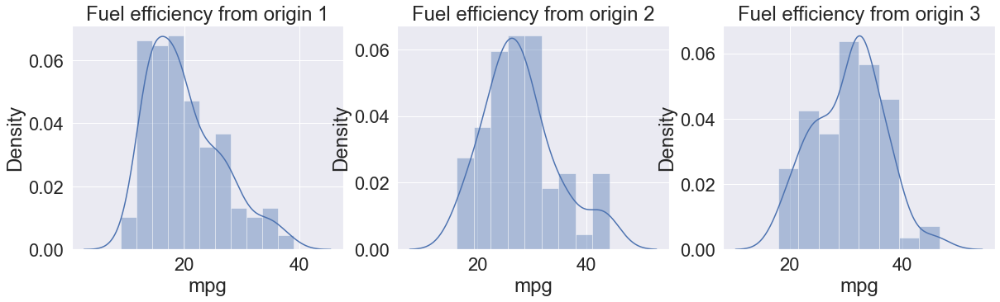

In [37]:
fig, ax = plt.subplots(1, 3)

fig.set_figheight(5)
fig.set_figwidth(20)

sns.distplot(df.loc[df.origin == 1, 'mpg'], ax = ax[0], kde=True)
sns.distplot(df.loc[df.origin == 2, 'mpg'], ax = ax[1], kde=True)
sns.distplot(df.loc[df.origin == 3, 'mpg'], ax = ax[2], kde=True)
ax[0].set_title('Fuel efficiency from origin 1')
ax[1].set_title('Fuel efficiency from origin 2')
ax[2].set_title('Fuel efficiency from origin 3')
plt.show()

**Null hypothesis (Ho)** : There is no difference between the means of mpg from origin 1, 2 and 3

**Alternate hypothesis (Ha)** : There is significant difference between the means of mpg from origin 1, 2 and 3

In [38]:
from sklearn.preprocessing import LabelEncoder
from scipy import stats

sample1 = df.loc[df.origin == 1, 'mpg']
sample2 = df.loc[df.origin == 2, 'mpg']
sample3 = df.loc[df.origin == 3, 'mpg']

alpha = 0.05   # Let's consider a significance level of 5%

test_statistic, p_value = stats.f_oneway(sample1, sample2, sample3)

if p_value <= alpha:
    print(f'Since the p-value, {round(p_value, 3)} < {alpha} (alpha) the difference is significant and we reject the Null hypothesis')
else:
    print(f'''\t Since the p-value, {round(p_value,3)} > {alpha} (alpha) the difference is not significant and,
    \t we fail to reject the Null hypothesis''')
    

Since the p-value, 0.0 < 0.05 (alpha) the difference is significant and we reject the Null hypothesis


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Conclusion of Hypothesis Testing
- From above test we found evidence to state that the models from origin 2 and 3 are more fuel efficient than origin 1**

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue"> Does wt, cyl, hp and disp have significant impact on mpg

- To prove if there is a significant difference or not we will have to perform a hypothesis test
- Since we want to compare the difference in means of the samples, we can either use 2 sample t test or z-test
- For this exercise we shall do both and compare the results
- Since our sample size is reasonably big ( >30 samples), we will go ahead with the aforementioned tests
 

**Null hypothesis (Ho)** : Variables have no significant influence on mpg

**Alternate hypothesis (Ha)** : Variables have significant influence on mpg

In [39]:
from statsmodels.stats.weightstats import ztest
var = ['wt', 'cyl', 'hp', 'disp']
for i in var:
    sample1 = df.mpg
    sample2= df[i]
    alpha =0.05 # Lets consider a significance level is 5%
    test_statistic, p_value = ztest(sample1, sample2)
    if p_value <= alpha:
        print(f'Since the p-value, {round(p_value, 3)} < {alpha} (alpha) the difference is significant and we reject the Null hypothesis')
    else:
        print(f'''\t Since the p-value, {round(p_value,3)} > {alpha} (alpha) the difference is not significant and,
    \t we fail to reject the Null hypothesis''')

Since the p-value, 0.0 < 0.05 (alpha) the difference is significant and we reject the Null hypothesis
Since the p-value, 0.0 < 0.05 (alpha) the difference is significant and we reject the Null hypothesis
Since the p-value, 0.0 < 0.05 (alpha) the difference is significant and we reject the Null hypothesis
Since the p-value, 0.0 < 0.05 (alpha) the difference is significant and we reject the Null hypothesis


<span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#00b3e5;"> 4) Machine learning

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue">K Means

In [40]:
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,origin,manufacturer
0,18.0,8,307.0,130.0,3504,12.0,70,1,chevrolet
1,15.0,8,350.0,165.0,3693,11.5,70,1,buick
2,18.0,8,318.0,150.0,3436,11.0,70,1,plymouth
3,16.0,8,304.0,150.0,3433,12.0,70,1,amc
4,17.0,8,302.0,140.0,3449,10.5,70,1,ford


As mentioned earlier, lets delete origin and manufacturer, as its not influence predicting mpg

In [41]:
df = df.drop(['origin', 'manufacturer'], axis=1)

In [42]:
df.head()

,mpg,cyl,disp,hp,wt,acc,yr
0,18.0,8,307.0,130.0,3504,12.0,70
1,15.0,8,350.0,165.0,3693,11.5,70
2,18.0,8,318.0,150.0,3436,11.0,70
3,16.0,8,304.0,150.0,3433,12.0,70
4,17.0,8,302.0,140.0,3449,10.5,70


In [43]:
df_var = df.iloc[ : , 1:]
df_scaled = df_var.apply(zscore)

In [44]:
df_scaled.head()

,cyl,disp,hp,wt,acc,yr
0,1.498191,1.090604,0.669196,0.630870,-1.295498,-1.627426
1,1.498191,1.503514,1.586599,0.854333,-1.477038,-1.627426
2,1.498191,1.196232,1.193426,0.550470,-1.658577,-1.627426
3,1.498191,1.061796,1.193426,0.546923,-1.295498,-1.627426
4,1.498191,1.042591,0.931311,0.565841,-1.840117,-1.627426


## Group Data into similar clusters

**K-means**

Now, we will use K-Means clustering to group data based on their attribute. First, we need to determine the optimal number of groups. For that we conduct the elbow test to see where the bending happens.

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

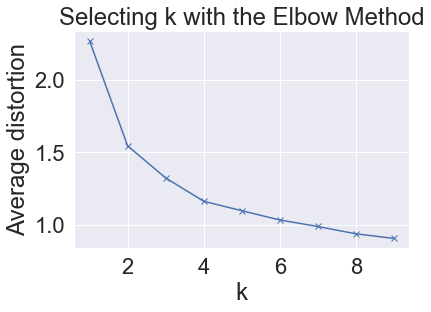

In [45]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(df_scaled)
    prediction=model.predict(df_scaled)
    meanDistortions.append(sum(np.min(cdist(df_scaled, model.cluster_centers_, 'euclidean'), axis=1)) / df_scaled.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


The bend is coming out clearly at k=2 and k=4, so number of clsuters are either 2 or 4.

In [97]:
# Set the value at  K = 4
final_model=KMeans(n_clusters=4, n_init = 15, random_state= 10)
final_model.fit(df_scaled)
prediction=final_model.predict(df_scaled)

#Append the prediction 
df["GROUP"] = prediction
df_scaled["GROUP"] = prediction
print("Groups Assigned : \n")
df.head()
df_scaled.head()

Groups Assigned : 



,cyl,disp,hp,wt,acc,yr,GROUP
0,1.498191,1.090604,0.669196,0.630870,-1.295498,-1.627426,0
1,1.498191,1.503514,1.586599,0.854333,-1.477038,-1.627426,0
2,1.498191,1.196232,1.193426,0.550470,-1.658577,-1.627426,0
3,1.498191,1.061796,1.193426,0.546923,-1.295498,-1.627426,0
4,1.498191,1.042591,0.931311,0.565841,-1.840117,-1.627426,0


In [98]:
df_cluster = df.groupby(['GROUP'])
df_cluster.mean()

,mpg,cyl,disp,hp,wt,acc,yr
GROUP,,,,,,,
0,14.429787,8.000000,350.042553,162.393617,4157.978723,12.576596,73.468085
1,19.946591,6.193182,227.761364,103.368970,3280.375000,16.395455,76.465909
2,31.750820,4.016393,112.196721,78.195718,2347.040984,16.533607,79.877049
3,25.250000,4.085106,110.090426,81.675206,2301.776596,16.531915,73.106383


Now K =4 clearly able to seperate data into 4 clusters and able to differentiate them clearly.

Our purpose is to predict the clsuter with more fuel efficient vehicles based on given attributes.

From above group table able to identify the group 2 as best cluster with more fuel efficient.

Group 2 with Average 31.75 miles per gallon is the most fuel efficient cluster having average

- Weight of vehicle is less in comparsion.

- Having engine with 4 cylinder, horsepower, disp is least in comparison.

- Showing latest years in comparison, it seems with improved engineering the mpg would have been expected to improve with time.

In [100]:
labels = final_model.labels_

In [108]:
silhouette_score(df_scaled,labels,random_state= 10)

0.4130015565997111

In [109]:
# Set the value at  K = 2
final_2=KMeans(n_clusters=2, n_init = 15, random_state= 10)
final_2.fit(df_scaled)
prediction_2=final_2.predict(df_scaled)

#Append the prediction
df_k2=df.copy()
df_k2= df_k2.drop('GROUP', axis=1)
df_k2["GROUP2"]= prediction_2
#df_scaled["GROUP"] = prediction_2
print("Groups Assigned : \n")
df_k2.head()


Groups Assigned : 



,mpg,cyl,disp,hp,wt,acc,yr,GROUP2
0,18.0,8,307.0,130.0,3504,12.0,70,0
1,15.0,8,350.0,165.0,3693,11.5,70,0
2,18.0,8,318.0,150.0,3436,11.0,70,0
3,16.0,8,304.0,150.0,3433,12.0,70,0
4,17.0,8,302.0,140.0,3449,10.5,70,0


In [110]:
df_cluster_k2 = df_k2.groupby(['GROUP2'])
df_cluster_k2.mean()

,mpg,cyl,disp,hp,wt,acc,yr
GROUP2,,,,,,,
0,14.932692,7.961538,343.894231,158.557692,4103.87500,12.875962,73.865385
1,26.550340,4.568027,140.198980,85.336110,2569.47619,16.520408,76.768707


In [111]:
labels2 = final_2.labels_

In [112]:
from sklearn.metrics import silhouette_samples, silhouette_score

In [113]:
silhouette_score(df_scaled,labels2, random_state= 10)

0.5083421100348294

In [119]:
#calculating silhouette score for different centroids
kmeans_kwargs = {
   "init": "random",
   "n_init": 10,
   "max_iter": 300,
   "random_state": 10,
}


silhouette_coefficients = []

 # Notice you start at 2 clusters for silhouette coefficient
for k in range(2, 7):
    kmeans = KMeans(n_clusters=k, **kmeans_kwargs)
    kmeans.fit(df_scaled)
    score = silhouette_score(df_scaled,kmeans.labels_)
    silhouette_coefficients.append(score)
    

 

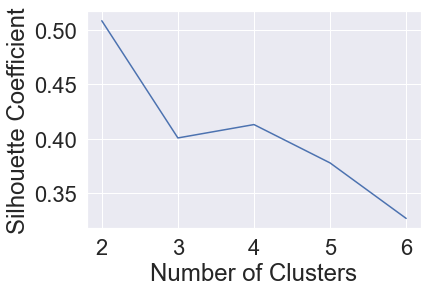

In [120]:
#plotting silhouette score for different centroids
plt.plot(range(2, 7), silhouette_coefficients)
plt.xticks(range(2, 7))
plt.xlabel("Number of Clusters")
plt.ylabel("Silhouette Coefficient")
plt.show()

Observation : 
    
    Here K=2 having more silhouette score, where a high value indicates that the object is well matched to its own cluster and poorly matched to neighboring clusters.

Now K =2 able to seperate data into 2 clusters.

Our purpose is to predict the cluster with more fuel efficient vehicles based on given attributes.

From above group table able to identify the group 2 as best cluster with more fuel efficient.

Group 2 with Average 26.3 miles per gallon is the most fuel efficient cluster having average

- Weight of vehicle is less in comparsion.

- Having engine with 4 cylinder, horsepower, disp is least in comparison.

- Showing latest years in comparison, it seems with improved engineering the mpg would have been expected to improve with time.


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue">Hierarchial Cluster

In [56]:
from scipy.cluster.hierarchy import dendrogram, linkage

Use ward as linkage metric and distance as Eucledian

In [57]:
#### generate the linkage matrix
from scipy.cluster.hierarchy import dendrogram, linkage
Z = linkage(df_scaled, 'ward', metric='euclidean')
Z.shape

(397, 4)

**Plot the dendrogram for the consolidated dataframe**

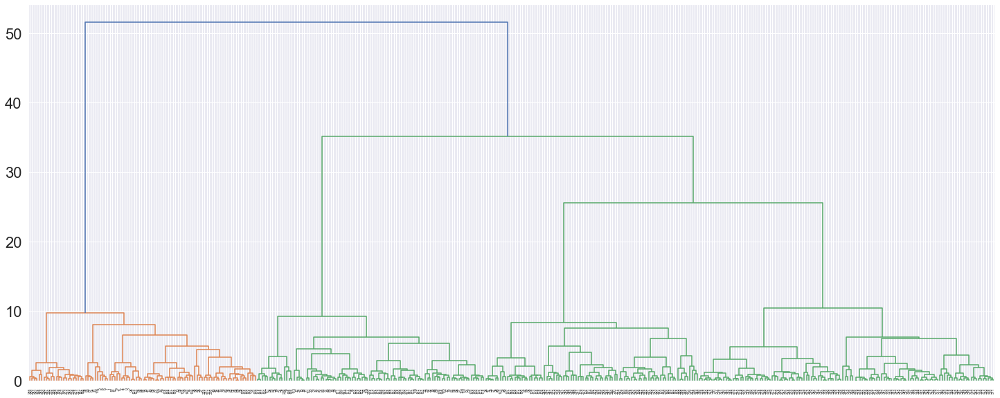

In [58]:
plt.figure(figsize=(25, 10))
dendrogram(Z)
plt.show()

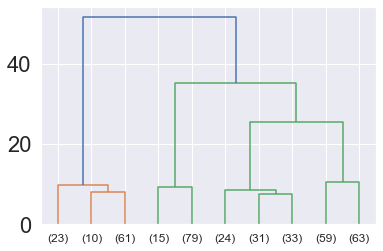

In [59]:
# Hint: Use truncate_mode='lastp' attribute in dendrogram function to arrive at dendrogram
dendrogram(
    Z,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=10,  # show only the last p merged clusters
)
plt.show()

In [121]:
max_d = 50  # Plays an important role to find number of clusters
from scipy.cluster.hierarchy import fcluster
clusters = fcluster(Z, max_d, criterion='distance')
clusters

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,

In [122]:
df_c2= df.drop('GROUP', axis=1)
df_c2['clusters'] = clusters
df_c2.head()

,mpg,cyl,disp,hp,wt,acc,yr,clusters
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


In [123]:
df_cluster = df_c2.groupby(['clusters'])
df_cluster.mean()

,mpg,cyl,disp,hp,wt,acc,yr
clusters,,,,,,,
1,14.429787,8.000000,350.042553,162.393617,4157.978723,12.576596,73.468085
2,26.323684,4.667763,144.998355,86.558606,2603.220395,16.493092,76.796053


In [124]:
from scipy.spatial.distance import pdist  #Pairwise distribution between data points
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
c, coph_dists = cophenet(Z , pdist(df_scaled))

c

0.7864480995900934

In [125]:
#### generate the average linkage matrix
from scipy.cluster.hierarchy import dendrogram, linkage
Za = linkage(df_scaled, 'average', metric='euclidean')
Za.shape

(397, 4)

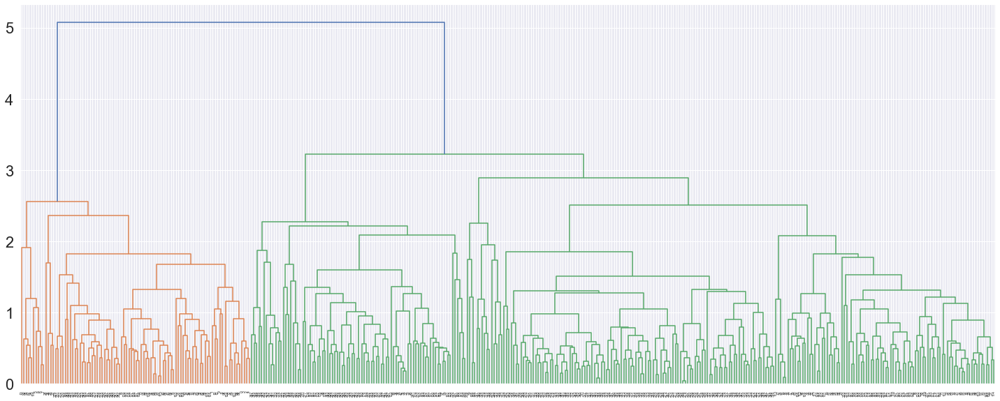

In [126]:
plt.figure(figsize=(25, 10))
dendrogram(Za)
plt.show()

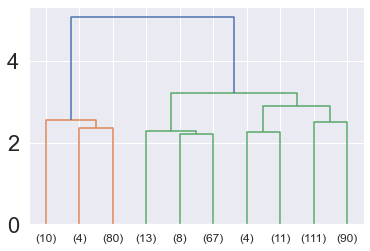

In [127]:
# Hint: Use truncate_mode='lastp' attribute in dendrogram function to arrive at dendrogram
dendrogram(
    Za,
    truncate_mode='lastp',  # show only the last p merged clusters
    p=10,  # show only the last p merged clusters
)
plt.show()

In [130]:
max_d = 4
from scipy.cluster.hierarchy import fcluster
clusters = fcluster(Za, max_d, criterion='distance')
clusters

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 1, 1,
       1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2,
       2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 1, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2,
       2, 1, 2, 1, 1, 2, 2, 2, 2, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 1, 2,
       1, 1, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 2, 2, 2, 2, 2,

In [131]:
df_c3= df_c2.drop('clusters', axis=1)
df_c3['clusters2'] = clusters
df_c3.head()

,mpg,cyl,disp,hp,wt,acc,yr,clusters2
0,18.0,8,307.0,130.0,3504,12.0,70,1
1,15.0,8,350.0,165.0,3693,11.5,70,1
2,18.0,8,318.0,150.0,3436,11.0,70,1
3,16.0,8,304.0,150.0,3433,12.0,70,1
4,17.0,8,302.0,140.0,3449,10.5,70,1


In [132]:
df_cluster = df_c3.groupby(['clusters2'])
df_cluster.mean()

,mpg,cyl,disp,hp,wt,acc,yr
clusters2,,,,,,,
1,14.429787,8.000000,350.042553,162.393617,4157.978723,12.576596,73.468085
2,26.323684,4.667763,144.998355,86.558606,2603.220395,16.493092,76.796053


In [133]:
from scipy.spatial.distance import pdist  #Pairwise distribution between data points
from scipy.cluster.hierarchy import cophenet, dendrogram, linkage
c, coph_dists = cophenet(Za , pdist(df_scaled))

c

0.8329908722707272

**We have used two linkage methods, 1) Ward 2) Average in that we are able to get best cophenetic score with 83.3% for Average linkage**

**After seeing both algorthms K-means and Hierarchical,** 

- Optimal number of clusters are 2 where we able to clearly differentiate 2 different vehicle categories based on fuel efficiency.

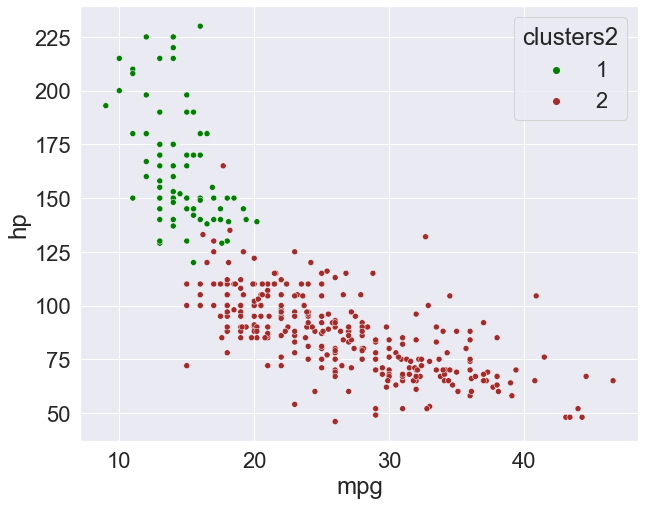

In [134]:
#plotting the clusters formed
plt.figure(figsize=(10, 8))
sns.scatterplot(x="mpg", y="hp", hue="clusters2",
              data=df_c3, 
                    palette=['green','brown']);


 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue">Difference between K Means and Hierarchical clustering

- Hierarchical clustering can’t handle big data well but K Means clustering can. This is because the time complexity of K Means is linear i.e. O(n) while that of hierarchical clustering is quadratic i.e. O(n2).

- K Means clustering requires prior knowledge of K (for that we need to run elbow or silhouette distance method) . But, you can stop at whatever number of clusters you find appropriate in hierarchical clustering by interpreting the dendrogram.

- K-Means uses median or mean to compute centroid for representing cluster while HCA has various linkage method that may or may not employ the centroid.

- Performance of K-Means on spherical data is better than that of HCA

- K-Means simply divides data into mutually exclusive subsets while HCA arranges it into a tree format.

<span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#00b3e5;"> 5) Answer below questions based on outcomes of using ML based methods

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue">How many optimal clusters are present in the data and what could be the possible reason behind it

**Optimal clusters using K Means**

There are two best methods to evalute number of clusters in K means are

1. Elbow Method : 

It is most popular and well-known method to find the optimal no. of clusters or the value of k in 
the process of clustering. This method is based of plotting the value of cost function against different 
values of k. As the number of clusters (k) increase lesser number of points fall within clusters or around 
the centroids. Hence the average distortion decreases with the increase of number of clusters. The point 
where the distortion declines most is said to be the elbow point and define the optimal number of clusters
for dataset

2. Silhouette method : 

Silhouette is a different method to determine optimal number of clusters for given dataset. It defines as 
a coefficient of measure of how similar an observation to its own cluster compared to that of other 
clusters. The range of silhouette coefficient varies between -1 to 1. 1 value indicate that an observation 
is far from its neighbouring cluster and close to its own whereas -1 denotes that an observation is close 
to neighbouring cluster than its own cluster.

We have used elbow method, able to identify best k =2 and 4 values.

"The point where the distortion declines most is said to be the elbow point and define the optimal number of clusters for dataset"

By checking at sihouette score,with k=2 we are able to get maximum score.

"Maximum value indicate that an observation is far from its neighbouring cluster and close to its own "

**So best optimal clusters are 2.**



**Optimal Clusters in Hierarchical Clusters**

**Cophenetic Coefficient :** It is an index  that shows the goodness of fit of the clustering similar to that off correlation coefficient  in regression.

To compute the cophenetic coefficient of hierarchical clustering,  we need 

Distance matrix (Euclidean distance) 
Cophenetic Matrix (distance between two clusters or two observations in a cluster (linkage method) 


**We have used two linkage methods, 1) Ward 2)Average, in that we are able to get best cophenetic score with 83.2% for Average linkage with 2 clusters**

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;comlor:darkblue">Linear regression model on different clusters separately and print the coefficients of the models individually

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:darkblue"> Test-Train Split

**Now seperate three clusters** 

In [135]:
df_k2.head()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP2
0,18.0,8,307.0,130.0,3504,12.0,70,0
1,15.0,8,350.0,165.0,3693,11.5,70,0
2,18.0,8,318.0,150.0,3436,11.0,70,0
3,16.0,8,304.0,150.0,3433,12.0,70,0
4,17.0,8,302.0,140.0,3449,10.5,70,0


In [137]:
df.head()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP
0,18.0,8,307.0,130.0,3504,12.0,70,0
1,15.0,8,350.0,165.0,3693,11.5,70,0
2,18.0,8,318.0,150.0,3436,11.0,70,0
3,16.0,8,304.0,150.0,3433,12.0,70,0
4,17.0,8,302.0,140.0,3449,10.5,70,0


**Adding K-Means cluster to original data**

In [138]:
df_LR = df.drop('GROUP', axis=1).apply(zscore)
df_LR['GROUP2'] = prediction_2
df_LR.head()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP2
0,-0.706439,1.498191,1.090604,0.669196,0.630870,-1.295498,-1.627426,0
1,-1.090751,1.498191,1.503514,1.586599,0.854333,-1.477038,-1.627426,0
2,-0.706439,1.498191,1.196232,1.193426,0.550470,-1.658577,-1.627426,0
3,-0.962647,1.498191,1.061796,1.193426,0.546923,-1.295498,-1.627426,0
4,-0.834543,1.498191,1.042591,0.931311,0.565841,-1.840117,-1.627426,0


In [140]:
 df_LR.groupby('GROUP2').mean()

,mpg,cyl,disp,hp,wt,acc,yr
GROUP2,,,,,,,
0,-1.099373,1.475552,1.444883,1.417737,1.340129,-0.977455,-0.580741
1,0.388894,-0.521964,-0.511115,-0.501512,-0.474059,0.345766,0.205432


In [142]:
# Let us break the data into largecar and smallcar segments

mpg1 = df_LR[df_LR['GROUP2']==1]
mpg0 = df_LR[df_LR['GROUP2']==0]

mpg1.head()

,mpg,cyl,disp,hp,wt,acc,yr,GROUP2
14,0.062185,-0.856321,-0.772295,-0.248207,-0.707544,-0.206262,-1.627426,1
15,-0.194023,0.320935,0.043923,-0.248207,-0.162483,-0.024722,-1.627426,1
16,-0.706439,0.320935,0.053526,-0.195784,-0.232242,-0.024722,-1.627426,1
17,-0.322127,0.320935,0.063128,-0.510322,-0.453340,0.156817,-1.627426,1
18,0.446497,-0.856321,-0.925936,-0.431688,-0.993671,-0.387801,-1.627426,1


In [147]:


X0=mpg0.drop(columns=['mpg', 'GROUP2'])
y0=mpg0['mpg'] #target

X1=mpg1.drop(columns=['mpg', 'GROUP2'])
y1=mpg1['mpg'] #target


**`Linear Regression for K=2 with cluster Zero which is small car Varient cluster**

In [174]:
from sklearn.linear_model import LinearRegression

model = LinearRegression()

# Split X and y into training and test set in 70:30 ratio

X0_train, X0_test, y0_train, y0_test = train_test_split(X0, y0, test_size=0.30, random_state=10)

mpg_LR0 = model.fit(X0_train, y0_train)

print('slope for zero cluster:', mpg_LR0.intercept_)


mpg0_score = mpg_LR0.score(X0_train, y0_train)
print('Score of of mpg0:', mpg0_score)

k_Large=mpg_LR0.score(X0_test, y0_test)
print('Predicted score for Large car is : ', k_Large)

slope for zero cluster: -0.49394419231781606
Score of of mpg0: 0.6297851623433366
Predicted score for Large car is :  0.5343561526020977


**`Linear Regression for K=2 with cluster one which is Large car Varient cluster**

In [206]:
X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.30, random_state=10)

mpg_LR1 = model.fit(X1_train, y1_train)

print('slope: for one cluster', mpg_LR1.intercept_)

mpg1_score = mpg_LR1.score(X1_train, y1_train)
print('Score of mpg1:', mpg1_score)

k_Small=mpg_LR1.score(X1_test, y1_test)
print('Predicted score for small car is : ', k_Small)


slope: for one cluster -0.2353757286748388
Score of mpg1: 0.7825807030420547
Predicted score for small car is :  0.7490909030032907


In [207]:
modellists = []
modellists.append(['Small Car Cluster', k_Small*100])
modellists.append(['Large Car Cluster', k_Large*100])
#modellists.append(['Linear Regression with Heirarchical clusters', H*100])
mdl_df = pd.DataFrame(modellists, columns = ['Model','Test Result_KMeans'])
mdl_df

,Model,Test Result_KMeans
0,Small Car Cluster,74.909090
1,Large Car Cluster,59.831045


**mpg1 is showing highest score with 77.2%**

**Cofficients of K-Means final model with K=2** 

Note : Cofficients for cluster 1 and 0 will be same

In [218]:
coeff_df = pd.DataFrame(mpg_LR0.coef_,X0.columns,columns=['Coefficient_Kmeans'])
coeff_df

,Coefficient_Kmeans
cyl,0.254724
disp,-0.319785
hp,-0.353241
wt,-0.728360
acc,0.009177
yr,0.400519


**Linear regression on Hierarchical Clustering**

In [187]:
df_LR_H = df.drop('GROUP', axis=1).apply(zscore)
df_LR_H['cluster'] = clusters
df_LR_H.head()

,mpg,cyl,disp,hp,wt,acc,yr,cluster
0,-0.706439,1.498191,1.090604,0.669196,0.630870,-1.295498,-1.627426,1
1,-1.090751,1.498191,1.503514,1.586599,0.854333,-1.477038,-1.627426,1
2,-0.706439,1.498191,1.196232,1.193426,0.550470,-1.658577,-1.627426,1
3,-0.962647,1.498191,1.061796,1.193426,0.546923,-1.295498,-1.627426,1
4,-0.834543,1.498191,1.042591,0.931311,0.565841,-1.840117,-1.627426,1


In [188]:
# Let us break the data into largecar and smallcar segments

mpg1_H = df_LR_H[df_LR_H['cluster']==1]
mpg2_H =  df_LR_H[df_LR_H['cluster']==2]

mpg2_H.head()

,mpg,cyl,disp,hp,wt,acc,yr,cluster
14,0.062185,-0.856321,-0.772295,-0.248207,-0.707544,-0.206262,-1.627426,2
15,-0.194023,0.320935,0.043923,-0.248207,-0.162483,-0.024722,-1.627426,2
16,-0.706439,0.320935,0.053526,-0.195784,-0.232242,-0.024722,-1.627426,2
17,-0.322127,0.320935,0.063128,-0.510322,-0.453340,0.156817,-1.627426,2
18,0.446497,-0.856321,-0.925936,-0.431688,-0.993671,-0.387801,-1.627426,2


In [189]:


XH1=mpg1_H.drop(columns=['mpg', 'cluster'])
yH1=mpg1_H['mpg'] #target

XH2=mpg2_H.drop(columns=['mpg', 'cluster'])
yH2=mpg2_H['mpg'] #target


Linear Regression on Hierarchical Clustering on Large Car (cluster 1)

In [214]:
from sklearn.linear_model import LinearRegression

model_H = LinearRegression()

# Split X and y into training and test set in 70:30 ratio

XH1_train, XH1_test, yH1_train, yH1_test = train_test_split(XH1, yH1, test_size=0.30, random_state=10)

mpg_LRH1 = model_H.fit(XH1_train, yH1_train)

print('slope for  Large car cluster:', model_H.intercept_)


mpg0_score = model_H.score(XH1_train, yH1_train)
print('Score of of mpg0:', mpg0_score)

H_Large=model_H.score(XH1_test, yH1_test)
print('Predicted score for Large car is : ', H_Large)

slope for  Large car cluster: -0.8374586574119325
Score of of mpg0: 0.5378815469427873
Predicted score for Large car is :  0.5983104468045997


Linear Regression on Hierarchical Clustering on Small Car (cluster 2)

In [215]:
from sklearn.linear_model import LinearRegression

#model = LinearRegression()

# Split X and y into training and test set in 70:30 ratio

XH2_train, XH2_test, yH2_train, yH2_test = train_test_split(XH2, yH2, test_size=0.30, random_state=10)

mpg_LRH1 = model_H.fit(XH2_train, yH2_train)

print('slope for  small car cluster:', model_H.intercept_)


mpg0_score = model_H.score(XH2_train, yH2_train)
print('Score of of mpg0:', mpg0_score)

H_Small=model_H.score(XH2_test, yH2_test)
print('Predicted score for small car is : ', H_Small)

slope for  small car cluster: -0.22346454574173685
Score of of mpg0: 0.7589584052903142
Predicted score for small car is :  0.8055662882143684


In [220]:
coeff_df_H = pd.DataFrame(model_H.coef_,X1.columns,columns=['Coefficient_Hierachical'])
coeff_df_H

,Coefficient_Hierachical
cyl,0.183900
disp,-0.192765
hp,-0.367172
wt,-0.735341
acc,0.027111
yr,0.404169


**Coefficient of model individually**

In [224]:
coeff_Model = pd.concat([coeff_df, coeff_df_H], axis=1)
coeff_Model

,Coefficient_Kmeans,Coefficient_Hierachical
cyl,0.254724,0.183900
disp,-0.319785,-0.192765
hp,-0.353241,-0.367172
wt,-0.728360,-0.735341
acc,0.009177,0.027111
yr,0.400519,0.404169


**Prediction score of each cluster using k-Means and Hierarchical**

In [216]:
modellists_H = []
modellists_H.append(H_Small*100)
modellists_H.append(H_Large*100)
#modellists.append(['Linear Regression with Heirarchical clusters', H*100])
mdl_df['Test Result_Hierarchical'] = modellists_H
mdl_df

,Model,Test Result_KMeans,Test Result_Hierarchical
0,Small Car Cluster,74.909090,80.556629
1,Large Car Cluster,59.831045,59.831045


Observation : 

- Prediction is high  on small cars using hierarchical clustering

- Prediction is same on large cars using both methods.

- HIerarchical giving best result than k-Means. 

**different models for different clusters will be helpful in this case and how it will be different than using one single model without 
clustering**

- Clustering helps us to group datapoints based on similarity (in ths case cars based on weight or fuel efficiency).

- Clustering than predict  help us to build cluster-specific prediction models. (if our target is most fuel efficint than we can pick small car varient). with this

- Model performance increases by removing unwanted data like large cars datapoints.

- Model run time will be reduced.

- Prediction score will be higher.
    

**Summary :**

    - Predicting fuel effiency is much fast and gives more accuracy when working on clusters.
    - Prediction score is high in Hierachical clustering model.
    - Hierachical is easy to implement than k-means because in k means we must have prior knowlede of number of clusters. 
    - Silhouette score is more for K=2 
    - Hierarchical clustering is more efficient with average linkage method.
    - Fuel efficiency is mmore with light vehicles and engine with 4 cylinders.
    

<span style="font-family: Arial; font-weight:bold;font-size:2.0em;color:#00b3e5;">Improvisation:

Our target is to predict the mpg (miles per gallon) : 
    We have information about cylinder, displacement and horsepower but no information related to fuel type (gas, petrol or diesel). Because fuel effiency will depend on fuel type. Help us to differentiate easily

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:DarkBlue">********* Part Two *******************

• **DOMAIN: Manufacturing** 

• CONTEXT: Company X curates and packages wine across various vineyards spread throughout the country.

• DATA DESCRIPTION: The data concerns the chemical composition of the wine and its respective quality.

Attribute Information: 
1. A, B, C, D: specific chemical composition measure of the wine
2. Quality: quality of wine [ Low and High ]

• PROJECT OBJECTIVE: Goal is to build a synthetic data generation model using the existing data provided by the company.

Steps and tasks:
1. Design a synthetic data generation model which can impute values [Attribute: Quality] wherever empty the company has missed recording the data

In [152]:
# Importing Libreries
import pandas as pd
import os
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import LabelEncoder
from scipy import stats
%matplotlib inline
sns.set_style('darkgrid')
%matplotlib inline
from sklearn.preprocessing import MinMaxScaler
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.cluster import KMeans
import warnings
warnings.filterwarnings("ignore")

In [153]:
os.chdir('D:\\AIML\\GL_Projects\\Unsupervised_Learning')

In [154]:
df = pd.read_excel('Part2_Company.xlsx')

In [155]:
df.sample(10)

,A,B,C,D,Quality
32,161,138,143,139,NaN
53,91,13,14,88,Quality A
27,193,169,199,155,NaN
54,70,96,70,103,Quality A
43,169,184,200,133,Quality B
22,3,63,109,67,Quality A
58,88,39,9,102,NaN
30,135,163,194,168,Quality B
15,196,145,166,132,Quality B
37,132,157,174,138,Quality B


In [156]:
df.shape

(61, 5)

In [157]:
df[df.duplicated(keep = 'first')] #No Duplicates in the data

,A,B,C,D,Quality


In [158]:
df['Quality'].value_counts()

Quality A    26
Quality B    17
Name: Quality, dtype: int64

In [159]:
df.isnull().sum()

A           0
B           0
C           0
D           0
Quality    18
dtype: int64

**There are 18 missing data in the dataset**

In [160]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 61 entries, 0 to 60
Data columns (total 5 columns):
 #   Column   Non-Null Count  Dtype 
---  ------   --------------  ----- 
 0   A        61 non-null     int64 
 1   B        61 non-null     int64 
 2   C        61 non-null     int64 
 3   D        61 non-null     int64 
 4   Quality  43 non-null     object
dtypes: int64(4), object(1)
memory usage: 2.5+ KB


In [161]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
A,61.0,118.557377,61.771494,3.0,61.0,136.0,171.0,200.0
B,61.0,116.639344,57.897908,5.0,63.0,138.0,168.0,200.0
C,61.0,114.081967,65.615368,3.0,59.0,135.0,174.0,200.0
D,61.0,114.459016,63.144431,3.0,51.0,132.0,174.0,199.0


**Scaling the model**

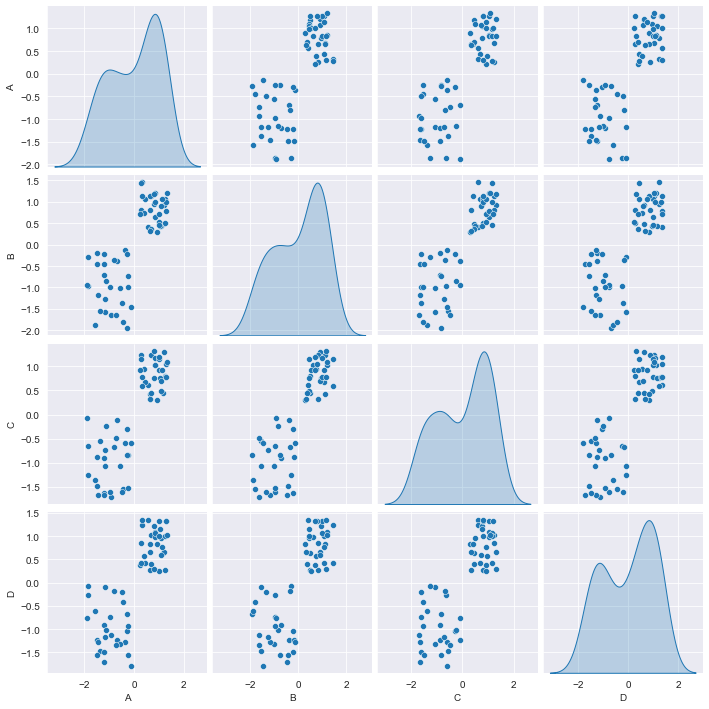

In [162]:
wineAttr=df.iloc[:,:-1]
wineScaled=wineAttr.apply(zscore)
sns.pairplot(wineScaled,diag_kind='kde')

**By looking at clusters, we can say k =2 visually**

Text(0.5, 1.0, 'Selecting k with the Elbow Method')

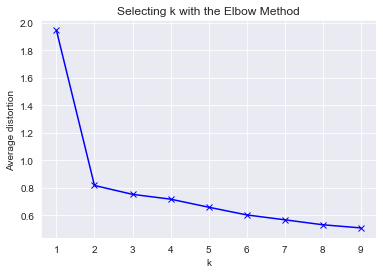

In [163]:
#Finding optimal no. of clusters
from scipy.spatial.distance import cdist
clusters=range(1,10)
meanDistortions=[]

for k in clusters:
    model=KMeans(n_clusters=k)
    model.fit(wineScaled)
    prediction=model.predict(wineScaled)
    meanDistortions.append(sum(np.min(cdist(wineScaled, model.cluster_centers_, 'euclidean'), axis=1)) / wineScaled.shape[0])


plt.plot(clusters, meanDistortions, 'bx-')
plt.xlabel('k')
plt.ylabel('Average distortion')
plt.title('Selecting k with the Elbow Method')


**Elbow method clearly says distortion declines at k=2**

In [167]:
# Set the value at  K = 2
final_model=KMeans(n_clusters=2, n_init = 15, random_state= 10)
final_model.fit(wineScaled)
prediction=final_model.predict(wineScaled)

#Append the prediction 
df["GROUP"] = prediction
wineScaled["GROUP"] = prediction
print("Groups Assigned : \n")
print(df.head())
wineScaled.head()

Groups Assigned : 

     A    B    C    D    Quality  GROUP
0   47   27   45  108  Quality A      1
1  174  133  134  166  Quality B      0
2  159  163  135  131        NaN      0
3   61   23    3   44  Quality A      1
4   59   60    9   68  Quality A      1


,A,B,C,D,GROUP
0,-1.168034,-1.561080,-1.061569,-0.103138,1
1,0.904992,0.284923,0.306077,0.823013,0
2,0.660147,0.807376,0.321443,0.264129,0
3,-0.939512,-1.630740,-1.706975,-1.125099,1
4,-0.972158,-0.986381,-1.614775,-0.741864,1


**Compare the clusters with the existing target**

<AxesSubplot:title={'center':'original data as per new group'}, xlabel='A', ylabel='B'>

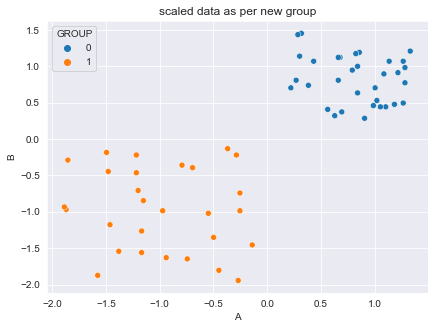

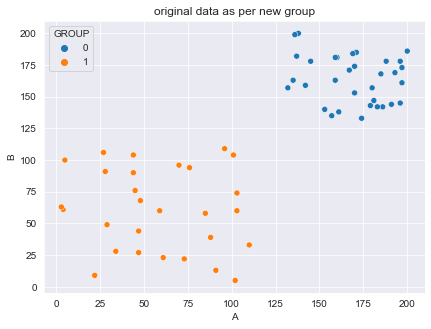

In [168]:
plt.figure(figsize=(15,5))
plt.subplot(1, 2, 1)
plt.title('scaled data as per new group')
sns.scatterplot(x="A", y="B", hue="GROUP", data=wineScaled)

plt.figure(figsize=(15,5))
plt.subplot(1, 2, 2)
plt.title('original data as per new group')
sns.scatterplot(x="A", y="B", hue="GROUP", data=df)

**Clustering Patterns of new group and old group looks same**


**Replace the newly predicted cluster with original missing targets**

In [177]:
df['Quality'] = df['Quality'].fillna(value = df['GROUP'].apply(lambda x:'Quality A' if x== 1 else 'Quality B'))

In [183]:
df.head(5)

,A,B,C,D,Quality,GROUP
0,47,27,45,108,Quality A,1
1,174,133,134,166,Quality B,0
2,159,163,135,131,Quality B,0
3,61,23,3,44,Quality A,1
4,59,60,9,68,Quality A,1


In [228]:
df.isnull().sum()

mpg      0
cyl      0
disp     0
hp       0
wt       0
acc      0
yr       0
GROUP    0
dtype: int64

**So finally no missing data, all missing data filled with newly predicted data**

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:DarkBlue">******@@@@@@@@ PART THREE @@@@@@@@@@********

**DOMAIN: Automobile**
    
• CONTEXT: The purpose is to classify a given silhouette as one of three types of vehicle, using a set of features extracted from the silhouette. 
The vehicle may be viewed from one of many different angles.

• DATA DESCRIPTION: The data contains features extracted from the silhouette of vehicles in different angles. Four "Corgie" model vehicles 
were used for the experiment: a double decker bus, Cheverolet van, Saab 9000 and an Opel Manta 400 cars. This particular combination of 
vehicles was chosen with the expectation that the bus, van and either one of the cars would be readily distinguishable, but it would be more 
difficult to distinguish between the cars.

• All the features are numeric i.e. geometric features extracted from the silhouette.

• PROJECT OBJECTIVE: Apply dimensionality reduction technique – PCA and train a model using principal components instead of training the 
model using just the raw data.

In [2]:
import numpy as np
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC      
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Data: Import, clean and pre-process the data

In [3]:
os.chdir('D:\\AIML\\GL_Projects\\Unsupervised_Learning')

In [4]:
df = pd.read_csv('Part3 - vehicle.csv')

In [5]:
df.head()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
0,95,48.0,83.0,178.0,72.0,10,162.0,42.0,20.0,159,176.0,379.0,184.0,70.0,6.0,16.0,187.0,197,van
1,91,41.0,84.0,141.0,57.0,9,149.0,45.0,19.0,143,170.0,330.0,158.0,72.0,9.0,14.0,189.0,199,van
2,104,50.0,106.0,209.0,66.0,10,207.0,32.0,23.0,158,223.0,635.0,220.0,73.0,14.0,9.0,188.0,196,car
3,93,41.0,82.0,159.0,63.0,9,144.0,46.0,19.0,143,160.0,309.0,127.0,63.0,6.0,10.0,199.0,207,van
4,85,44.0,70.0,205.0,103.0,52,149.0,45.0,19.0,144,241.0,325.0,188.0,127.0,9.0,11.0,180.0,183,bus


In [6]:
df.shape

(846, 19)

#### There are 846 rows and 19 columns in the data set.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 846 entries, 0 to 845
Data columns (total 19 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   compactness                  846 non-null    int64  
 1   circularity                  841 non-null    float64
 2   distance_circularity         842 non-null    float64
 3   radius_ratio                 840 non-null    float64
 4   pr.axis_aspect_ratio         844 non-null    float64
 5   max.length_aspect_ratio      846 non-null    int64  
 6   scatter_ratio                845 non-null    float64
 7   elongatedness                845 non-null    float64
 8   pr.axis_rectangularity       843 non-null    float64
 9   max.length_rectangularity    846 non-null    int64  
 10  scaled_variance              843 non-null    float64
 11  scaled_variance.1            844 non-null    float64
 12  scaled_radius_of_gyration    844 non-null    float64
 13  scaled_radius_of_gyr

**Class is only object out of 19 attributes**

In [8]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
compactness,846.0,93.678487,8.234474,73.0,87.00,93.0,100.0,119.0
circularity,841.0,44.828775,6.152172,33.0,40.00,44.0,49.0,59.0
distance_circularity,842.0,82.110451,15.778292,40.0,70.00,80.0,98.0,112.0
radius_ratio,840.0,168.888095,33.520198,104.0,141.00,167.0,195.0,333.0
pr.axis_aspect_ratio,844.0,61.678910,7.891463,47.0,57.00,61.0,65.0,138.0
max.length_aspect_ratio,846.0,8.567376,4.601217,2.0,7.00,8.0,10.0,55.0
scatter_ratio,845.0,168.901775,33.214848,112.0,147.00,157.0,198.0,265.0
elongatedness,845.0,40.933728,7.816186,26.0,33.00,43.0,46.0,61.0
pr.axis_rectangularity,843.0,20.582444,2.592933,17.0,19.00,20.0,23.0,29.0
max.length_rectangularity,846.0,147.998818,14.515652,118.0,137.00,146.0,159.0,188.0


**Observation :**

- By looking at the count, we can see the count is not same in each attribute. Looks some **missing values** in few attributes.

- Maximum Deviation in mean and mode observed in **scaled_variance.1**, also looks some outliers in the attribute.

In [9]:

# Checking for missing values

val=df.isnull().values.any()

if val==True:
    print("Missing values present : ", df.isnull().values.sum())
else:
    print("No missing values present")

Missing values present :  41


**There are 41 missing values in overall data. We will impute these null values with median instead of dropping them.**

In [10]:
# every column's missing value is replaced with that column's median respectively
# The fillna() function is used to fill NaN values using the specified method
df.fillna(df.mean(),inplace = True )

In [11]:
df.isnull().sum()

compactness                    0
circularity                    0
distance_circularity           0
radius_ratio                   0
pr.axis_aspect_ratio           0
max.length_aspect_ratio        0
scatter_ratio                  0
elongatedness                  0
pr.axis_rectangularity         0
max.length_rectangularity      0
scaled_variance                0
scaled_variance.1              0
scaled_radius_of_gyration      0
scaled_radius_of_gyration.1    0
skewness_about                 0
skewness_about.1               0
skewness_about.2               0
hollows_ratio                  0
class                          0
dtype: int64

We could observe that, there are no null/missing values now.

In [12]:
df.duplicated().sum()

0

There are no duplicates in the dataset.

In [13]:
# Distribution of target column
print(df['class'].value_counts())

car    429
bus    218
van    199
Name: class, dtype: int64


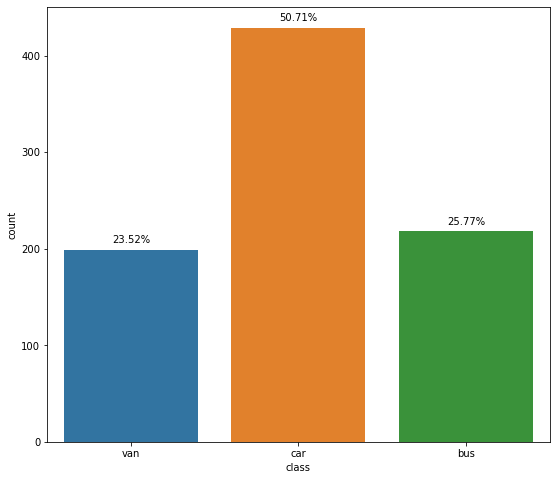

In [14]:
fig, ax = plt.subplots(figsize=(20,8))
width = len(df['class'].unique())+6
fig.set_size_inches(width , 8)
ax=sns.countplot(data = df, x= 'class') 



for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(df)*100,decimals=2)))+'%', (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


- Here, we can clearly observe that the cars count dominates the vans and buses.
- We could see 50% of the data belongs to cars.

In [15]:
#Replacing the 'class' (Dependent Variable) with numerical values
Dependent_Numeric= {'class' : {'car': 0, 'bus': 1, 'van': 2} }

df = df.replace(Dependent_Numeric)
df['class'].value_counts()

0    429
1    218
2    199
Name: class, dtype: int64

**Now we have converted class into numerical attribute**

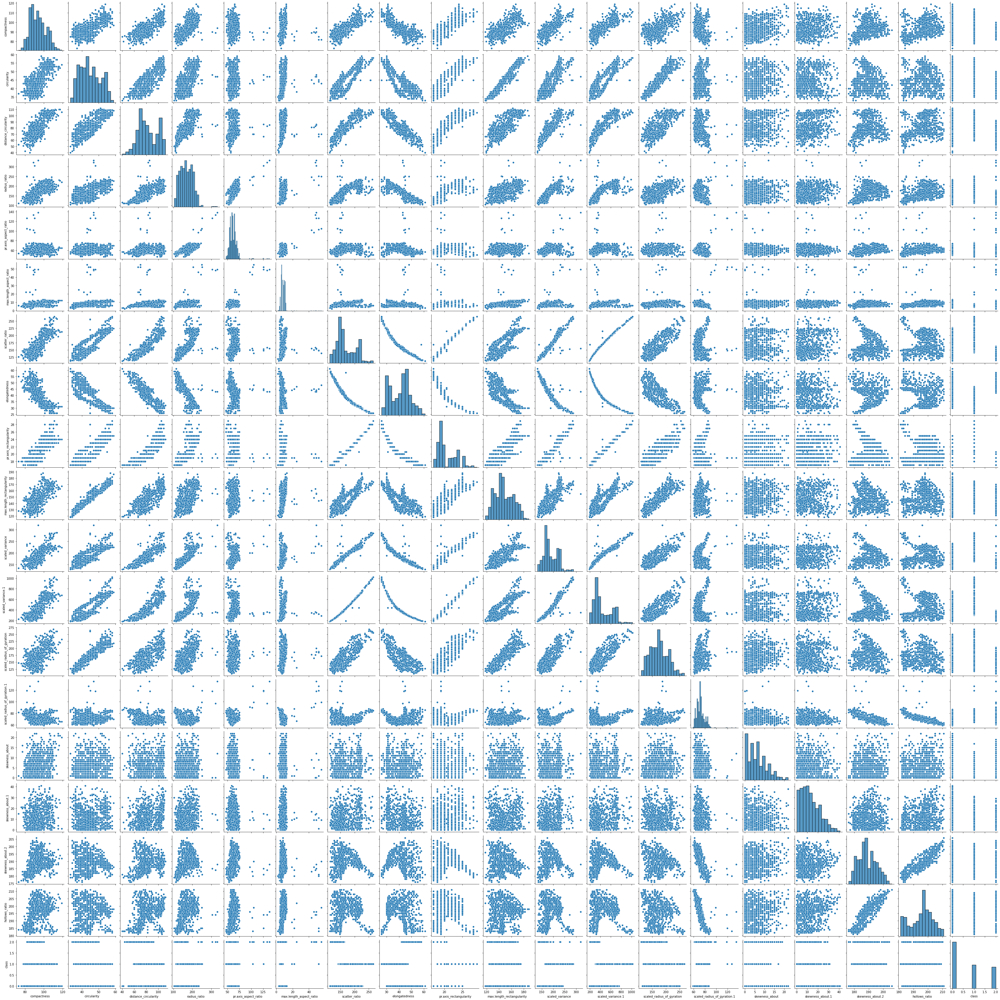

In [16]:
sns.pairplot(df.iloc[:,:])

From above pair plots we can see that many independent variables are correlated among themselves, this leads to multi-collinearity and many columns have long tails (from Diagonal plots) that indicates the presence of outliers.we will see down the line with the help of correlation matrix.
Since there are more attributes, it is not clear to visualize some of the attributes relation. So let's check it with heat map.

In [17]:
#Correlation between Attributes
df.corr()

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio,elongatedness,pr.axis_rectangularity,max.length_rectangularity,scaled_variance,scaled_variance.1,scaled_radius_of_gyration,scaled_radius_of_gyration.1,skewness_about,skewness_about.1,skewness_about.2,hollows_ratio,class
compactness,1.000000,0.685421,0.789909,0.689840,0.091704,0.148249,0.812235,-0.788643,0.813636,0.676143,0.762770,0.815901,0.585156,-0.250071,0.235687,0.157387,0.298526,0.365552,-0.297774
circularity,0.685421,1.000000,0.793016,0.620967,0.153362,0.251208,0.848207,-0.821901,0.844972,0.961943,0.796822,0.838525,0.926888,0.052642,0.144394,-0.011851,-0.105645,0.045318,-0.251225
distance_circularity,0.789909,0.793016,1.000000,0.767079,0.158397,0.264550,0.904400,-0.911435,0.893128,0.774669,0.861980,0.887328,0.705953,-0.225852,0.113813,0.265553,0.145563,0.332095,-0.428136
radius_ratio,0.689840,0.620967,0.767079,1.000000,0.663559,0.450036,0.734228,-0.789795,0.708285,0.569205,0.794041,0.720150,0.536536,-0.180819,0.048720,0.173832,0.382129,0.471262,-0.402130
pr.axis_aspect_ratio,0.091704,0.153362,0.158397,0.663559,1.000000,0.648704,0.103715,-0.183264,0.079395,0.127128,0.273414,0.089620,0.122111,0.152776,-0.058481,-0.032134,0.239849,0.267724,0.038629
max.length_aspect_ratio,0.148249,0.251208,0.264550,0.450036,0.648704,1.000000,0.165967,-0.180041,0.161592,0.305943,0.318955,0.143713,0.189704,0.295574,0.015439,0.043489,-0.026180,0.143919,0.036942
scatter_ratio,0.812235,0.848207,0.904400,0.734228,0.103715,0.165967,1.000000,-0.970723,0.989370,0.808356,0.948296,0.993784,0.799266,-0.027985,0.074308,0.213127,0.005167,0.118448,-0.463979
elongatedness,-0.788643,-0.821901,-0.911435,-0.789795,-0.183264,-0.180041,-0.970723,1.000000,-0.949077,-0.775519,-0.936715,-0.955074,-0.766029,0.103481,-0.051997,-0.185691,-0.114727,-0.216719,0.483326
pr.axis_rectangularity,0.813636,0.844972,0.893128,0.708285,0.079395,0.161592,0.989370,-0.949077,1.000000,0.811447,0.934568,0.989490,0.797068,-0.015676,0.082974,0.214734,-0.018990,0.099191,-0.444361
max.length_rectangularity,0.676143,0.961943,0.774669,0.569205,0.127128,0.305943,0.808356,-0.775519,0.811447,1.000000,0.745209,0.796018,0.866425,0.041220,0.135745,0.001658,-0.104254,0.076770,-0.140152


<AxesSubplot:>

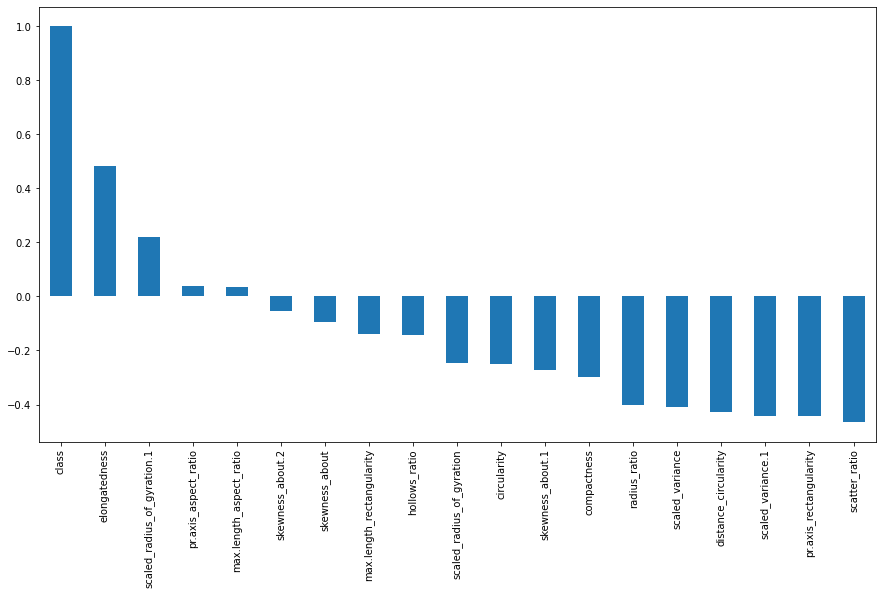

In [18]:
plt.figure(figsize=(15,8))
df.corr()['class'].sort_values(ascending = False).plot(kind='bar')

We can observe that only 4 attributes are positively correlated and rest 14 are negatively correlated with class.

In [19]:
# Checking Correlation Heatmap
plt.figure(dpi = 540,figsize= (30,25))
mask = np.triu(np.ones_like(df.corr()))
sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
sns.set(font_scale= 5)
plt.title('Correlation Heatmap')
plt.show()

#### Comment :
From above correlation matrix we can see that there are many features which are highly correlated. if we see carefully then Scatter ratio & Scaled_variance1 has almost perfect positive linear relationship and many other features also there which having more than 0.9(positive and negative) correlation and it is difficult to determine which dimensions to drop manually.

Our objective is to recognize whether an object is a van or bus or car based on some input features. so our main assumption is there is little or no multicollinearity between the features. All the features should be independent with one another, if two features is highly correlated then there is no use in using both features.

As we have seen in the distribution plots, we have outliers in some columns and we can remove those outliers or we will apply pca and let pca to be decided how it will explain above data which is in high dimension with smaller number of variables and luckily it removes multicollinearity as well.

We can drop the variables which are highly correlated with each other by setting threshold and also hypothesis test can be implemented on all these variables by checking p-value of those and variables can be removed which are having p-value more than 0.05

Since we are going to implement PCA technique, it will take care multicollinearity and gives us the the variables which are independent to each other.

In [20]:
df.columns

Index(['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio', 'class'],
      dtype='object')

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">EDA and visualisation:

 Variable is : compactness 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


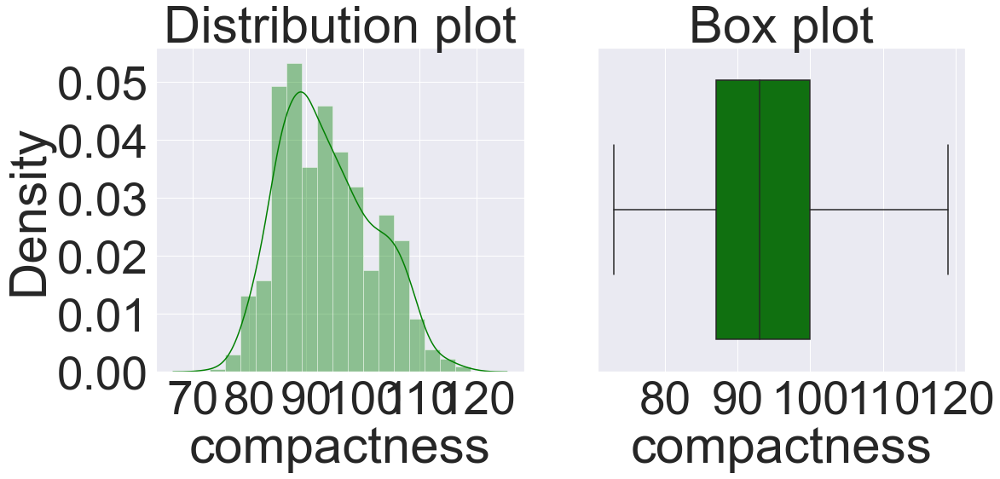

 Total Number of Outliers in compactness : 0

 Variable is : circularity 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


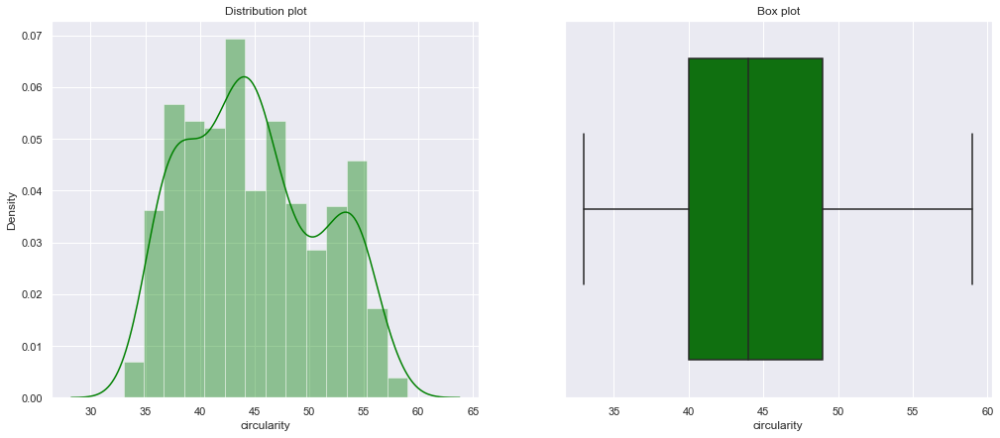

 Total Number of Outliers in circularity : 0

 Variable is : distance_circularity 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


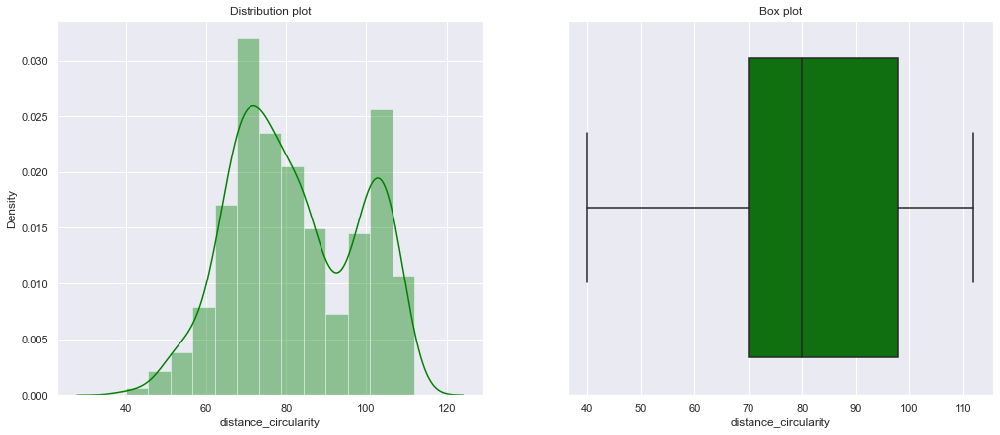

 Total Number of Outliers in distance_circularity : 0

 Variable is : radius_ratio 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


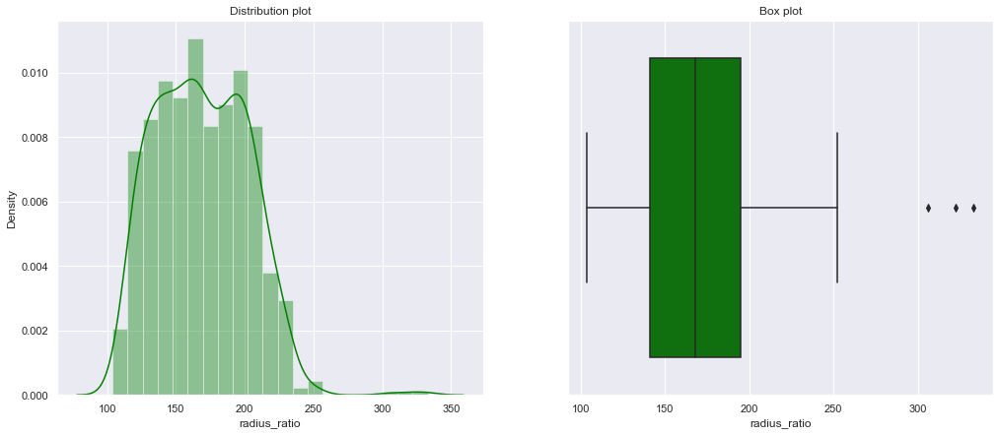

 Total Number of Outliers in radius_ratio : 3

 Variable is : pr.axis_aspect_ratio 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


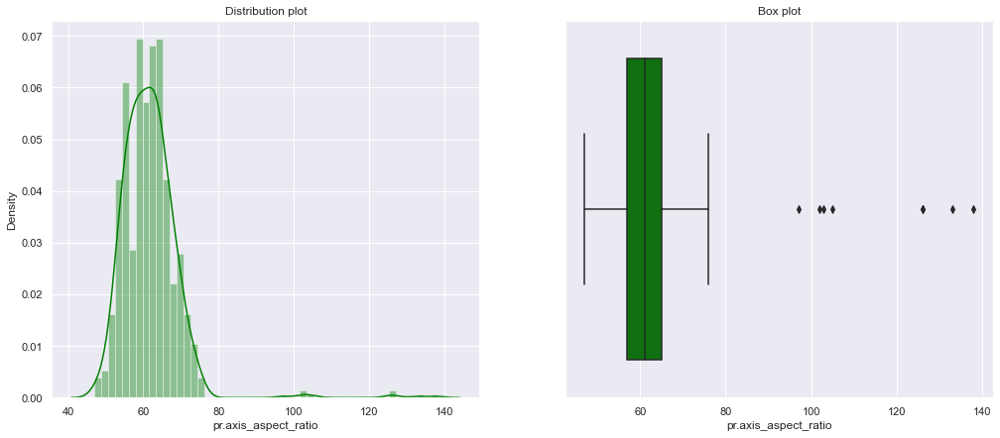

 Total Number of Outliers in pr.axis_aspect_ratio : 8

 Variable is : max.length_aspect_ratio 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


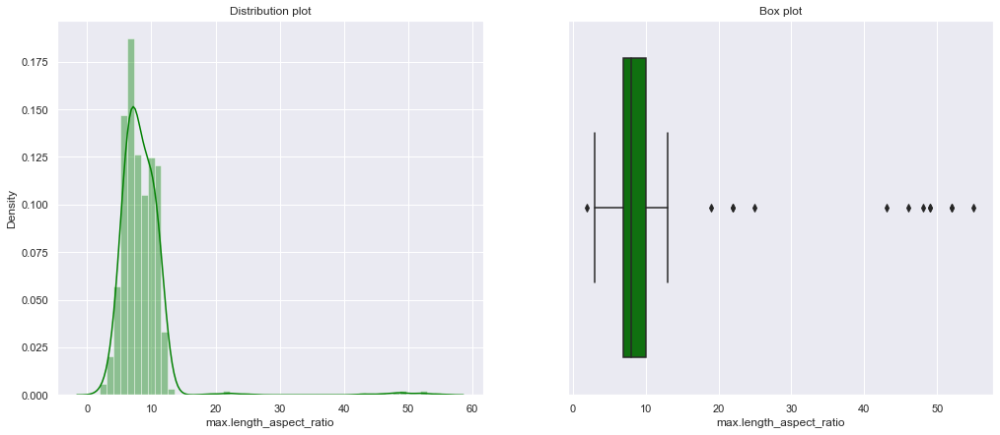

 Total Number of Outliers in max.length_aspect_ratio : 13

 Variable is : scatter_ratio 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


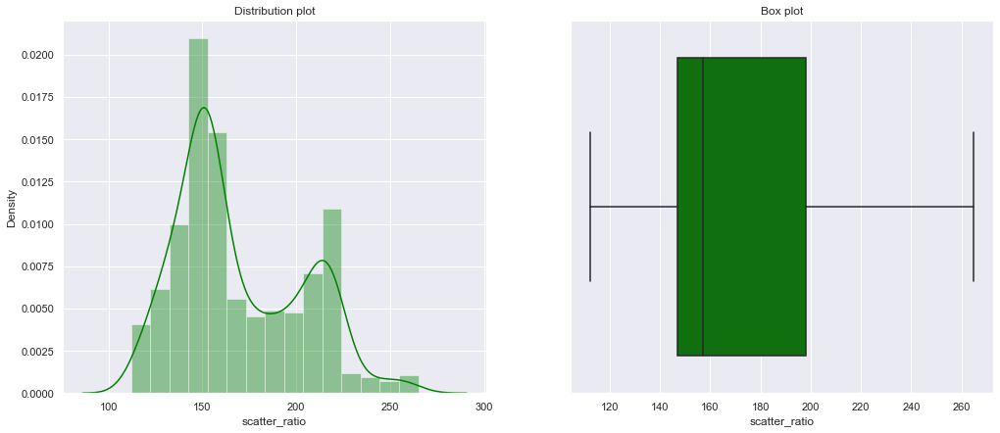

 Total Number of Outliers in scatter_ratio : 0

 Variable is : elongatedness 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


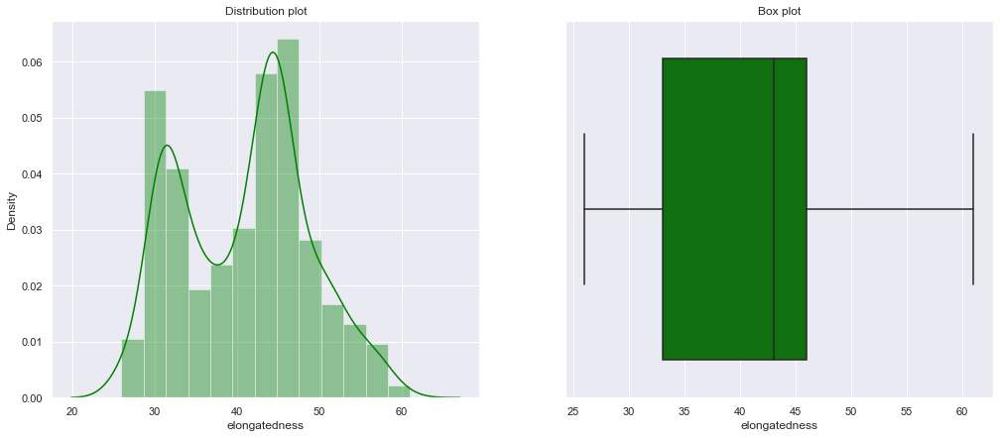

 Total Number of Outliers in elongatedness : 0

 Variable is : pr.axis_rectangularity 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


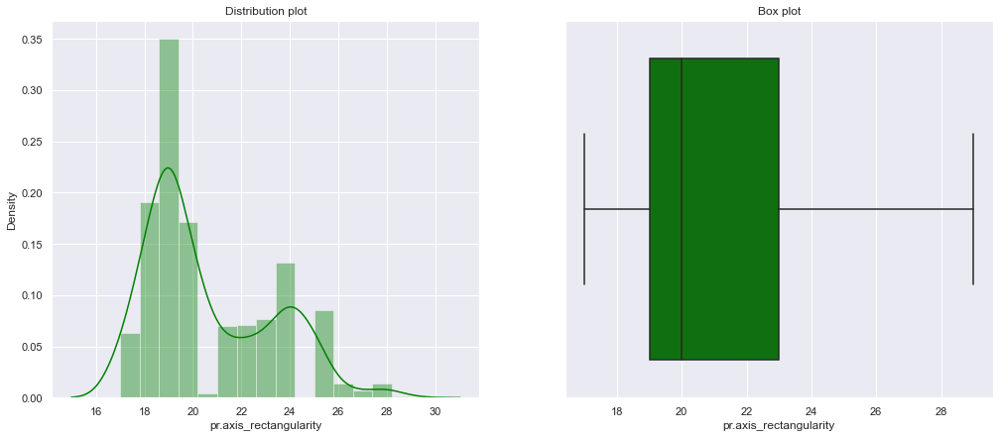

 Total Number of Outliers in pr.axis_rectangularity : 0

 Variable is : max.length_rectangularity 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


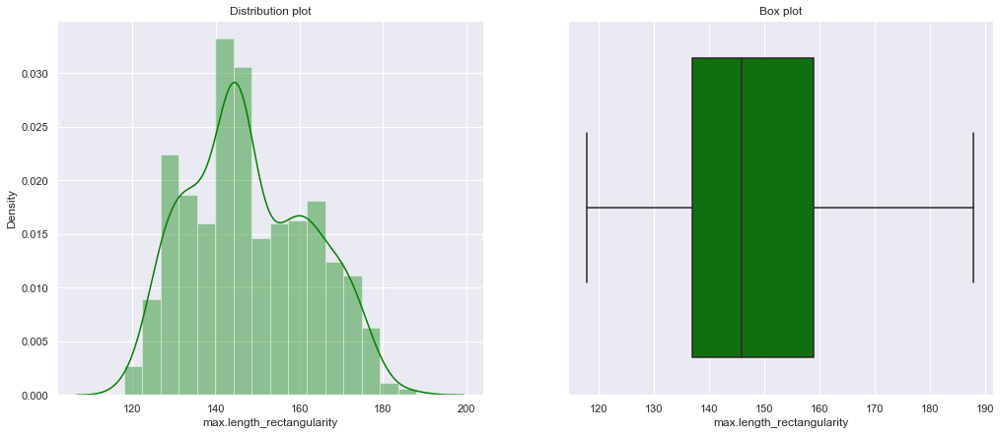

 Total Number of Outliers in max.length_rectangularity : 0

 Variable is : scaled_variance 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


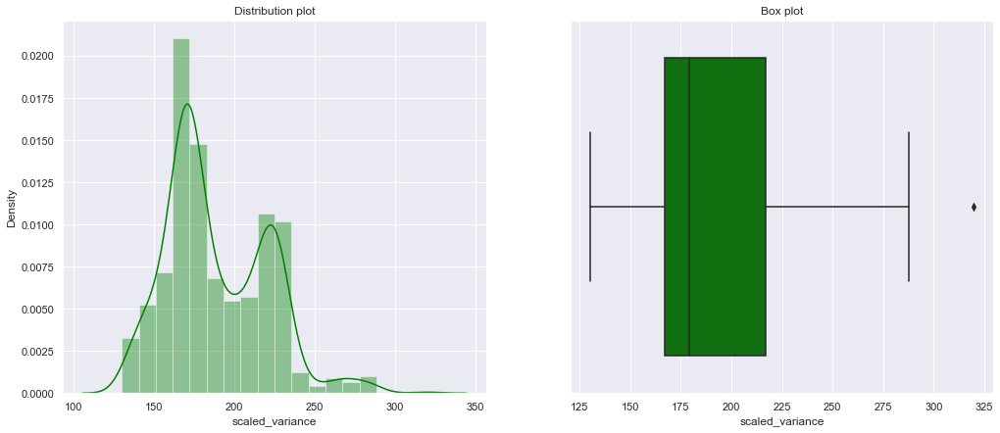

 Total Number of Outliers in scaled_variance : 1

 Variable is : scaled_variance.1 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


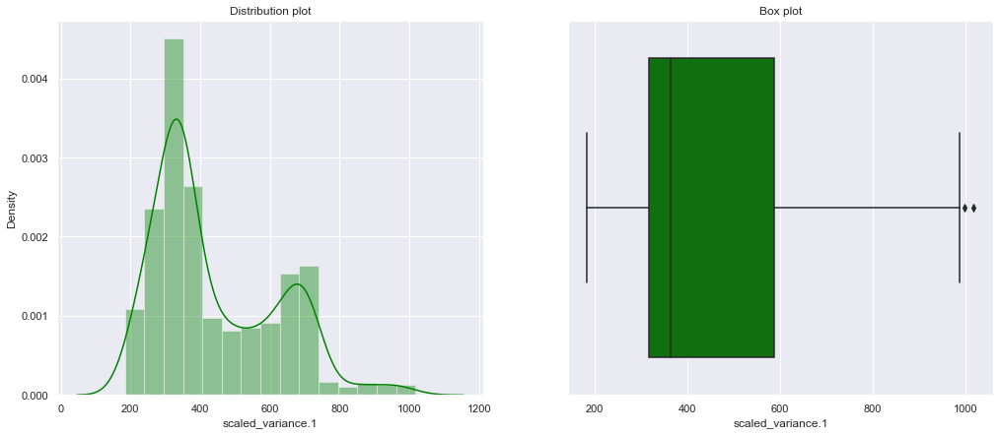

 Total Number of Outliers in scaled_variance.1 : 2

 Variable is : scaled_radius_of_gyration 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


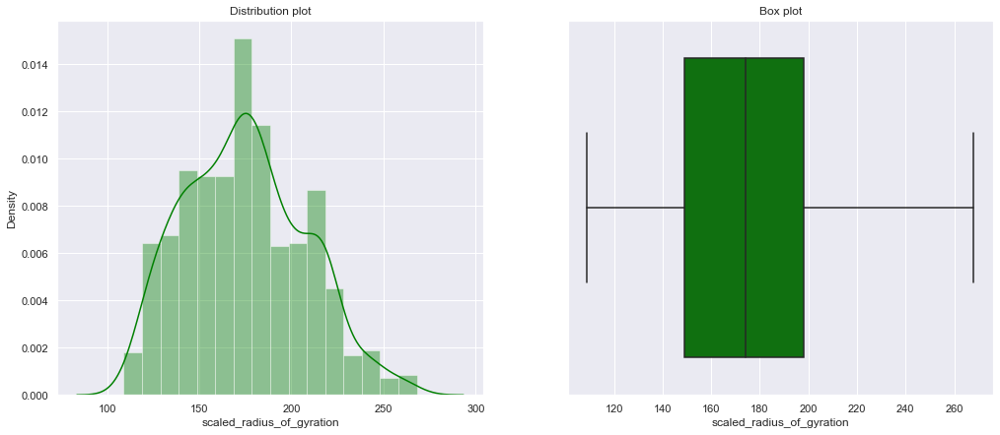

 Total Number of Outliers in scaled_radius_of_gyration : 0

 Variable is : scaled_radius_of_gyration.1 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


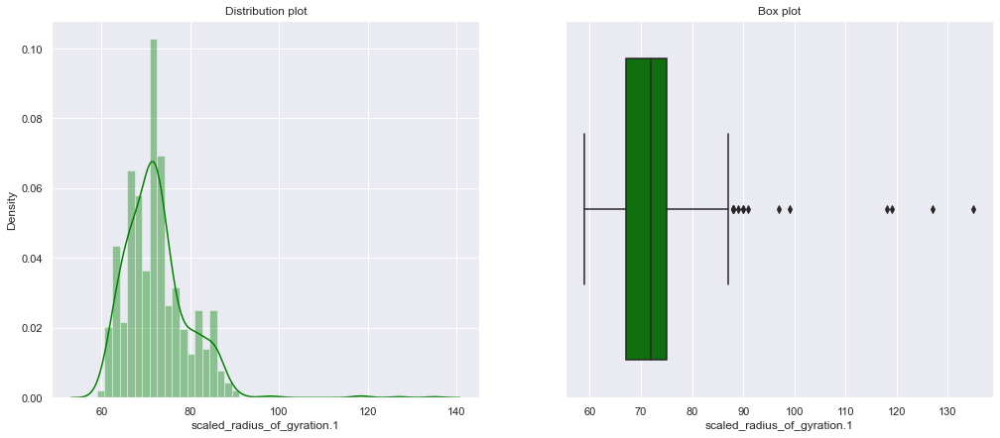

 Total Number of Outliers in scaled_radius_of_gyration.1 : 15

 Variable is : skewness_about 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


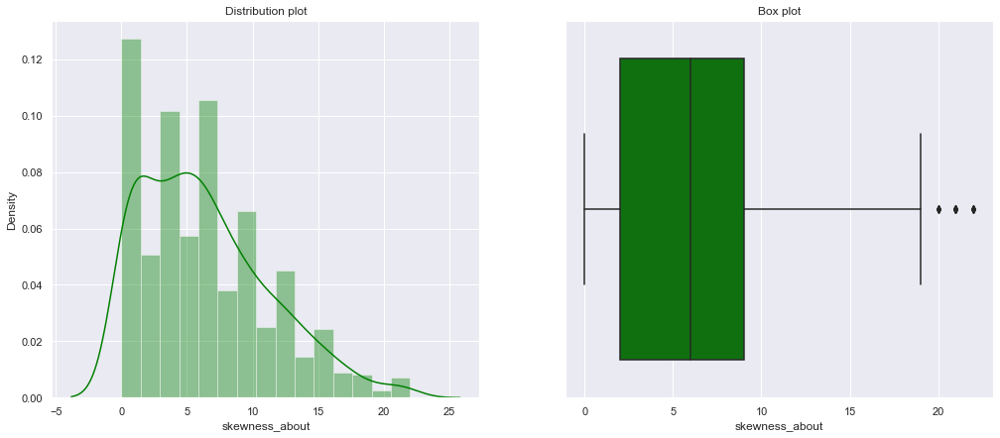

 Total Number of Outliers in skewness_about : 12

 Variable is : skewness_about.1 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


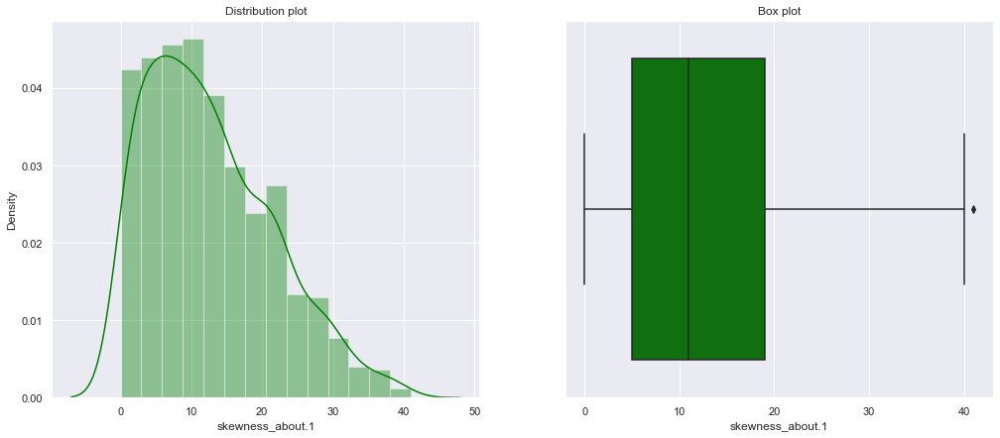

 Total Number of Outliers in skewness_about.1 : 1

 Variable is : skewness_about.2 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


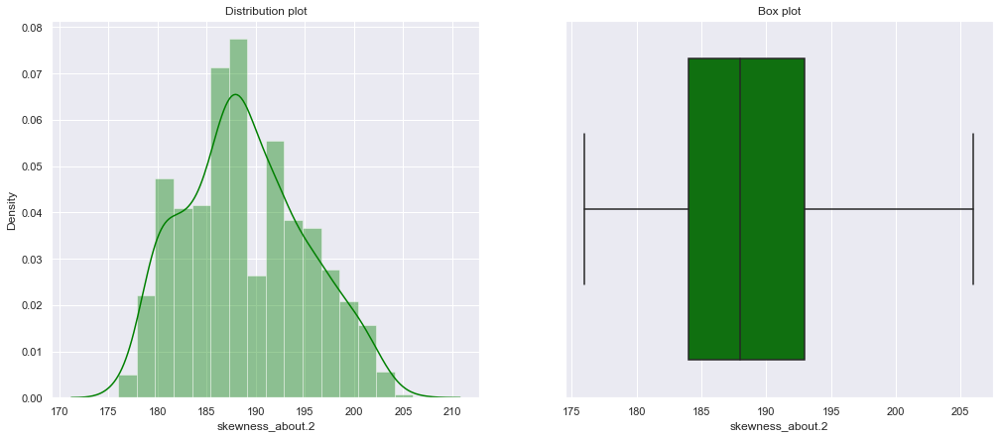

 Total Number of Outliers in skewness_about.2 : 0

 Variable is : hollows_ratio 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


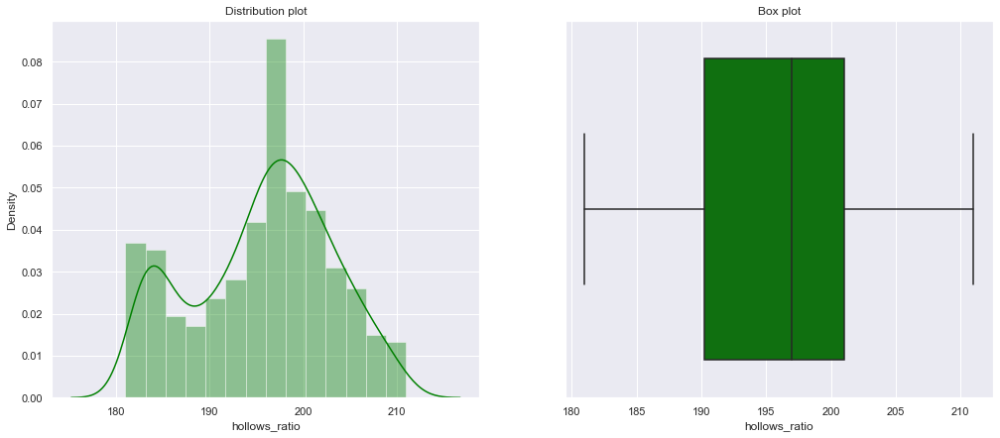

 Total Number of Outliers in hollows_ratio : 0



In [21]:
Attribute = ['compactness', 'circularity', 'distance_circularity', 'radius_ratio',
       'pr.axis_aspect_ratio', 'max.length_aspect_ratio', 'scatter_ratio',
       'elongatedness', 'pr.axis_rectangularity', 'max.length_rectangularity',
       'scaled_variance', 'scaled_variance.1', 'scaled_radius_of_gyration',
       'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1',
       'skewness_about.2', 'hollows_ratio']

for var in Attribute:
    print('{} Variable is : {} '.format('\033[92m',var))
    f, axes = plt.subplots(1, 2, figsize=(17,7))
    sns.boxplot(x = var, data=df,  orient='h' , ax=axes[1],color='Green').set_title('Box plot')
    sns.distplot(df[var],  ax=axes[0],color='Green').set_title('Distribution plot')
    sns.set(font_scale= 1)
    plt.show()
# Checking Number of outliers
    q1, q3= np.percentile(df[var],[25,75])
    IQR = q3-q1
    lower,upper = q1-1.5*IQR, q3+1.5*IQR
    outliers = ((df[var] < lower) | (df[var] > upper)).sum()
    print('{} Total Number of Outliers in {} : {}'.format('\033[92m',var, outliers))
    print('')
    

#### Summary of Exploratory Data Analysis

compactness - Approx normal distribution, no outliers

circularity - Slightly right skewed

distance_circularity - Left skewed

radius_ratio - Approx normal distribution, with 3 outliers

pr.axis_aspect_ratio - Approx normal distribution, with 8 outliers

max.length_aspect_ratio - 2 peak, 12 outliers

scatter_ratio - 2 peaks, right skewed

elongatedness - 2 peaks, left skewed

pr.axis_rectangularity - 2 peaks, right skewed
max.length_rectangularity - 3 peaks, no outliers

scaled_variance - 2 peaks, 1 outlier

scaled_variance.1 - 2 peaks, 2 outliers

scaled_radius_of_gyration - Slightly right skewed

scaled_radius_of_gyration.1 - 15 Outliers

skewness_about - right skewed, 12 outliers

skewness_about.1 - 1 outlier

skewness_about.2 - No outlier

hollows_ratio - 2 peaks, no outlier

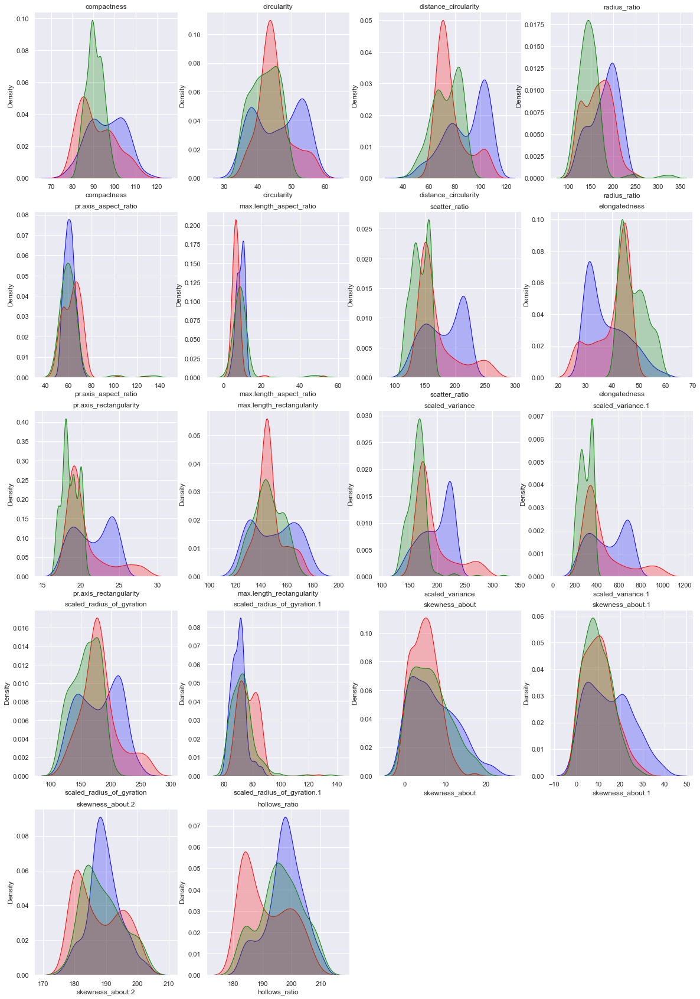

In [22]:
# kde plots to show the distribution of the all the variables with respect to dependent variable
k=1
plt.figure(figsize=(20,30))
for col in df.columns[0:18]:
    plt.subplot(5,4,k)
    sns.kdeplot(df[df['class']==0][col],color='blue',label='car',shade=True)
    sns.kdeplot(df[df['class']==1][col],color='red',label='bus',shade=True)
    sns.kdeplot(df[df['class']==2][col],color='green',label='van',shade=True)
    plt.title(col)
    k=k+1

#### Observations : 

Spread of compactness is least for van.

mean compactness is highest for car. 

For Bus compactness is right skewed indicating that less number of buses have high compactness.

Mean circularity is higher for cars

Mean distance_circularity is also higher for cars

pr.axis_aspect_ratio is has almost same distribution for car, van and buses

'scaled_radius_of_gyration', 'scaled_radius_of_gyration.1', 'skewness_about', 'skewness_about.1', 'skewness_about.2', have almost similar distribution for cars, buses and vans.


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Classifier: Design and train a best fit SVM classier using all the data attributes.

In [23]:
# independent variables
X = df.iloc[:,0:18]
# target variable
y = df['class']

In [24]:
# Scaling the data using zscore technique as the predictor values has different scale
from scipy.stats import zscore
XScaled=X.apply(zscore)

x_train,x_test,y_train,y_test = train_test_split(XScaled, y, test_size=0.2, random_state = 56)

print(x_train.shape)
print(y_train.shape)
print(x_test.shape)
print(y_test.shape)

(676, 18)
(676,)
(170, 18)
(170,)


In [25]:
# Support Vector Classifier
svm_model = SVC()

# fitting the model
svm_model.fit(x_train, y_train)

# score on training data
accuracy = svm_model.score(x_train,y_train)
print(accuracy*100)

97.92899408284023


In [26]:
# score on unseen data
accuracy = svm_model.score(x_test,y_test)
print(accuracy*100)

95.88235294117648


In [27]:
scores_df = pd.DataFrame({ 'Model' : 'SVM',  'Accuracy' : [accuracy*100] })
scores_df

,Model,Accuracy
0,SVM,95.882353


In [28]:
# prediction using test data
y_pred = svm_model.predict(x_test)

In [29]:
# generating classification report of actual and predicted values
print(metrics.classification_report(y_test,y_pred))

              precision    recall  f1-score   support

           0       0.98      0.96      0.97        93
           1       0.98      0.96      0.97        49
           2       0.87      0.96      0.92        28

    accuracy                           0.96       170
   macro avg       0.94      0.96      0.95       170
weighted avg       0.96      0.96      0.96       170



<AxesSubplot:>

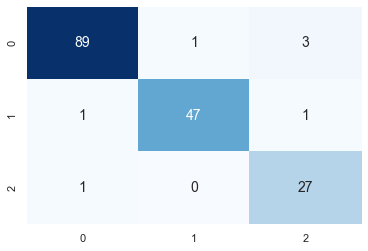

In [30]:
# confusion matrix of actual and predicted values
cm_svm = confusion_matrix(y_test, y_pred)
sns.heatmap(cm_svm, annot = True, cmap = "Blues", fmt = 'd', cbar = False, annot_kws = {"size": 14})

### Perform K-fold cross validation and get the cross validation score of the model (optional)

In [31]:
# number of splits (25)
num_folds = 25

# initialising kfold object
kfold = KFold(n_splits = num_folds, random_state = 56, shuffle=True)

# specifying the model to perform cross validation
model = SVC()

# noting accuracy scores of all the 25 split runs
scores = cross_val_score(model, XScaled, y, cv = kfold)

# printing all the 25 scores
print(scores)
print('')

# here we are getting average accuracy with standard deviation for range estimate
print('Overall Accuracy : {:.2f}% ({:.2f}%)'.format(scores.mean()*100.0, scores.std()*100.0))

[0.94117647 1.         0.97058824 0.94117647 0.94117647 0.97058824
 0.97058824 1.         0.97058824 1.         0.88235294 1.
 0.97058824 1.         0.94117647 1.         0.94117647 0.97058824
 0.91176471 0.94117647 0.97058824 0.96969697 0.96969697 0.93939394
 0.96969697]

Overall Accuracy : 96.34% (2.92%)


#### Here we are getting higher accuracy. By seeing average of all the 25 cross validation scores we can say that our model would perform betweeen 91% and 100% of accuracy with 95% of the confidence interval

In [32]:
scores_df1 = pd.DataFrame({'Model': ['SVM(cross_val)'], 'Accuracy' : [scores.mean()*100]})
scores_df = pd.concat([scores_df,scores_df1]).drop_duplicates()
scores_df

,Model,Accuracy
0,SVM,95.882353
0,SVM(cross_val),96.335116


<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Dimensional reduction: perform dimensional reduction on the data

#### Principal Component Analysis :
It is the most popular feature extraction technique.

It creates new variables using linear combinations of old variables and creates variables that are independent of one another.

It manages to tell us how important each of these new variables are and helps in choosing how many variables we can use to get desired accuracy.

Main idea of using PCA is to seek most accurate data representation in lower dimension space and it removes the noise and explore the hidden pattern within the data.

Step by step implementation of PCA is explained below.

#### Step-1: Normalize the data variables between (-1,1).
This is already done above, so we can directly used the scaled data.

#### Step 2: Covariance matrix : It is to describe the correlation between variables in the dataset.
It is the direction of linear relationship between variables.

In [33]:
covMatrix = np.cov(XScaled,rowvar=False)
pd.DataFrame(covMatrix)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,1.001183,0.686233,0.790844,0.690656,0.091813,0.148425,0.813196,-0.789576,0.814599,0.676943,0.763673,0.816867,0.585849,-0.250367,0.235966,0.157573,0.298880,0.365984
1,0.686233,1.001183,0.793954,0.621702,0.153543,0.251505,0.849211,-0.822873,0.845972,0.963081,0.797765,0.839517,0.927985,0.052704,0.144565,-0.011865,-0.105770,0.045372
2,0.790844,0.793954,1.001183,0.767987,0.158585,0.264863,0.905471,-0.912514,0.894185,0.775586,0.863000,0.888378,0.706788,-0.226119,0.113948,0.265868,0.145735,0.332488
3,0.690656,0.621702,0.767987,1.001183,0.664345,0.450569,0.735097,-0.790729,0.709123,0.569878,0.794981,0.721002,0.537170,-0.181033,0.048777,0.174038,0.382582,0.471820
4,0.091813,0.153543,0.158585,0.664345,1.001183,0.649472,0.103838,-0.183481,0.079489,0.127278,0.273738,0.089726,0.122255,0.152957,-0.058550,-0.032172,0.240133,0.268041
5,0.148425,0.251505,0.264863,0.450569,0.649472,1.001183,0.166163,-0.180254,0.161783,0.306305,0.319332,0.143883,0.189928,0.295924,0.015457,0.043540,-0.026211,0.144089
6,0.813196,0.849211,0.905471,0.735097,0.103838,0.166163,1.001183,-0.971872,0.990541,0.809312,0.949418,0.994960,0.800212,-0.028018,0.074396,0.213379,0.005173,0.118588
7,-0.789576,-0.822873,-0.912514,-0.790729,-0.183481,-0.180254,-0.971872,1.001183,-0.950200,-0.776437,-0.937823,-0.956204,-0.766935,0.103603,-0.052059,-0.185911,-0.114863,-0.216975
8,0.814599,0.845972,0.894185,0.709123,0.079489,0.161783,0.990541,-0.950200,1.001183,0.812407,0.935674,0.990661,0.798011,-0.015694,0.083072,0.214988,-0.019012,0.099309
9,0.676943,0.963081,0.775586,0.569878,0.127278,0.306305,0.809312,-0.776437,0.812407,1.001183,0.746091,0.796960,0.867450,0.041269,0.135906,0.001660,-0.104377,0.076860


#### Step 3: Eigen vectors : 
These are the principal components and the corresponding eigen values which are the magnitudes of variance captured.

The eigenvectors are nothing but the principal components of our above covariance matrix and represent the axis of new feature space whereas eigenvalues are the magnitude of those vectors.

In [34]:
pca = PCA()
pca.fit(XScaled)

PCA()

In [35]:
# Eignen values
pca.explained_variance_

array([9.40828822e+00, 3.01605477e+00, 1.90347881e+00, 1.18027268e+00,
       9.17174067e-01, 5.39279825e-01, 3.58566463e-01, 2.21661730e-01,
       1.60036194e-01, 9.17140864e-02, 6.65751851e-02, 4.59556829e-02,
       3.54023825e-02, 2.67096104e-02, 2.03690624e-02, 1.74414127e-02,
       9.23357029e-03, 3.08801865e-03])

In [36]:
# Eigen Vectors
pd.DataFrame(pca.components_)

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17
0,0.275259,0.293392,0.304556,0.267593,0.080494,0.097220,0.316872,-0.314042,0.313953,0.282790,0.309311,0.314149,0.272003,-0.020918,0.041332,0.058333,0.030156,0.074081
1,-0.127011,0.126217,-0.072686,-0.189635,-0.122159,0.010728,0.048047,0.012799,0.060035,0.116183,0.061754,0.053276,0.209280,0.488542,-0.054921,-0.124153,-0.540948,-0.540280
2,-0.119874,-0.025184,-0.056006,0.275066,0.642046,0.591800,-0.097653,0.057465,-0.109509,-0.016999,0.056466,-0.108711,-0.031369,0.286211,-0.115694,-0.075488,0.008689,0.039514
3,0.078311,0.187526,-0.070796,-0.042257,0.032858,0.031320,-0.095981,0.082738,-0.092271,0.187988,-0.120374,-0.091199,0.200102,-0.065653,0.605093,-0.665740,0.105618,0.047663
4,0.069306,-0.085019,0.040724,-0.046016,-0.040594,0.213612,-0.014997,0.076801,0.001500,-0.060545,-0.000465,-0.019440,-0.061617,0.145468,0.728920,0.599544,-0.100587,-0.029886
5,0.144650,-0.300733,-0.138488,0.248791,0.237891,-0.421019,0.116501,-0.142364,0.096656,-0.461743,0.235777,0.156332,-0.134796,0.241355,0.203564,-0.190919,0.156533,-0.241821
6,0.453756,-0.248093,0.072799,-0.176254,-0.397139,0.501943,0.065136,0.013830,0.096825,-0.106082,0.115202,0.083596,-0.374606,0.112980,-0.080046,-0.284844,0.018829,0.014475
7,-0.564714,-0.179295,0.436047,0.102843,-0.070004,0.161399,0.101509,-0.217059,0.063060,-0.250220,0.049436,0.041735,-0.110225,-0.339509,0.156326,-0.209376,-0.304038,-0.031066
8,-0.483554,-0.014540,-0.167574,-0.229284,-0.278147,0.148444,0.054026,-0.157329,0.007886,-0.063579,0.297664,0.080514,0.243567,0.320573,0.022129,0.009383,0.516504,0.172055
9,-0.261222,0.097543,-0.208495,-0.046764,0.106402,-0.117006,0.167989,-0.152974,0.195057,0.469168,-0.128603,0.154367,-0.685493,0.127135,0.098477,-0.035247,0.021143,0.063034


#### Step : 4 Principal components can be imputed by arranging eigen values with corresponding eigen vectors in descending order.

In [37]:
k = 1
total = []
for i in pca.explained_variance_ratio_*100:
    print('Variance explained by Principle Component',k,'is : {:.2f}%'.format(i))
    k+=1
    total.append(i)
print('\nTotal variance explained by all the principle components:',sum(total),'%')

Variance explained by Principle Component 1 is : 52.21%
Variance explained by Principle Component 2 is : 16.74%
Variance explained by Principle Component 3 is : 10.56%
Variance explained by Principle Component 4 is : 6.55%
Variance explained by Principle Component 5 is : 5.09%
Variance explained by Principle Component 6 is : 2.99%
Variance explained by Principle Component 7 is : 1.99%
Variance explained by Principle Component 8 is : 1.23%
Variance explained by Principle Component 9 is : 0.89%
Variance explained by Principle Component 10 is : 0.51%
Variance explained by Principle Component 11 is : 0.37%
Variance explained by Principle Component 12 is : 0.26%
Variance explained by Principle Component 13 is : 0.20%
Variance explained by Principle Component 14 is : 0.15%
Variance explained by Principle Component 15 is : 0.11%
Variance explained by Principle Component 16 is : 0.10%
Variance explained by Principle Component 17 is : 0.05%
Variance explained by Principle Component 18 is : 0.02

###### We observe that First principal component captures the maximum variance i.e. 52.19%, followed by 16.73% and 10.56% and so on.

Since we need to extract the Principal Components that capture about 95% of the variance in the data, we can use below plot.

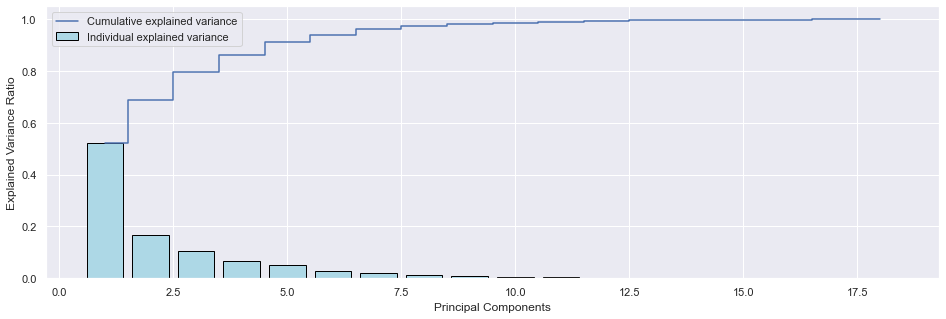

In [38]:
# Implementing scree plot 
plt.figure(figsize=(16 , 5))
plt.bar(range(1, 19), pca.explained_variance_ratio_, label = 'Individual explained variance',color='lightblue',edgecolor='black')
plt.step(range(1, 19), np.cumsum(pca.explained_variance_ratio_),where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.show()

Visually we can observe that there is a steep drop in variance explained with increase in number of PC's.
#### We will proceed with 7 components here as it explains 95% of the variance
With only 7 variables/PC's we can explain over 95% of the variation in the original data.

#### Step 5: Finally Original Data can be projected using principal components in reduced dimensions.

In [39]:
# Generating 7 PCA dimensions (dimensionality reduction from 18 to 7)
# n_components=7 implies 7 Principal components.
pca2 = PCA(n_components=7)
pca2.fit(XScaled)

PCA(n_components=7)

In [40]:
# Eigen Vectors (transformed into 7 dimensions)
pd.DataFrame(pca2.components_).T

,0,1,2,3,4,5,6
0,0.275259,-0.127011,-0.119874,0.078311,0.069306,0.144650,0.453756
1,0.293392,0.126217,-0.025184,0.187526,-0.085019,-0.300733,-0.248093
2,0.304556,-0.072686,-0.056006,-0.070796,0.040724,-0.138488,0.072799
3,0.267593,-0.189635,0.275066,-0.042257,-0.046016,0.248791,-0.176254
4,0.080494,-0.122159,0.642046,0.032858,-0.040594,0.237891,-0.397139
5,0.097220,0.010728,0.591800,0.031320,0.213612,-0.421019,0.501943
6,0.316872,0.048047,-0.097653,-0.095981,-0.014997,0.116501,0.065136
7,-0.314042,0.012799,0.057465,0.082738,0.076801,-0.142364,0.013830
8,0.313953,0.060035,-0.109509,-0.092271,0.001500,0.096656,0.096825
9,0.282790,0.116183,-0.016999,0.187988,-0.060545,-0.461743,-0.106082


##### We can observe only 7 columns now.

In [41]:
# Eigen Values
pca2.explained_variance_

array([9.40828822, 3.01605477, 1.90347881, 1.18027268, 0.91717407,
       0.53927982, 0.35856646])

In [42]:
# Percentage of variance explained by 7 Principal components
sum(pca2.explained_variance_ratio_*100)

96.12576858725443

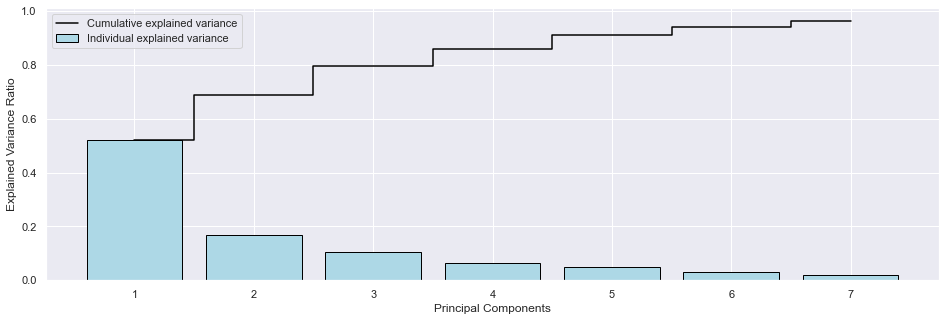

In [43]:
# Now Implementing scree plot on 7 variables
plt.figure(figsize=(16 , 5))  # size of the plot

# bar plot
plt.bar(range(1, 8), pca2.explained_variance_ratio_, label = 'Individual explained variance',color='lightblue',edgecolor='black')

# step plot on bars which is a cummulative sum of the variance explained by 7 principal components
plt.step(range(1, 8), np.cumsum(pca2.explained_variance_ratio_),where='mid', label = 'Cumulative explained variance',color = 'black')

plt.ylabel('Explained Variance Ratio')  # x axis label
plt.xlabel('Principal Components')      # y axis label
plt.legend()

In [44]:
#transforming the 18 dimension into 7 new dimension using Principal Component Analysis
pca_transformed =  pca2.transform(XScaled)

In [45]:
# shape of pca_transformed data
pca_transformed.shape

(846, 7)

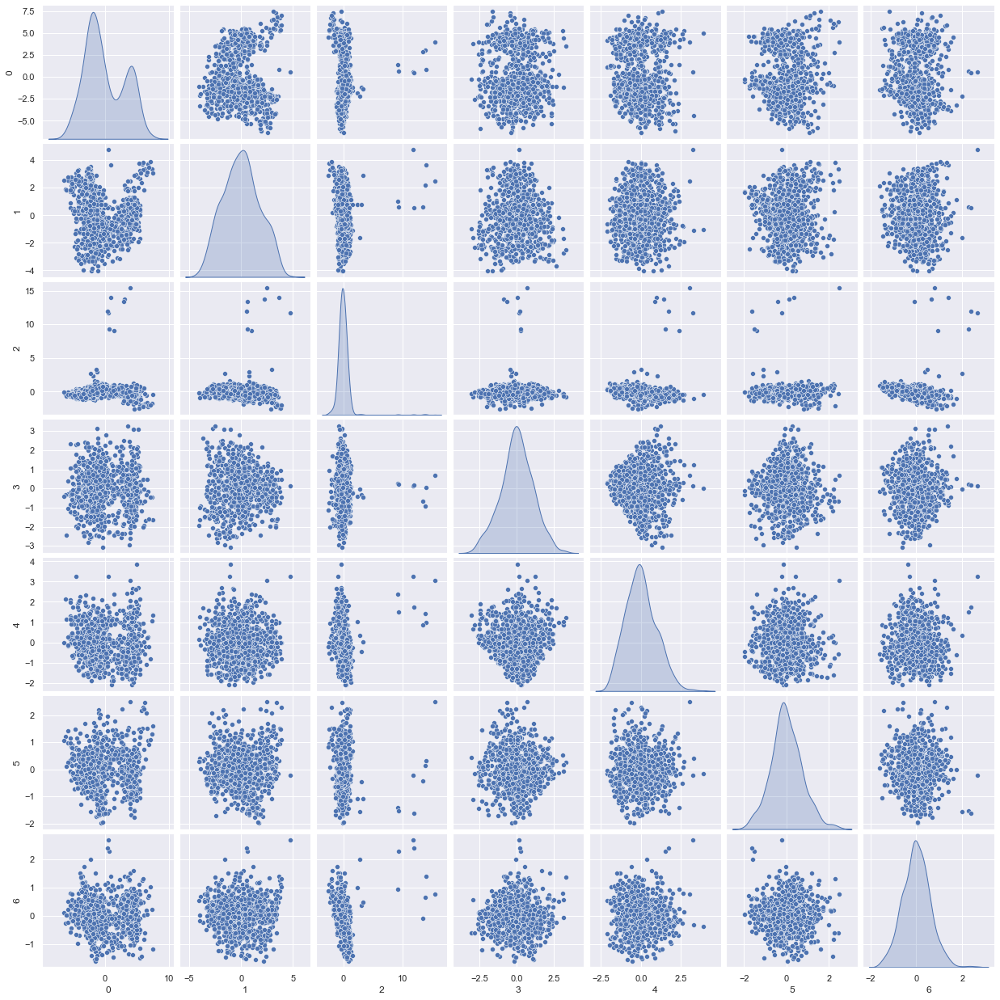

In [46]:
# Visualising the new data with pair plots since the new variable will be independent of each other.
sns.pairplot(pd.DataFrame(pca_transformed),diag_kind = 'kde')

 Pairplot clearly shows there is no Collinearity between the variables, hence correlation is close to zero. So we could able to decrease the correlation between independent variables.

#### 7. Repeat steps 3,4 and 5 but this time, use Principal Components instead of the original data. And the accuracy score should be on the same rows of test data that were used earlier. (hint: set the same random state)

In [47]:
# split the transformed pca data
pca_x_train, pca_x_test, pca_y_train, pca_y_test = train_test_split(pca_transformed, y, test_size = 0.2, random_state = 56)

In [48]:
# Shape of new train and test data
print(' Transformed data using  Principal Component Analysis ')
print('   shape of Transformed_x_train:',pca_x_train.shape)
print('   shape of Transformed_y_train:',pca_y_train.shape)
print('   shape of Transformed_x_test:',pca_x_test.shape)
print('   shape of Transformed_y_test:',pca_y_test.shape)

 Transformed data using  Principal Component Analysis 
   shape of Transformed_x_train: (676, 7)
   shape of Transformed_y_train: (676,)
   shape of Transformed_x_test: (170, 7)
   shape of Transformed_y_test: (170,)


Here, the dimensions are reduced to 7, this is called the dimensionality reduction technique. 
Now we will build the SVM model again and predict the score.

In [50]:
# creating a dataframe with the new dataset
# pca_transformed is the new dataset with 7 principle components
pca_transformed = pd.DataFrame(pca_transformed,columns = df.columns[0:7])
# displaying top 10 rows of each column
pca_transformed.head(10)

,compactness,circularity,distance_circularity,radius_ratio,pr.axis_aspect_ratio,max.length_aspect_ratio,scatter_ratio
0,0.332393,-0.218638,1.001286,0.177328,0.079106,-0.754814,-0.902187
1,-1.593741,-0.420549,-0.369264,0.233484,0.693397,-0.519073,0.376234
2,3.767535,0.195041,0.088237,1.203129,0.730907,0.705377,-0.032642
3,-1.740753,-2.829579,0.109176,0.377522,-0.363483,-0.487863,0.468613
4,0.555239,4.757557,11.703588,0.145068,3.257651,-0.211649,2.671191
5,5.827561,3.694679,-2.012536,-0.747187,-0.406009,1.524517,1.235106
6,-0.775683,-2.209718,-0.124179,2.114733,-0.193547,0.790859,-0.144332
7,-2.143168,-1.176278,0.655833,0.824809,-1.242992,-0.645040,-0.138822
8,-4.460389,-3.098218,0.100124,-0.550995,-0.568304,-0.282434,0.289319
9,0.950982,-1.839002,-0.060783,-0.643680,-0.407446,-0.333989,0.648422


This is our new transformed data using PCA including 7 columns and 846 data points

We will build the classification model again with this new data

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Classifier: Design and train a best fit SVM classier using dimensionally reduced attributes.

In [52]:
# Building the svm model using 7 principle components.
svm_pca = SVC()

# fitting the model on new data
svm_pca.fit(pca_x_train, pca_y_train)

SVC()

Accuracy score of SVM model with 7 principal components : 0.9294117647058824 


              precision    recall  f1-score   support

           0       0.97      0.91      0.94        93
           1       0.94      0.92      0.93        49
           2       0.82      1.00      0.90        28

    accuracy                           0.93       170
   macro avg       0.91      0.94      0.92       170
weighted avg       0.93      0.93      0.93       170



<AxesSubplot:>

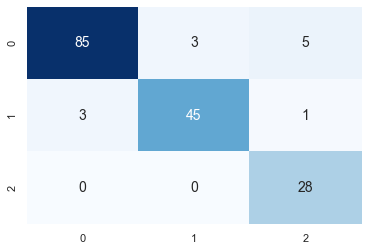

In [53]:
# score on test data
print('Accuracy score of SVM model with 7 principal components :',svm_pca.score(pca_x_test,pca_y_test),'\n\n')

# prediction using pca test data
svm_pca_pred = svm_pca.predict(pca_x_test)

# generating classification report of actual and predicted values
print(metrics.classification_report(pca_y_test, svm_pca_pred))

# confusion matrix of actual and predicted values
cm_svm_pca = confusion_matrix(pca_y_test, svm_pca_pred)
sns.heatmap(cm_svm_pca, annot = True, cmap = "Blues", fmt = 'd', cbar = False, annot_kws = {"size": 14})

#### Accuracy score of SVM model with 7 principal components :92.94%

We can see that getting better accuracy even with the 7 variables/principle components. it's close to the accuracy which we got with raw data

In [54]:
scores_df1 = pd.DataFrame({'Model': ['SVM with PCA'], 'Accuracy' : [svm_pca.score(pca_x_test,pca_y_test)*100]})
scores_df = pd.concat([scores_df,scores_df1]).drop_duplicates()
scores_df

,Model,Accuracy
0,SVM,95.882353
0,SVM(cross_val),96.335116
0,SVM with PCA,92.941176


In [56]:
# Cross validadtion with PCA.
# number of splits
num_folds = 25

# initialising kfold object
kfold = KFold(n_splits = num_folds, random_state = 56,shuffle=True)

# specifying the model to perform cross validation
model = SVC()

# noting accuracy scores of all the 25 split runs
scores = cross_val_score(model, pca_transformed, y, cv = kfold)

# printing all the 25 scores
print(scores)
print('')

# here we are getting average accuracy with standard deviation for range estimate
print('Overall Accuracy : {:.2f}% ({:.2f}%)'.format(scores.mean()*100.0, scores.std()*100.0))

[0.94117647 0.97058824 0.94117647 0.91176471 0.91176471 0.94117647
 0.91176471 0.94117647 0.91176471 0.94117647 0.85294118 0.85294118
 0.85294118 0.91176471 0.91176471 0.97058824 0.94117647 0.88235294
 0.88235294 0.94117647 0.91176471 1.         0.96969697 0.87878788
 0.93939394]

Overall Accuracy : 92.09% (3.79%)


 By seeing average of all the 25 cross validation scores we can say that our model would perform betweeen 85% and 100% of accuracy with 95% confidence interval.

### Summary :-

Studied the dataset and correlation among all the variables by Exploratory Data Analysis, univariate, bivariate and multivariate plots(visualization). 

From boxplots, presence of outliers were witnessed and to nullify the effect of outliers scaling has been done with the help of Z-score. 

To check the correlation between the feature columns pair plot, correlation matrix and correlation heat map also been drawn.

Those above three plots/matrix clearly indicated a strong correlation or the multicollinearity between many features.

To calculate classification results SVM model has been implemented and other technique which is part of feature enginering such as KFold cross validation.

Principal Component Analysis has been implemented where we have extracted features by reducing dimensions from 18 to 7.

By reducing the dimension of feature space, we have fewer relationships between variables to consider and are less likely to overfit our model and as an added benefit, each of the “new” variables after principal component Anlaysis are all independent of one another which was confirmed by pairplots after transforming the data with Principal component Analysis.

The classification results were computed for respective models created with metrics such as accuracy scores, confusion matrix.

#### 8. Compare the accuracy scores and cross validation scores of Support vector machines – one trained using raw data and the other using Principal Components, and mention your findings

In [57]:
scores_df1 = pd.DataFrame({'Model': ['SVM(cross_val) with PCA'], 'Accuracy' : [scores.mean()*100]})
scores_df = pd.concat([scores_df,scores_df1]).drop_duplicates()
scores_df

,Model,Accuracy
0,SVM,95.882353
0,SVM(cross_val),96.335116
0,SVM with PCA,92.941176
0,SVM(cross_val) with PCA,92.092692


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


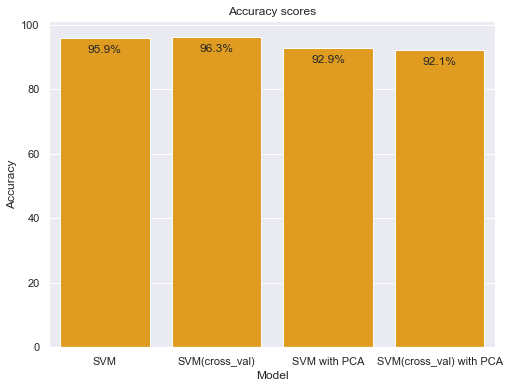

In [58]:
fig = plt.figure(figsize=(8,6))
plt.title('Accuracy scores')

ax = sns.barplot(scores_df['Model'],scores_df['Accuracy'],color='orange');

for p in ax.patches:
    ax.annotate('{:.1f}%'.format(p.get_height()), 
                    (p.get_x() + p.get_width() / 2, p.get_height()),
                    ha = 'center', va = 'center', 
                    xytext = (0, -12), 
                    textcoords = 'offset points') # used annotation to show the percentage of accuracy

### Comparison and Findings :

From the above accuracy scores, we can say,

Principal Component Analysis is very useful Method. Since we could able to achieve accuracy of above 90% with only 7 variables.

The accuracies of Support Vector Machine Classifier (SVM) with scaled data, using Cross Validation, using PCA and using PCA and cross validation shown above 90%.

Principal component Analysis shown approximately 93% with 7 variables, and we got 96% of the accuracy with raw data (18 variables).

Cross Validation performed well with the raw data but has 18 dimensions.Where as PCA could achieve 92.1% with 7 dimensions.

Disadvantage of Principal Component Analysis is that we cannot do interpretation with the model much because of new variables.

In feature extraction(PCA), we create 7 new independent variables, where each new independent variable is a linear combination of each of the 18 old independent variables. However, we create these new independent variables in a specific way and order these new variables by how well they predict our dependent variable.

We keep as many of the new independent variables as we want, but we drop the least important ones, here we reduced them to seven while still retaining the most valuable parts of all of the variables to achieve better accuracy.

By implementing PCA technique we overcome the issue of model complexity with more number of variables but less interpretability.

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:DarkBlue">********@@@@@@@ Part Four @@@@@@********

**DOMAIN: Sports management**

• CONTEXT: Company X is a sports management company for international cricket. 
• DATA DESCRIPTION: The data is collected belongs to batsman from IPL series conducted so far. Attribute Information: 
1. Runs: Runs score by the batsman
2. Ave: Average runs scored by the batsman per match
3. SR: strike rate of the batsman
4. Fours: number of boundary/four scored
5. Six: number of boundary/six scored
6. HF: number of half centuries scored so far

• **PROJECT OBJECTIVE:** Goal is to build a data driven batsman ranking model for the sports management company to make business decisions.

In [134]:
import numpy as np
import os
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import zscore
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC      
from sklearn.model_selection import KFold
from sklearn.model_selection import cross_val_score
from sklearn import metrics
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix,classification_report,accuracy_score
from matplotlib import pyplot

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;"> Data: Import, clean and pre-process the data

In [135]:
os.chdir('D:\\AIML\\GL_Projects\\Unsupervised_Learning')

In [136]:
df = pd.read_csv('Part4 - batting_bowling_ipl_bat.csv')

In [137]:
df.head()

,Name,Runs,Ave,SR,Fours,Sixes,HF
0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,CH Gayle,733.0,61.08,160.74,46.0,59.0,9.0
2,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,G Gambhir,590.0,36.87,143.55,64.0,17.0,6.0
4,NaN,NaN,NaN,NaN,NaN,NaN,NaN


**Above NaN rows due to empty cells in alternate rows.** 

In [138]:
df.dropna(inplace =True)

Removed all empty cells using dropna command

In [139]:
df.duplicated().sum()

0

In [140]:
df.reset_index(drop=True, inplace=True)

In [141]:
df.shape

(90, 7)

There are 90 players and 7 attributes in the data set

In [142]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 90 entries, 0 to 89
Data columns (total 7 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   Name    90 non-null     object 
 1   Runs    90 non-null     float64
 2   Ave     90 non-null     float64
 3   SR      90 non-null     float64
 4   Fours   90 non-null     float64
 5   Sixes   90 non-null     float64
 6   HF      90 non-null     float64
dtypes: float64(6), object(1)
memory usage: 5.0+ KB


Name is only object out of 7 attributes

In [143]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
Runs,90.0,219.933333,156.253669,2.00,98.000,196.500,330.7500,733.00
Ave,90.0,24.729889,13.619215,0.50,14.665,24.440,32.1950,81.33
SR,90.0,119.164111,23.656547,18.18,108.745,120.135,131.9975,164.10
Fours,90.0,19.788889,16.399845,0.00,6.250,16.000,28.0000,73.00
Sixes,90.0,7.577778,8.001373,0.00,3.000,6.000,10.0000,59.00
HF,90.0,1.188889,1.688656,0.00,0.000,0.500,2.0000,9.00


Mean and median almmost same except slight deviation observed in runs, sixes and half centuries

Looking at min, max of all attributes, we can say distribution is skewed.

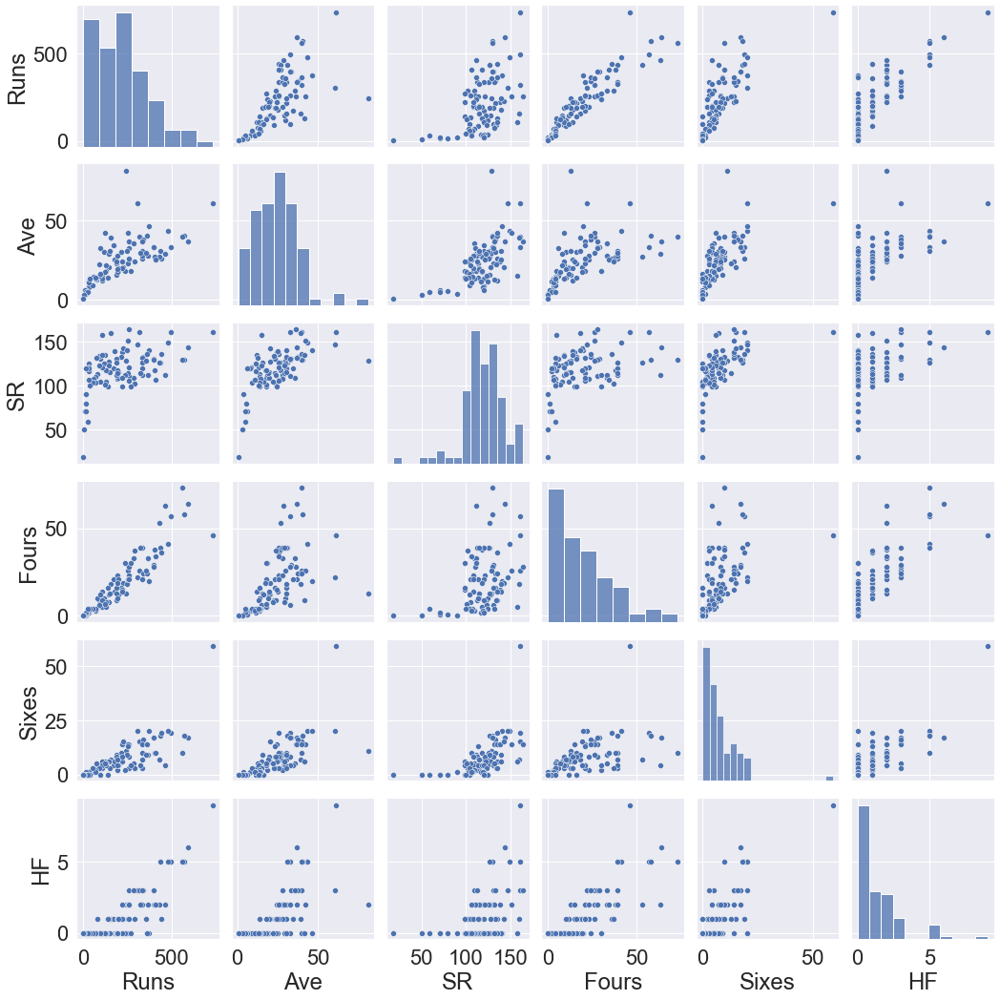

In [144]:
sns.pairplot(df)

Observation : 

Runs are highly correlated with fours, sixes, Half Centuries and average.

Those who hitted more fours and sixes have high chances of getting half centuries.

In [145]:
df.corr()

,Runs,Ave,SR,Fours,Sixes,HF
Runs,1.000000,0.692984,0.493489,0.918809,0.769778,0.835148
Ave,0.692984,1.000000,0.623606,0.546211,0.682414,0.620754
SR,0.493489,0.623606,1.000000,0.384810,0.583943,0.427584
Fours,0.918809,0.546211,0.384810,1.000000,0.522574,0.783689
Sixes,0.769778,0.682414,0.583943,0.522574,1.000000,0.767696
HF,0.835148,0.620754,0.427584,0.783689,0.767696,1.000000


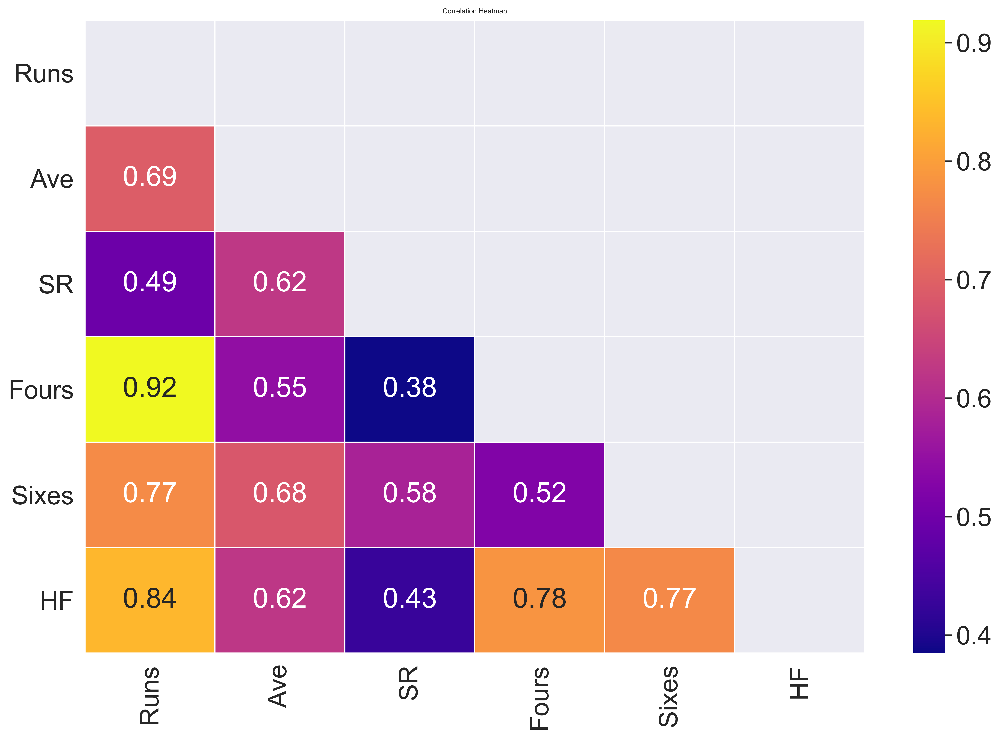

In [146]:
# Checking Correlation Heatmap
plt.figure(dpi = 540,figsize= (15,10))
mask = np.triu(np.ones_like(df.corr()))
sns.heatmap(df.corr(),mask = mask, fmt = ".2f",annot=True,lw=1,cmap = 'plasma')
plt.yticks(rotation = 0)
plt.xticks(rotation = 90)
sns.set(font_scale= 0.5)
plt.title('Correlation Heatmap')
plt.show()

 <span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">EDA and visualisation:

 Variable is : Runs 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


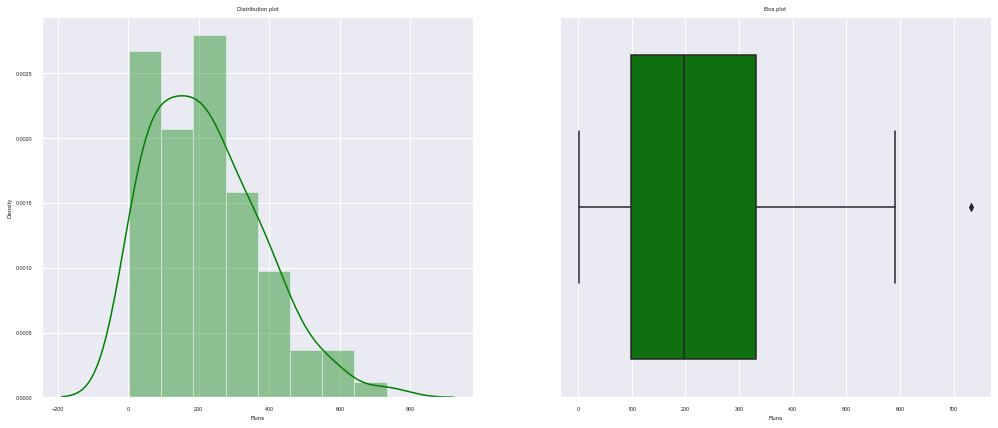

 Total Number of Outliers in Runs : 1

 Variable is : Ave 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


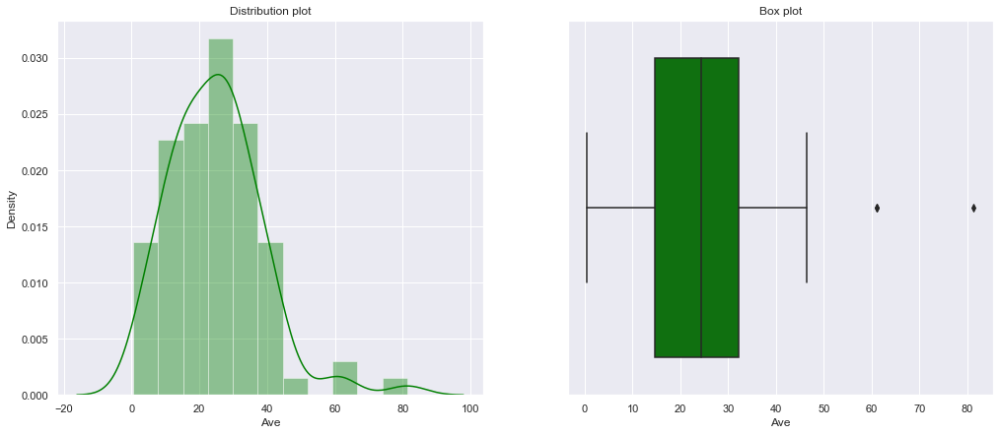

 Total Number of Outliers in Ave : 3

 Variable is : SR 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


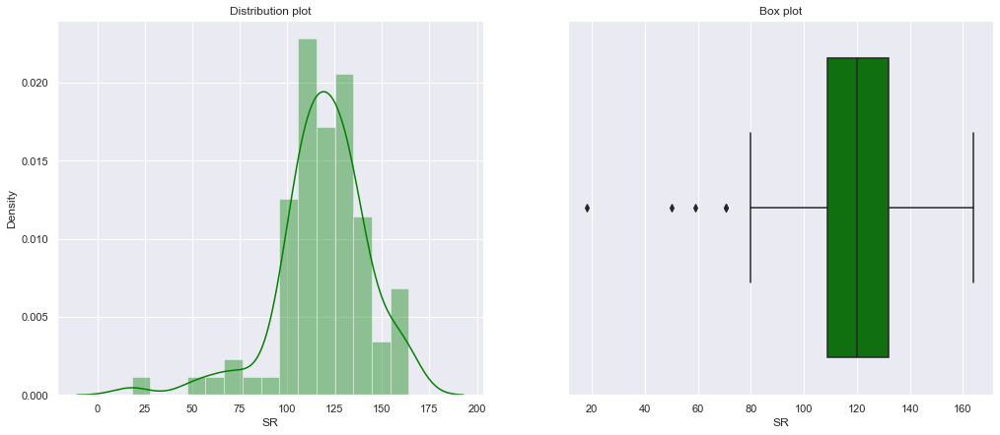

 Total Number of Outliers in SR : 5

 Variable is : Fours 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


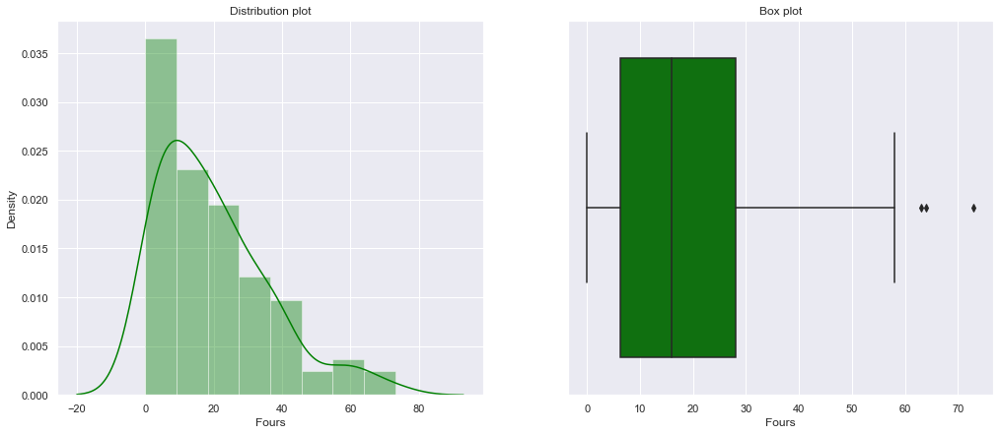

 Total Number of Outliers in Fours : 3

 Variable is : Sixes 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


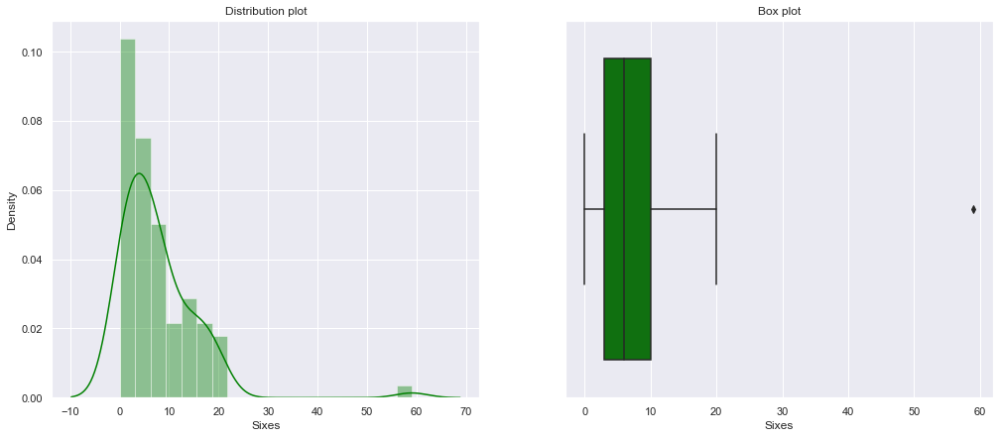

 Total Number of Outliers in Sixes : 1

 Variable is : HF 


C:\Users\Krithya\anaconda3\lib\site-packages\seaborn\distributions.py:2551: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


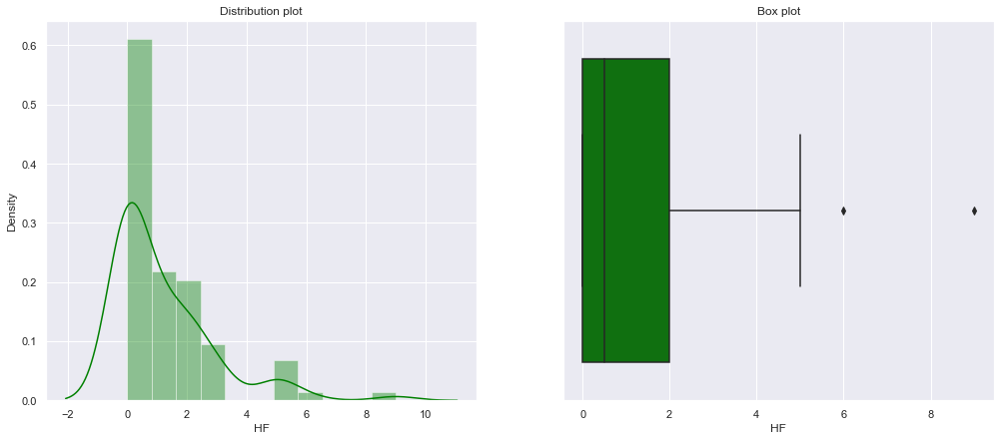

 Total Number of Outliers in HF : 2



In [147]:
for var in df.columns[1:]:
    print('{} Variable is : {} '.format('\033[92m',var))
    f, axes = plt.subplots(1, 2, figsize=(17,7))
    sns.boxplot(x = var, data=df,  orient='h' , ax=axes[1],color='Green').set_title('Box plot')
    sns.distplot(df[var],  ax=axes[0],color='Green').set_title('Distribution plot')
    sns.set(font_scale= 1)
    plt.show()
# Checking Number of outliers
    q1, q3= np.percentile(df[var],[25,75])
    IQR = q3-q1
    lower,upper = q1-1.5*IQR, q3+1.5*IQR
    outliers = ((df[var] < lower) | (df[var] > upper)).sum()
    print('{} Total Number of Outliers in {} : {}'.format('\033[92m',var, outliers))
    print('')

Observation : 
    
- Runs is right skewed with one outlier.

- Ave is right skewed with three outlier.

- SR is left skewed with 5 outliers. Because of IPL, there might be very few players with less striking rate.

- Fours, sixes and Half centuries are right skewed with 3,1 and 2 outliers. There are few players with more fours, sixes and half centuries.

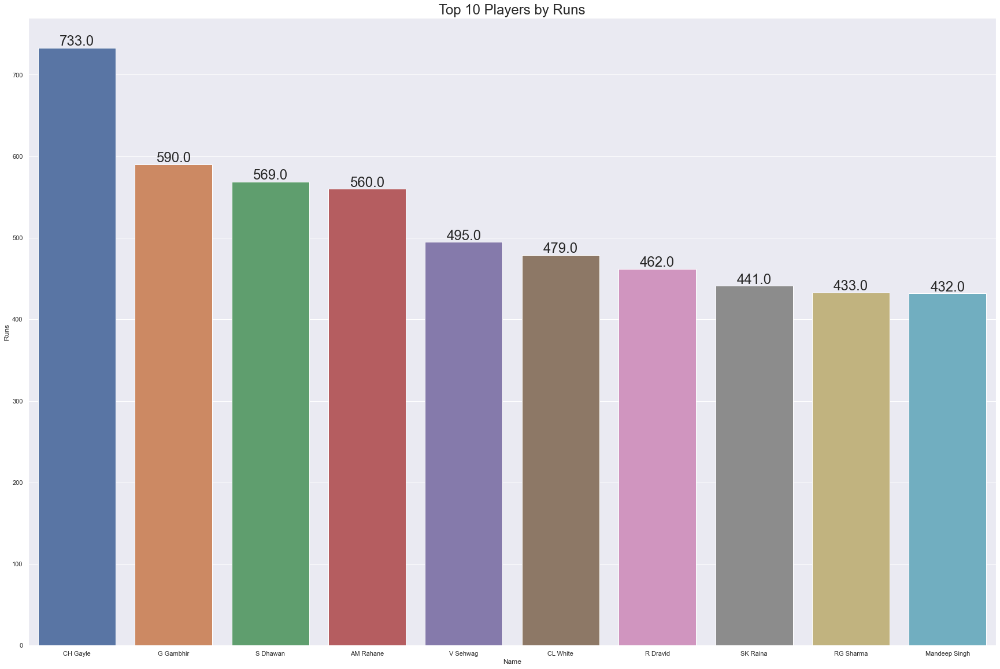

In [148]:
# Lets check top players with more fours, sixes, SR, HF, more runs and Average.
Runs_Top10 = df.sort_values('Runs', ascending= False).head(10)
fig, ax=pyplot.subplots(figsize = (30,20))
ax = sns.barplot(x= 'Name', y = 'Runs', data=Runs_Top10)
sns.set(font_scale=2)
plt.title("Top 10 Players by Runs");
for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(Runs_Top10)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')



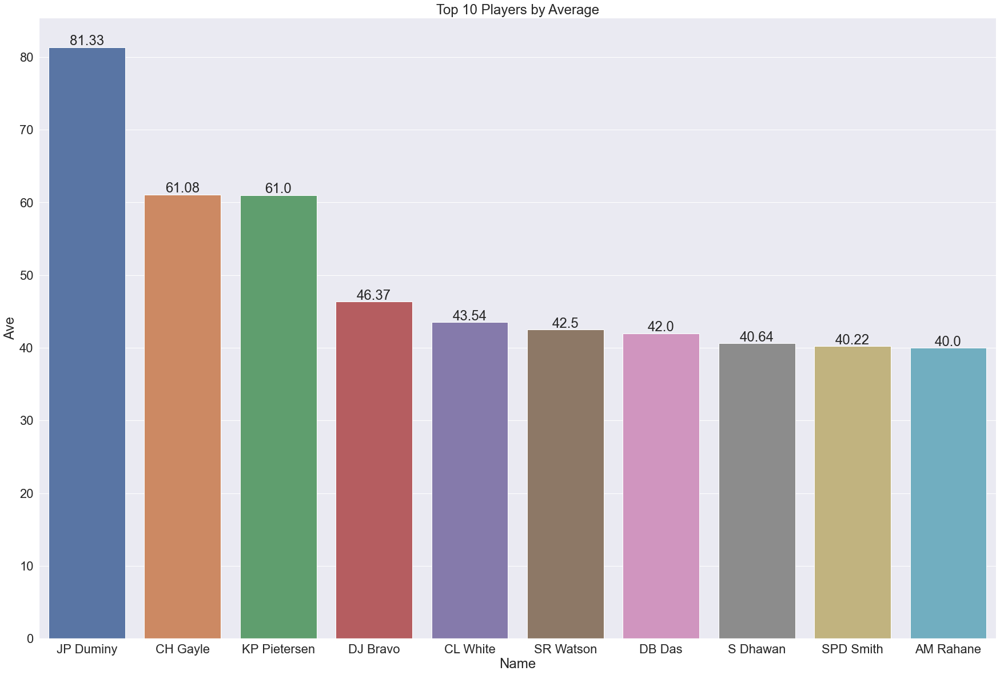

In [149]:
Ave_Top10 = df.sort_values('Ave', ascending= False).head(10)
fig, ax=pyplot.subplots(figsize = (30,20))
ax = sns.barplot(x= 'Name', y = 'Ave', data=Ave_Top10)
sns.set(font_scale=2)
plt.title("Top 10 Players by Average");
for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(Runs_Top10)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


- JP Duminy is number one in position in Average but he is not in most scored top 10 players.

- CH Gayle is best player with number one in runs and number 2 in average.

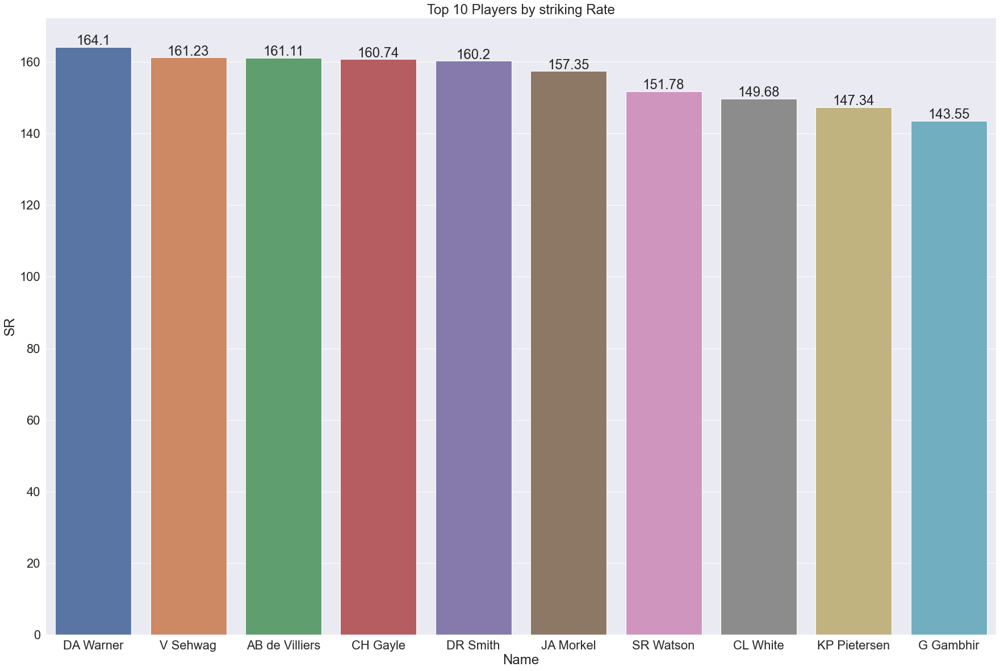

In [150]:
SR_Top10 = df.sort_values('SR', ascending= False).head(10)
fig, ax=pyplot.subplots(figsize = (30,20))
ax = sns.barplot(x= 'Name', y = 'SR', data=SR_Top10)
sns.set(font_scale=2)
plt.title("Top 10 Players by striking Rate");
for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(SR_Top10)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


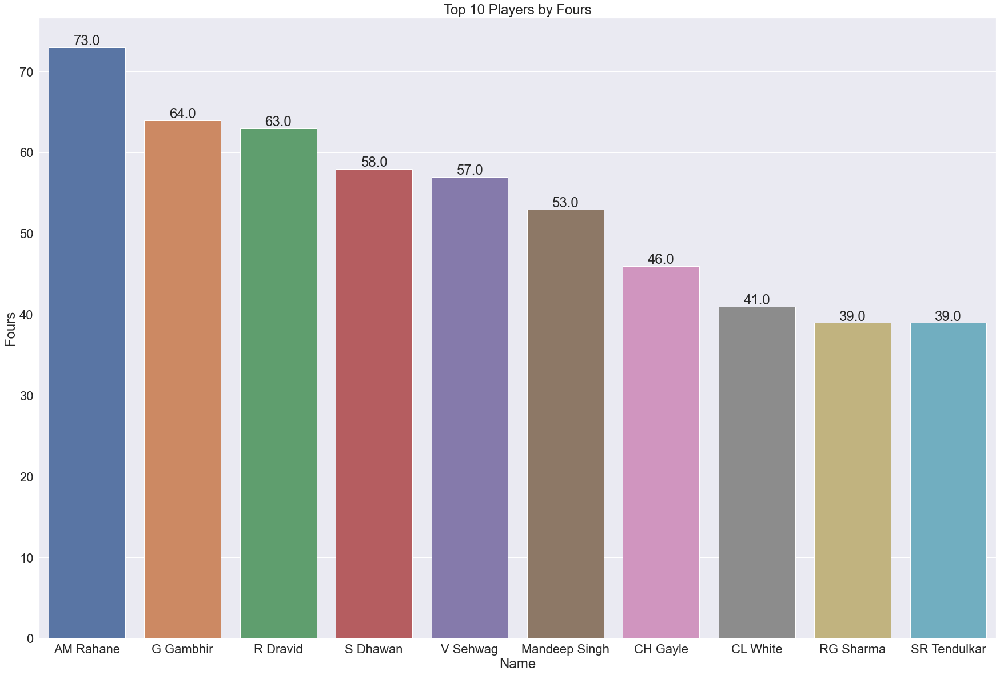

In [151]:
Fours_Top10 = df.sort_values('Fours', ascending= False).head(10)
fig, ax=pyplot.subplots(figsize = (30,20))
ax = sns.barplot(x= 'Name', y = 'Fours', data=Fours_Top10)
sns.set(font_scale=2)
plt.title("Top 10 Players by Fours");
for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(SR_Top10)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


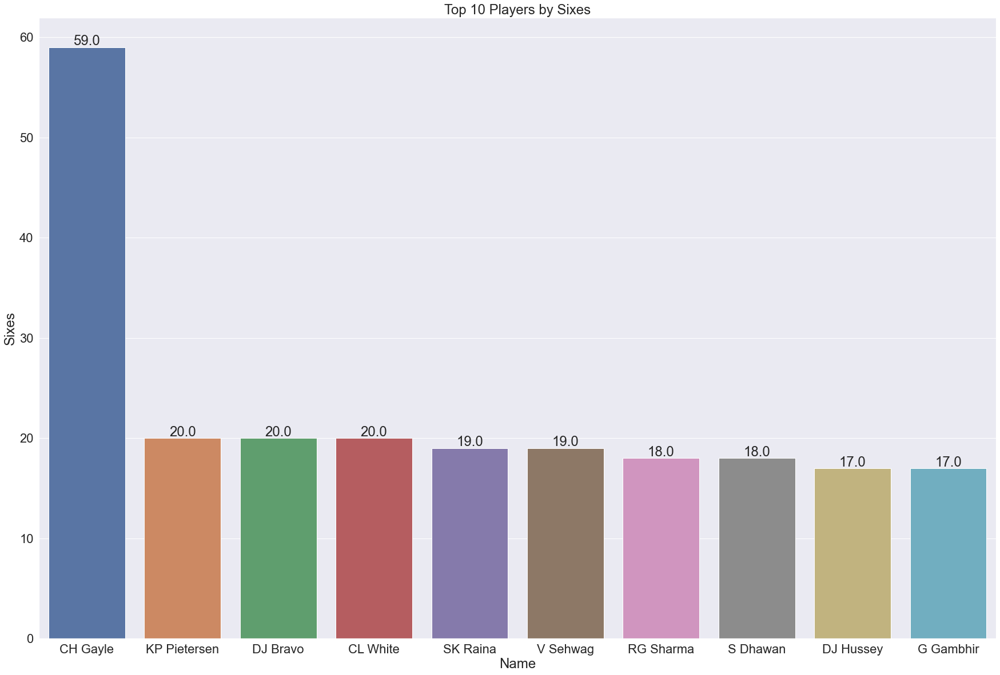

In [152]:
Six_Top10 = df.sort_values('Sixes', ascending= False).head(10)
fig, ax=pyplot.subplots(figsize = (30,20))
ax = sns.barplot(x= 'Name', y = 'Sixes', data=Six_Top10)
sns.set(font_scale=2)
plt.title("Top 10 Players by Sixes");
for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(SR_Top10)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


Gayle is the only player with most sixes in the IPL, others have not reached the half of it.

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:#00b3e5;">Dimensional reduction: perform dimensional reduction on the data

#### Principal Component Analysis :
It is the most popular feature extraction technique.

It creates new variables using linear combinations of old variables and creates variables that are independent of one another.

It manages to tell us how important each of these new variables are and helps in choosing how many variables we can use to get desired accuracy.

Main idea of using PCA is to seek most accurate data representation in lower dimension space and it removes the noise and explore the hidden pattern within the data.

Step by step implementation of PCA is explained below.

In [153]:
#### Step-1: Normalize the data variables between (-1,1).

df_scale = df.iloc[ : , 1:]
df_scale = df_scale.apply(zscore)
df_scale.head()

,Runs,Ave,SR,Fours,Sixes,HF
0,3.301945,2.683984,1.767325,1.607207,6.462679,4.651551
1,2.381639,0.896390,1.036605,2.710928,1.184173,2.865038
2,1.770248,0.610640,1.788154,2.281703,1.435530,2.269533
3,1.667276,1.388883,1.297182,1.300618,1.561209,2.269533
4,2.246490,1.174755,0.444038,2.343021,1.309851,2.269533


#### Step 2: Covariance matrix : It is to describe the correlation between variables in the dataset.
It is the direction of linear relationship between variables.

In [154]:
covMatrix = np.cov(df_scale,rowvar=False)
pd.DataFrame(covMatrix)

,0,1,2,3,4,5
0,1.011236,0.700771,0.499033,0.929132,0.778427,0.844531
1,0.700771,1.011236,0.630613,0.552349,0.690082,0.627728
2,0.499033,0.630613,1.011236,0.389134,0.590504,0.432388
3,0.929132,0.552349,0.389134,1.011236,0.528445,0.792494
4,0.778427,0.690082,0.590504,0.528445,1.011236,0.776322
5,0.844531,0.627728,0.432388,0.792494,0.776322,1.011236


#### Step 3: Eigen vectors : 
These are the principal components and the corresponding eigen values which are the magnitudes of variance captured.

The eigenvectors are nothing but the principal components of our above covariance matrix and represent the axis of new feature space whereas eigenvalues are the magnitude of those vectors.

In [155]:
pca = PCA()
pca.fit(df_scale)

PCA()

In [156]:
# Eignen values
pca.explained_variance_

array([4.30252561, 0.83636692, 0.41665751, 0.32912443, 0.16567829,
       0.01706297])

In [157]:
# Eigen Vectors
pd.DataFrame(pca.components_)

,0,1,2,3,4,5
0,0.458261,0.397973,0.325384,0.405742,0.417335,0.432372
1,0.266432,-0.331118,-0.697803,0.473558,-0.179025,0.275932
2,-0.109779,0.005505,-0.450134,-0.508235,0.669426,0.280825
3,-0.005201,0.847363,-0.432750,-0.032523,-0.248782,-0.178118
4,0.458409,-0.101228,-0.118903,0.096769,0.394580,-0.774867
5,0.704836,-0.060637,0.056249,-0.585142,-0.357862,0.160962


#### Step : 4 Principal components can be imputed by arranging eigen values with corresponding eigen vectors in descending order.

In [158]:
k = 1
total = []
for i in pca.explained_variance_ratio_*100:
    print('Variance explained by Principle Component',k,'is : {:.2f}%'.format(i))
    k+=1
    total.append(i)
print('\nTotal variance explained by all the principle components:',sum(total),'%')

Variance explained by Principle Component 1 is : 70.91%
Variance explained by Principle Component 2 is : 13.78%
Variance explained by Principle Component 3 is : 6.87%
Variance explained by Principle Component 4 is : 5.42%
Variance explained by Principle Component 5 is : 2.73%
Variance explained by Principle Component 6 is : 0.28%

Total variance explained by all the principle components: 100.0 %


###### We observe that First principal component captures the maximum variance i.e. 70.91%, followed by 13.78% and 6.87% and so on.

Since we need to extract the Principal Components that capture about 95% of the variance in the data, we can use below plot.

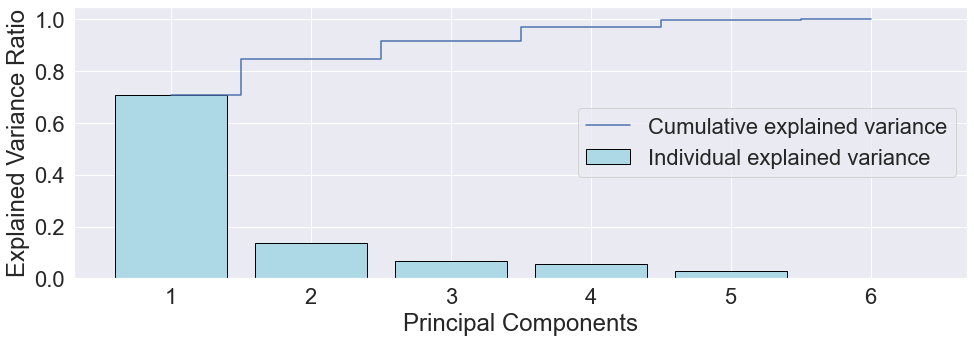

In [159]:
# Implementing scree plot 
plt.figure(figsize=(16 , 5))
plt.bar(range(1, 7), pca.explained_variance_ratio_, label = 'Individual explained variance',color='lightblue',edgecolor='black')
plt.step(range(1, 7), np.cumsum(pca.explained_variance_ratio_),where='mid', label = 'Cumulative explained variance')
plt.ylabel('Explained Variance Ratio')
plt.xlabel('Principal Components')
plt.legend(loc = 'best')
plt.show()

Visually we can observe that there is a steep drop in variance explained with increase in number of PC's.
#### We will proceed with 4 components here as it explains 95% of the variance
With only 4 variables/PC's we can explain over 95% of the variation in the original data.

#### Step 5: Finally Original Data can be projected using principal components in reduced dimensions.

In [160]:
# Generating 4 PCA dimensions (dimensionality reduction from 6 to 4)
# n_components=4 implies 4 Principal components.
pca2 = PCA(n_components=4)
pca2.fit(df_scale)

PCA(n_components=4)

In [161]:
# Eigen Vectors (transformed into 4 dimensions)
pd.DataFrame(pca2.components_).T

,0,1,2,3
0,0.458261,0.266432,-0.109779,-0.005201
1,0.397973,-0.331118,0.005505,0.847363
2,0.325384,-0.697803,-0.450134,-0.432750
3,0.405742,0.473558,-0.508235,-0.032523
4,0.417335,-0.179025,0.669426,-0.248782
5,0.432372,0.275932,0.280825,-0.178118


In [162]:
# Eigen Values
pca2.explained_variance_

array([4.30252561, 0.83636692, 0.41665751, 0.32912443])

In [163]:
pca2.explained_variance_ratio_

array([0.70911996, 0.13784566, 0.06867133, 0.05424458])

In [164]:
# Percentage of variance explained by 4 Principal components
sum(pca2.explained_variance_ratio_*100)

96.98815324499074

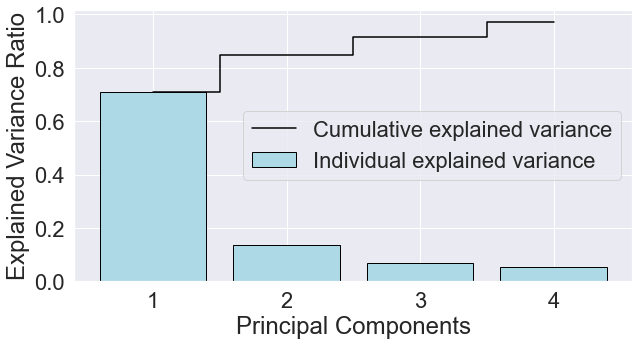

In [165]:
# Now Implementing scree plot on 4 variables
plt.figure(figsize=(10 , 5))  # size of the plot

# bar plot
plt.bar(range(1, 5), pca2.explained_variance_ratio_, label = 'Individual explained variance',color='lightblue',edgecolor='black')

# step plot on bars which is a cummulative sum of the variance explained by 4 principal components
plt.step(range(1, 5), np.cumsum(pca2.explained_variance_ratio_),where='mid', label = 'Cumulative explained variance',color = 'black')

plt.ylabel('Explained Variance Ratio')  # x axis label
plt.xlabel('Principal Components')      # y axis label
plt.legend()

In [166]:
#transforming the 6 dimension into 4 new dimension using Principal Component Analysis
pca_transformed =  pca2.transform(df_scale)

In [167]:
# shape of pca_transformed data
pca_transformed.shape

(90, 4)

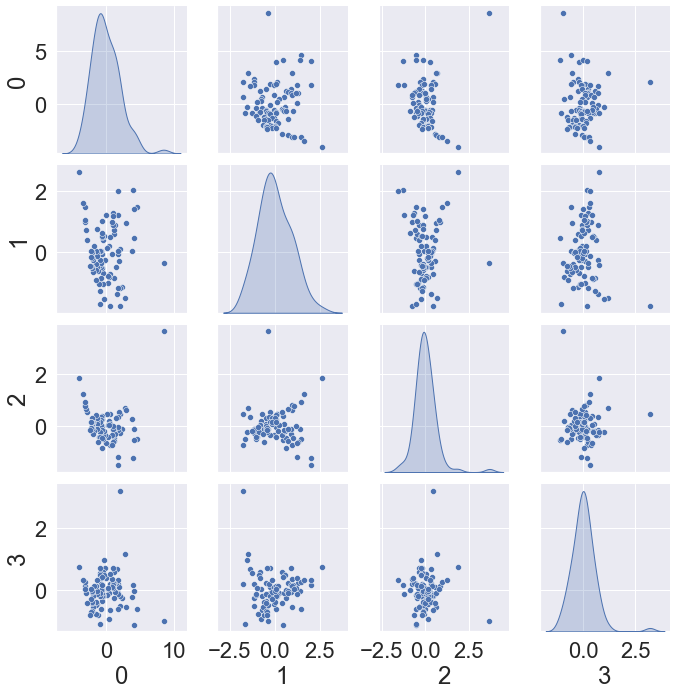

In [168]:
# Visualising the new data with pair plots since the new variable will be independent of each other.
sns.pairplot(pd.DataFrame(pca_transformed),diag_kind = 'kde')

 Pairplot clearly shows there is no Collinearity between the variables, hence correlation is close to zero. So we could able to decrease the correlation between independent variables.

In [169]:
pca_transformed = pd.DataFrame(pca_transformed)
pca_transformed.head()

,0,1,2,3
0,8.516774,-0.354575,3.672474,-0.996267
1,4.618340,1.476730,-0.503630,-0.594494
2,4.142251,0.471438,-0.557204,-1.101184
3,3.899411,0.041816,0.262143,-0.228085
4,4.120072,1.401002,-0.116643,-0.014712


In [170]:
pca_transformed.shape

(90, 4)

**Adding Name column to new transformed data with four principal components**

In [172]:
pca_transformed['Name'] = df['Name']

In [173]:
pca_transformed.head()

,0,1,2,3,Name
0,8.516774,-0.354575,3.672474,-0.996267,CH Gayle
1,4.618340,1.476730,-0.503630,-0.594494,G Gambhir
2,4.142251,0.471438,-0.557204,-1.101184,V Sehwag
3,3.899411,0.041816,0.262143,-0.228085,CL White
4,4.120072,1.401002,-0.116643,-0.014712,S Dhawan


In [174]:
pca_transformed.columns = ['pc1', 'pc2', 'pc3', 'pc4', 'Name']
pca_transformed.head()

,pc1,pc2,pc3,pc4,Name
0,8.516774,-0.354575,3.672474,-0.996267,CH Gayle
1,4.618340,1.476730,-0.503630,-0.594494,G Gambhir
2,4.142251,0.471438,-0.557204,-1.101184,V Sehwag
3,3.899411,0.041816,0.262143,-0.228085,CL White
4,4.120072,1.401002,-0.116643,-0.014712,S Dhawan


In [176]:
pca_transformed['Total_score'] = pca_transformed['pc1']+pca_transformed['pc2']+pca_transformed['pc3']+pca_transformed['pc4']
pca_transformed.head()

,pc1,pc2,pc3,pc4,Name,Total_score
0,8.516774,-0.354575,3.672474,-0.996267,CH Gayle,10.838406
1,4.618340,1.476730,-0.503630,-0.594494,G Gambhir,4.996945
2,4.142251,0.471438,-0.557204,-1.101184,V Sehwag,2.955301
3,3.899411,0.041816,0.262143,-0.228085,CL White,3.975285
4,4.120072,1.401002,-0.116643,-0.014712,S Dhawan,5.389718


**Now arranged all players with total score**

**Below arranged all players as per ranking based on total score derived from 4 principal components**

In [177]:
pca_transformed = pca_transformed.sort_values('Total_score', ascending= False)
pca_transformed.head(10)

,pc1,pc2,pc3,pc4,Name,Total_score
0,8.516774,-0.354575,3.672474,-0.996267,CH Gayle,10.838406
4,4.120072,1.401002,-0.116643,-0.014712,S Dhawan,5.389718
1,4.618340,1.476730,-0.503630,-0.594494,G Gambhir,4.996945
5,4.024436,2.025082,-1.245706,0.170916,AM Rahane,4.974729
9,2.081642,-1.757938,0.464029,3.190717,JP Duminy,3.978450
3,3.899411,0.041816,0.262143,-0.228085,CL White,3.975285
7,2.919015,0.943018,0.625199,-0.525047,RG Sharma,3.962186
6,2.879281,-1.494354,0.694595,1.163232,KP Pietersen,3.242753
2,4.142251,0.471438,-0.557204,-1.101184,V Sehwag,2.955301
19,1.834522,1.991019,-1.546734,0.319983,R Dravid,2.598791


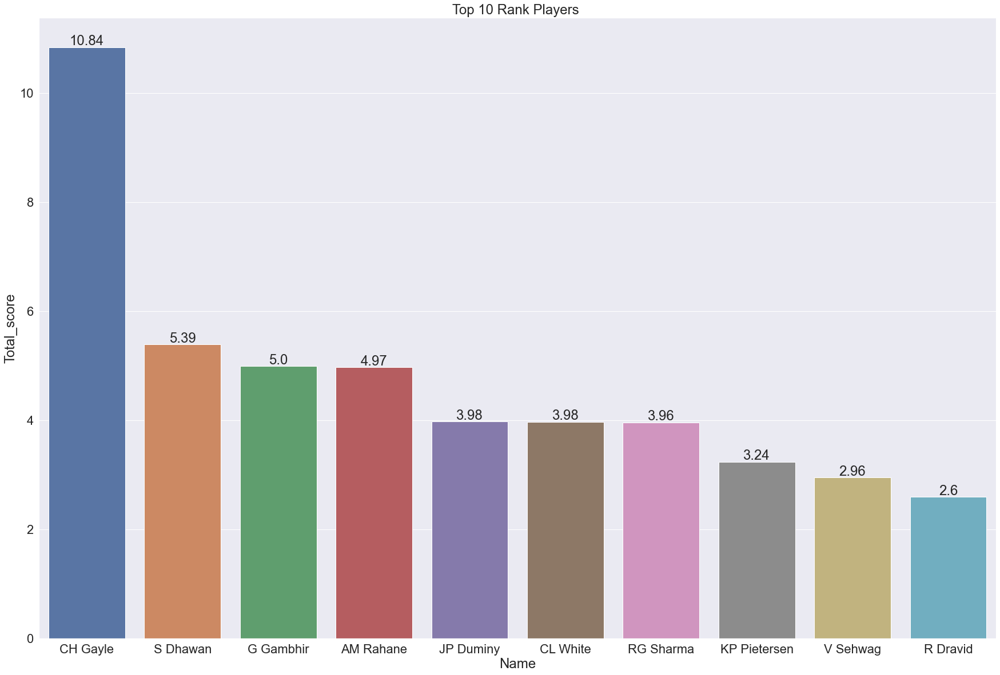

In [178]:
Score_Top10 = pca_transformed.sort_values('Total_score', ascending= False).head(10)
fig, ax=pyplot.subplots(figsize = (30,20))
ax = sns.barplot(x= 'Name', y = 'Total_score', data=Score_Top10)
sns.set(font_scale=2)
plt.title("Top 10 Rank Players ");
for p in ax.patches: 
    ax.annotate(str((np.round(p.get_height()/len(SR_Top10)*10,decimals=2))), (p.get_x()+p.get_width()/2., p.get_height()), ha='center', va='center', xytext=(0, 10), textcoords='offset points')


**Above are top ten rank players**

<span style="font-family: Arial; font-weight:bold;font-size:1.5em;color:DarkBlue">********@@@@@@@ Part Five @@@@@@********

**What is Dimensionali Reduction Technique :** 

- Dimensionality reduction, or dimension reduction, is the transformation of data from a high-dimensional space into a low-dimensional space so that the low-dimensional representation retains some meaningful properties of the original data, ideally close to its intrinsic dimension. 


**Why is Dimensionality Reduction required?**

Here are some of the benefits of applying dimensionality reduction to a dataset:

- Space required to store the data is reduced as the number of dimensions comes down
- Less dimensions lead to less computation/training time
- Some algorithms do not perform well when we have a large dimensions. So reducing these dimensions needs to happen for the algorithm to be useful
- It takes care of multicollinearity by removing redundant features. For example, you have two variables – ‘time spent on treadmill in minutes’ and ‘calories burnt’. These variables are highly correlated as the more time you spend running on a treadmill, the more calories you will burn. Hence, there is no point in storing both as just one of them does what you require
- It helps in visualizing data. As discussed earlier, it is very difficult to visualize data in higher dimensions so reducing our space to 2D or 3D may allow us to plot and observe patterns more clearly


### **Common Dimensionality Reduction Techniques**

### Dimensionality reduction techniques can be classified into two 3 types

### Feature selection: <br/>

- **Missing Value Ratio:** If the dataset has too many missing values, we use this approach to reduce the number of variables. We can drop the variables having a large number of missing values in them

- **Low Variance filter:** We apply this approach to identify and drop constant variables from the dataset. The target variable is not unduly affected by variables with low variance, and hence these variables can be safely dropped

- **High Correlation filter:** A pair of variables having high correlation increases multicollinearity in the dataset. So, we can use this technique to find highly correlated features and drop them accordingly
 
- **Random Forest:** This is one of the most commonly used techniques which tells us the importance of each feature present in the dataset. We can find the importance of each feature and keep the top most features, resulting in dimensionality reduction

- Both **Backward Feature Elimination** and **Forward Feature Selection** techniques take a lot of computational time and are thus generally used on smaller datasets

### Components / Factor Based: <br/>

- **Factor Analysis:** This technique is best suited for situations where we have highly correlated set of variables. It divides the variables based on their correlation into different groups, and represents each group with a factor

- **Principal Component Analysis:** This is one of the most widely used techniques for dealing with linear data. It divides the data into a set of components which try to explain as much variance as possible

- **Independent Component Analysis:** We can use ICA to transform the data into independent components which describe the data using less number of components

### Projection Based: <br/>

- **ISOMAP:** We use this technique when the data is strongly non-linear

- **t-SNE:** This technique also works well when the data is strongly non-linear. It works extremely well for visualizations as well

- **UMAP:** This technique works well for high dimensional data. Its run-time is shorter as compared to t-SNE

### Application: Exploring Handwritten Digits


In [17]:
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn.decomposition import PCA
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

In [3]:
from sklearn.datasets import load_digits
digits = load_digits()
digits.images.shape

(1797, 8, 8)

The images data is a three-dimensional array: 1,797 samples, each consisting of an
8×8 grid of pixels.

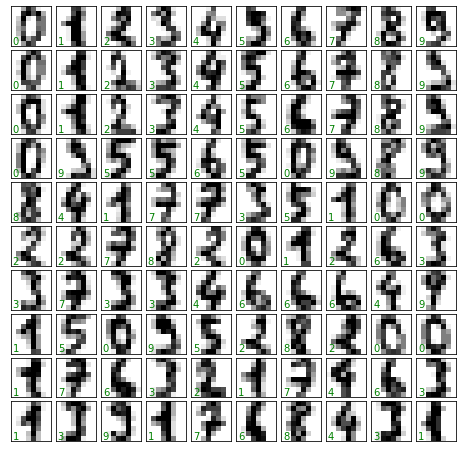

In [4]:
# visualize the first hundred of these
import matplotlib.pyplot as plt
fig, axes = plt.subplots(10, 10, figsize=(8, 8),
subplot_kw={'xticks':[], 'yticks':[]},
gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i,ax in enumerate(axes.flat):
    ax.imshow(digits.images[i], cmap='binary', interpolation='nearest')
    ax.text(0.05, 0.05, str(digits.target[i]),
    transform=ax.transAxes, color='green')

In [5]:
#two-dimensional,[n_samples, n_features] representation
X = digits.data
X.shape

(1797, 64)

In [6]:
y = digits.target
y.shape

(1797,)

 1,797 samples and 64 features.

In [7]:
#transform the data to two dimensions using manifold learning algorithm called Isomap
from sklearn.manifold import Isomap
iso = Isomap(n_components=2)
iso.fit(digits.data)
data_projected = iso.transform(digits.data)
data_projected.shape

(1797, 2)

 The projected data is now two-dimensional

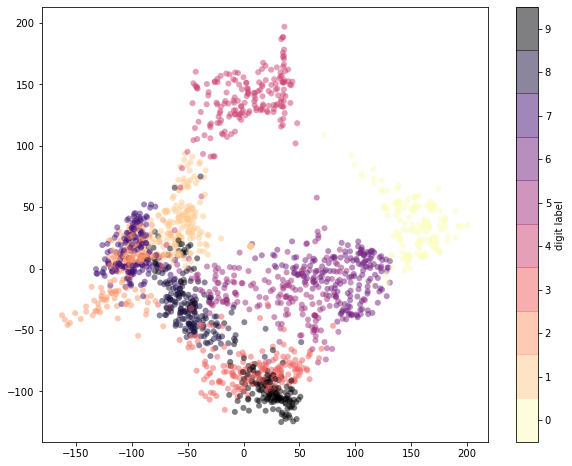

In [8]:
# plot this data to see if we can learn anything from its structure 
plt.figure(figsize=(10, 8))
plt.scatter(data_projected[:, 0], data_projected[:, 1], c=digits.target,edgecolor='none', alpha=0.5,cmap=plt.cm.get_cmap('magma_r', 10))
plt.colorbar(label='digit label', ticks=range(10))
plt.clim(-0.5, 9.5);


In [9]:
from sklearn.model_selection import train_test_split
 # Split X and y into training and test set in 70:30 ratio

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=15)

In [10]:
#fit a Gaussian naive Bayes model
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_train, y_train)
pred = model.predict(X_test)

In [11]:
# gauge its accuracy by comparing the true values of the test set to the predictions
from sklearn.metrics import accuracy_score
accuracy_score(y_test, pred)

0.8407407407407408

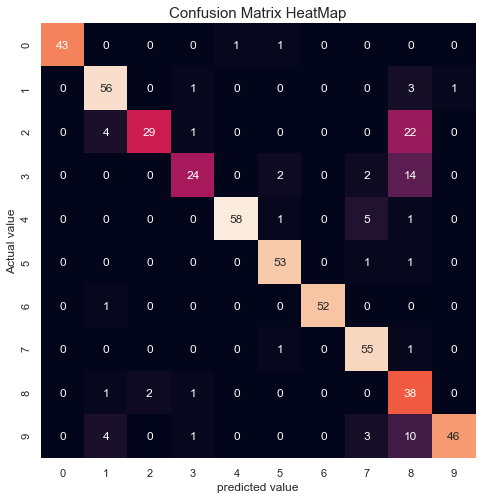

In [12]:
from sklearn.metrics import confusion_matrix
import seaborn as sns
%matplotlib inline 
sns.set(color_codes=True)
#visualization of confusion matrix in the form of a heatmap
plt.figure(figsize = (12, 8))
mat = confusion_matrix(y_test, pred)
sns.heatmap(mat, square=True, annot=True, cbar=False)
plt.xlabel('predicted value')
plt.ylabel('Actual value');
plt.title('Confusion Matrix HeatMap', fontsize = 15);

This shows us where the mislabeled points tend to be: for example, a large number of
twos here are misclassified as either ones or eights

Another way to gain intuition into
the characteristics of the model is to plot the inputs again, with their predicted labels.
We’ll use green for correct labels, and red for incorrect labels

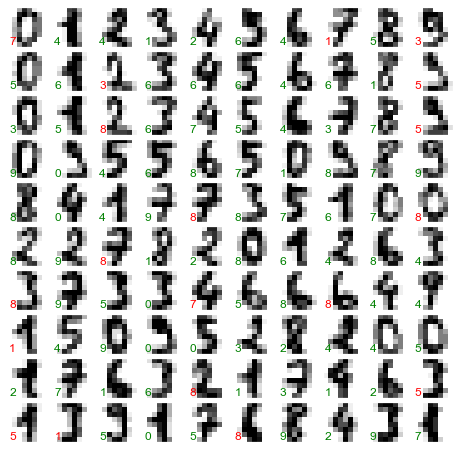

In [13]:

fig, axes = plt.subplots(10, 10, figsize=(8, 8),
 subplot_kw={'xticks':[], 'yticks':[]},
 gridspec_kw=dict(hspace=0.1, wspace=0.1))

for i, ax in enumerate(axes.flat):
    ax.imshow(digits.images[i], cmap='binary', interpolation='nearest')
    ax.text(0.05, 0.05, str(pred[i]),
    transform=ax.transAxes,
    color='green' if (y_test[i] == pred[i]) else 'red')

In [18]:
pca_dims = PCA()
pca_dims.fit(X_train)
cumsum = np.cumsum(pca_dims.explained_variance_ratio_)
d = np.argmax(cumsum >= 0.95) + 1

In [19]:
d

28

Let's train PCA on our training set and transform the data, then print out an example

In [20]:
pca = PCA(n_components=d)
X_reduced = pca.fit_transform(X_train)
X_recovered = pca.inverse_transform(X_reduced)

In [21]:
print("reduced shape: " + str(X_reduced.shape))
print("recovered shape: " + str(X_recovered.shape))

reduced shape: (1257, 28)
recovered shape: (1257, 64)


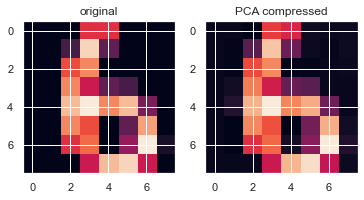

In [23]:
f = plt.figure()
f.add_subplot(1,2, 1)
plt.title("original")
plt.imshow(X_train[0].reshape((8,8)))
f.add_subplot(1,2, 2)

plt.title("PCA compressed")
plt.imshow(X_recovered[0].reshape((8,8)))
plt.show(block=True)

You can see it's far from perfect, but it's still clear what shape the hand is making

Let's retrain our model with the dimensionally reduced training data

In [25]:
#fit a Gaussian naive Bayes model
from sklearn.naive_bayes import GaussianNB
model = GaussianNB()
model.fit(X_reduced, y_train)
pred = modmodelel.predict(X_reduced)

In [27]:
X_test_reduced = pca.transform(X_test)
y_hat_reduced = model.predict(X_test_reduced)
accuracy_score(y_test, y_hat_reduced)

0.9407407407407408

And as you can see we've taken this simple model from ~84% accuracy on the test set to ~94% by reducing from 64 to 28